In [ ]:
function ClickConnect(){
    console.log("Working"); 
    document.querySelector("colab-toolbar-button#connect").click() 
}
setInterval(ClickConnect,60000)

#Data Preprocessing

In [ ]:
''' Imports for loading stuff in .p form from Google Drive into arrays.'''
import os
import pickle
import numpy as np

def load_input_data(storage_folder, which_kind):
	"""
	Unpickle the data stored in the folder. The name of the measurement data
	inside the folder is considered as 'data_arrays_which_kind-data-' + standards.
	The measurement data for each standard is returned in a list.	Standard must be
  a list of Strings. The data is loaded in the order of the standards.
	"""

  # Declare variables in this scope.
	x_data = None
	data_file = None
	
  # Decide which input data to load.
	if which_kind == 'iq':
		data_file = 'data_iq.p'
	elif which_kind == 'fft':
		data_file = 'data_fft.p'
	else:
		raise ValueError('Parameter which_kind must be "iq" for IQ-data or "fft" for FFT-data.')

  # Data is loaded in the form of a byte stream for pickle and the 'latin-1'
  # encoding is used to read the data initially generated for Python 2.7

  # Load input data (x). 
	data_path = os.path.join(storage_folder, data_file)
	with open(data_path, mode='rb') as storage:
	  x_data = pickle.load(storage, encoding='latin-1')
	
	return x_data

def load_output_data(storage_folder):
	"""
	Unpickle the label data stored in the folder. The label data is considered as 
  'labels-data-' + standards.	The label data for each standard is returned in a 
  list of integers. The labels are loaded in the order of the standards.
	"""

  # Declare variables in this scope.
	y_data = None

  # Data is loaded in the form of a byte stream for pickle and the 'latin-1'
  # encoding is used to read the data initially generated for Python 2.7
  
  # Load output data/labels (y).
	label_file = 'labels.p'
	label_path = os.path.join(storage_folder, label_file)
	with open(label_path, mode='rb') as storage:
		y_data = pickle.load(storage, encoding='latin-1')

	return y_data

def normalize_data(x):
	"""
  x is a numpy array which should be normalized. Normalizes the training data
  to have a train_mean of 0 and a standard deviation of 1. Removes bias in the 
  data for better training. Returns the normalized data in the same format.
	"""
 
  # Subtract mean and divide by standard deviation to normalize.
	flat_x = x.flatten()
	return ((x - np.mean(flat_x))/np.std(flat_x))

In [ ]:
from google.colab import drive

drive.mount('/gdrive/')
!ls /gdrive
folder = '/gdrive/MyDrive/Wireless_Interference_Identification_Dataset2'

Mounted at /gdrive/
MyDrive


In [ ]:
# Load 'fft' data.
x_data_fft_data = load_input_data(folder, 'fft')

# Load the labels.
y_labels_data= load_output_data(folder)

## Format of Data

The data structure is a 5-dimensional tensor of the below structure.

*15 x 21 x 715 x 128 x 2 - Tensor*
*Label x SNR x Snapshot x Samples x IQ Data*


**Description of Snapshots:**

Each snapshot has 128 complex samples. The real and imaginary component are
represented by the last dimension.

'iq'- Time series of IQ samples

'fft'- Frequency samples of FFT of IQ series 


**Label:**

0..9: Bluetooth signal at center frequency of 2422 MHz + Label * 1 MHz representing channels 20-29 respectively.

10..12: WiFi (802.11b/g) signal at center frequency of 2422 MHz + (Label - 10) * 5 MHz representing channels 3, 4, 5 respectively.

13..14: Zigbee (802.15.4) signal at center frequency of 2425 MHz + (Label - 13) * 5 MHz
representing channels 15 and 16.

The frequency offset is necessary because different offsets expose different
channels of the signals as in the below.


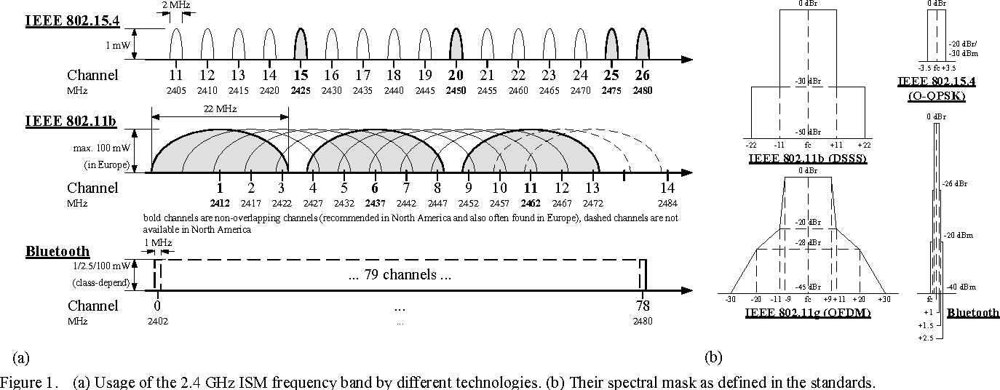

**SNR:**

0..20: SNR between -20 dB...20 dB with the step size of 2 dB, (e.g. index 6 referres to SNR of -8 dB).

Stronger SNRs represent easier to identify stronger signals but we train the
neural network on signals of all SNR.

**Snapshot:**

0..714: Number of the snapshots per Label

**Samples:**

0..127: Sample number per snapshot

**iq:**

0: In-Phase

1: Quadrature

# Models

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, BatchNormalization, LeakyReLU, Dropout, Conv2D, Flatten

In [ ]:
# Define CNN2 with two hidden layers
def cnn2_model():
	# Create model
	model = Sequential(
    [      
      Conv2D(256, kernel_size = (3, 1), padding = "same", input_shape = (128, 2, 1)),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      Conv2D(64, kernel_size = (3, 2), padding = "same"),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      Flatten(),
      Dense(512),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      Dense(64),
      BatchNormalization(),
      LeakyReLU(),
      Dense(15, activation='softmax'),
    ]
  )
  # Compile model
	model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
	return model

print(cnn2_model().summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 2, 256)       1024      
_________________________________________________________________
dropout (Dropout)            (None, 128, 2, 256)       0         
_________________________________________________________________
batch_normalization (BatchNo (None, 128, 2, 256)       1024      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128, 2, 256)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 2, 64)        98368     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128, 2, 64)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 128, 2, 64)        2

In [ ]:
# Define CNN2 with two hidden layers
def cnn2_model_signalType():
	# Create model
	model = Sequential(
    [      
      Conv2D(256, kernel_size = (3, 1), padding = "same", input_shape = (128, 2, 1)),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      Conv2D(64, kernel_size = (3, 2), padding = "same"),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      Flatten(),
      Dense(512),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      Dense(64),
      BatchNormalization(),
      LeakyReLU(),
      Dense(3, activation='softmax'),
    ]
  )
  # Compile model
	model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
	return model

print(cnn2_model_signalType().summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 128, 2, 256)       1024      
_________________________________________________________________
dropout_3 (Dropout)          (None, 128, 2, 256)       0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 128, 2, 256)       1024      
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 128, 2, 256)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 128, 2, 64)        98368     
_________________________________________________________________
dropout_4 (Dropout)          (None, 128, 2, 64)        0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 128, 2, 64)       

In [ ]:
from matplotlib import pyplot

def summarize_model(history):

  pyplot.plot(history.history['accuracy'])
  pyplot.plot(history.history['val_accuracy']) 
  pyplot.title('Model train and validation accuracy')
  pyplot.ylabel('Accuracy')
  pyplot.xlabel('Epoch')
  pyplot.legend(['train', 'validation'], loc='upper right')
  pyplot.show()

  pyplot.plot(history.history['loss'])
  pyplot.plot(history.history['val_loss'])  
  pyplot.title('Model train and validation loss')
  pyplot.ylabel('Loss')
  pyplot.xlabel('Epoch')
  pyplot.legend(['train', 'validation'], loc='upper right')
  pyplot.show()

# Whole data

In [ ]:
x_dim = x_data_fft_data.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]
print(num_snapshots_per_tech)

15015


In [ ]:
y_labels = y_labels_data.flatten()
x_data_fft = np.reshape(x_data_fft_data, (total_num_snapshots, x_dim[3], x_dim[4]))

from sklearn.preprocessing import StandardScaler
scaler_std = StandardScaler()

fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft, (total_num_snapshots, num_samples*2)))
fft_data_2d = np.reshape(fft_data_flat, (total_num_snapshots, num_samples, 2))
fft_data_iq = fft_data_2d.reshape(-1, num_samples, 2, 1)

from keras.utils.np_utils import to_categorical
y_labels_one_hot_all = to_categorical(y_labels)

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test_valid, Y_train, Y_test_valid = train_test_split(fft_data_iq, y_labels_one_hot_all, test_size=0.4)
X_validation, X_test, Y_validation, Y_test = train_test_split(X_test_valid, Y_test_valid, test_size=0.5)

In [ ]:
from keras import models

x_models = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_allSNR.tf"))
pred = x_models.predict(X_test)

In [ ]:
Y_pred = np.zeros(shape=(45045,15))
for i in range(pred.shape[0]):
  temp_max = max(pred[i])
  for j in range(15):
    if(temp_max == pred[i][j]):
      Y_pred[i][j] = 1

In [ ]:
y_act = np.argmax(Y_test, axis = 1)
y_pred = np.argmax(Y_pred, axis = 1)

              precision    recall  f1-score   support

           0       0.97      0.96      0.97      3070
           1       0.96      0.97      0.96      2957
           2       0.98      0.96      0.97      2996
           3       0.97      0.94      0.95      3074
           4       0.96      0.98      0.97      2935
           5       0.97      0.97      0.97      2996
           6       0.97      0.98      0.97      2979
           7       0.97      0.97      0.97      3034
           8       0.97      0.93      0.95      3001
           9       0.97      0.96      0.97      3010
          10       0.88      0.86      0.87      3058
          11       0.80      0.84      0.82      3010
          12       0.83      0.85      0.84      2960
          13       0.93      0.94      0.93      3002
          14       0.92      0.94      0.93      2963

    accuracy                           0.94     45045
   macro avg       0.94      0.94      0.94     45045
weighted avg       0.94   

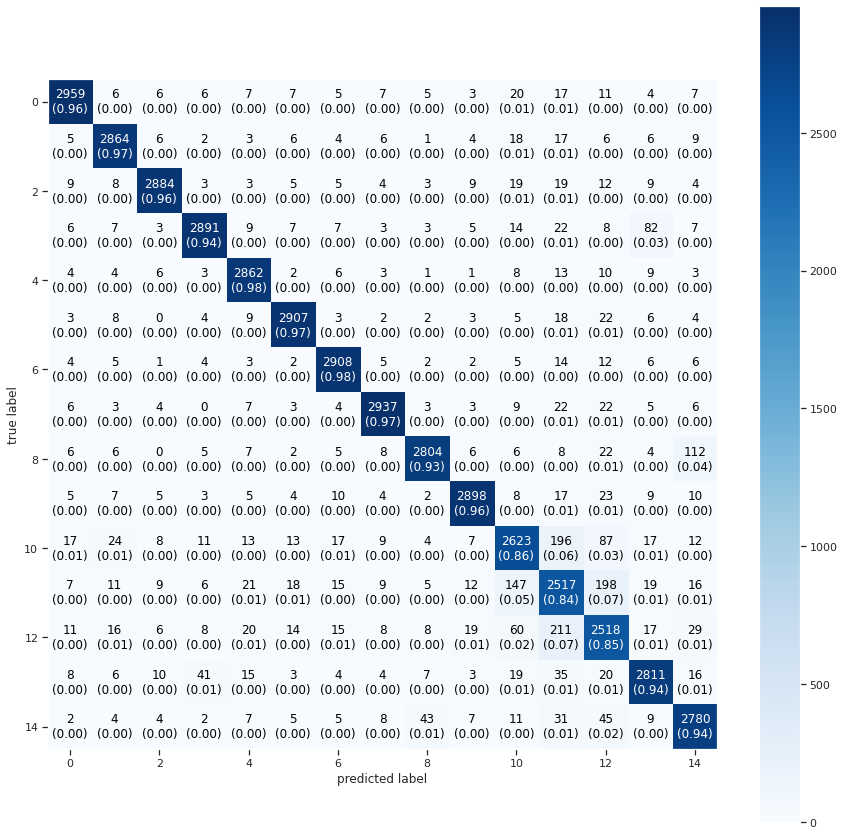

In [ ]:
from mlxtend.plotting import plot_confusion_matrix

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

f = confusion_matrix(y_act, y_pred, labels = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14])
class_names = ['Bluetooth CH20', 'Bluetooth CH21', 'Bluetooth CH22', 'Bluetooth CH23', 'Bluetooth CH24', 'Bluetooth CH25', 'Bluetooth CH26', 'Bluetooth CH27', 'Bluetooth CH28', 'Bluetooth CH29', 'WiFi CH3', 'WiFi CH4', 'WiFi CH5', 'ZigBee CH15', 'ZigBee CH16']
plot_confusion_matrix(conf_mat = f, figsize=(15,15), colorbar=True, show_normed=True)
print(classification_report(y_act, y_pred, labels = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14]))
#labels = ['Bluetooth CH20', 'Bluetooth CH21', 'Bluetooth CH22', 'Bluetooth CH23', 'Bluetooth CH24', 'Bluetooth CH25', 'Bluetooth CH26', 'Bluetooth CH27', 'Bluetooth CH28', 'Bluetooth CH29', 'WiFi CH3', 'WiFi CH4', 'WiFi CH5', 'ZigBee CH15', 'ZigBee CH16']

In [ ]:
import math
x = np.zeros(shape=(15,))
m = max(pred[-2])
for i in range(15):
  if pred[-2][i] == m:
    x[i] = 1
x, Y_test[-2]

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]),
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       dtype=float32))

In [ ]:
from keras.callbacks import EarlyStopping
ES = EarlyStopping(monitor = 'val_accuracy', mode = 'max', min_delta = 0.00001, patience = 200, verbose = 1)

import logging
logging.disable(logging.WARNING)

In [ ]:
cnn_learning = cnn2_model()

epochs = 200
batch_size = 1024

history = cnn_learning.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])

Epoch 1/200
132/132 [==============================] - 50s 366ms/step - loss: 0.9569 - accuracy: 0.7496 - val_loss: 1.7889 - val_accuracy: 0.3405
Epoch 2/200
132/132 [==============================] - 48s 361ms/step - loss: 0.4663 - accuracy: 0.8685 - val_loss: 1.4124 - val_accuracy: 0.4848
Epoch 3/200
132/132 [==============================] - 48s 360ms/step - loss: 0.4170 - accuracy: 0.8762 - val_loss: 0.8284 - val_accuracy: 0.7063
Epoch 4/200
132/132 [==============================] - 47s 360ms/step - loss: 0.4000 - accuracy: 0.8778 - val_loss: 0.5225 - val_accuracy: 0.8417
Epoch 5/200
132/132 [==============================] - 48s 360ms/step - loss: 0.3750 - accuracy: 0.8817 - val_loss: 0.4751 - val_accuracy: 0.8583
Epoch 6/200
132/132 [==============================] - 48s 361ms/step - loss: 0.3583 - accuracy: 0.8866 - val_loss: 0.4072 - val_accuracy: 0.8745
Epoch 7/200
132/132 [==============================] - 47s 360ms/step - loss: 0.3535 - accuracy: 0.8864 - val_loss: 0.4082 -

TypeError: ignored


Evaluating on Test data : Score of SNR = 89.24853205680847



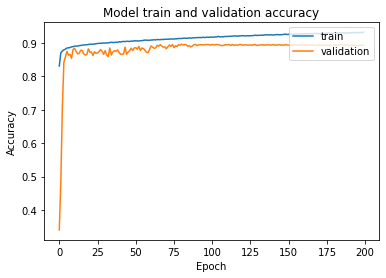

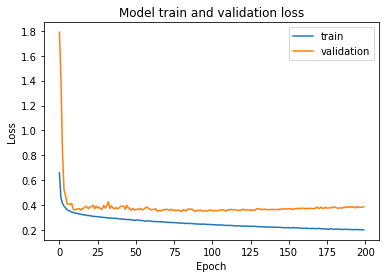


Training Accuracy Array:  [0.8307322263717651, 0.8702260851860046, 0.8756502866744995, 0.879098653793335, 0.8812150955200195, 0.8845228552818298, 0.885322093963623, 0.8860324621200562, 0.8879712820053101, 0.8887779116630554, 0.8900728821754456, 0.890494704246521, 0.8905020952224731, 0.8918045163154602, 0.8923224806785583, 0.89320307970047, 0.8936766982078552, 0.8940836787223816, 0.8949568867683411, 0.8950678706169128, 0.8960224986076355, 0.895852267742157, 0.8962963223457336, 0.896510899066925, 0.8977171182632446, 0.8980057239532471, 0.8987160921096802, 0.898575484752655, 0.8990787267684937, 0.8997151255607605, 0.8993303179740906, 0.9000777006149292, 0.9000850915908813, 0.9007585048675537, 0.9019721150398254, 0.9010692834854126, 0.9011951088905334, 0.9021127223968506, 0.9013283252716064, 0.9034520983695984, 0.9024235010147095, 0.903822124004364, 0.9043179154396057, 0.9038590788841248, 0.9047101140022278, 0.9047175049781799, 0.9041625261306763, 0.9053094983100891, 0.9050949215888977, 0

In [ ]:
score = cnn_learning.evaluate(X_test, Y_test, verbose=0)
print('\nEvaluating on Test data : Score of SNR = ' + str(score[1]*100) +'\n')

summarize_model(history)
cnn_learning.save("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_allSNR.tf")

print("\nTraining Accuracy Array: ", history.history['accuracy'])
print("\nValidation Accuracy Array: ", history.history['val_accuracy'])

# High SNR 

In [ ]:
x_data_fft_high_SNR = x_data_fft_data[:,10:21]
y_labels_high_SNR = y_labels_data[:,10:21]

print(x_data_fft_high_SNR.shape)
print(y_labels_high_SNR.shape)

(15, 11, 715, 128, 2)
(15, 11, 715)


In [ ]:
x_dim = x_data_fft_high_SNR.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]
print(num_snapshots_per_tech)

7865


In [ ]:
y_labels_high_SNR = y_labels_high_SNR.flatten()
x_data_fft_high_SNR = np.reshape(x_data_fft_high_SNR, (total_num_snapshots, x_dim[3], x_dim[4]))

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler_std = StandardScaler()

fft_data_high_SNR_flat = scaler_std.fit_transform(np.reshape(x_data_fft_high_SNR, (total_num_snapshots, num_samples*2)))
fft_data_high_SNR_2d = np.reshape(fft_data_high_SNR_flat, (total_num_snapshots, num_samples, 2))

from keras.utils.np_utils import to_categorical
y_labels_one_hot_high_SNR = to_categorical(y_labels_high_SNR)

In [ ]:
from keras.callbacks import EarlyStopping
ES = EarlyStopping(monitor = 'val_accuracy', mode = 'max', min_delta = 0.00001, patience = 200, verbose = 1)

import logging
logging.disable(logging.WARNING)

In [ ]:
from sklearn.model_selection import train_test_split
fft_data_high_SNR_iq = fft_data_high_SNR_2d.reshape(-1, num_samples, 2, 1)

X_train, X_test_valid, Y_train, Y_test_valid = train_test_split(fft_data_high_SNR_iq, y_labels_one_hot_high_SNR, test_size=0.4)
X_validation, X_test, Y_validation, Y_test = train_test_split(X_test_valid, Y_test_valid, test_size=0.5)

In [ ]:
cnn_learning_high_SNR = cnn2_model()

epochs = 200
batch_size = 1024

history = cnn_learning_high_SNR.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])

Epoch 1/200
70/70 [==============================] - 28s 368ms/step - loss: 0.5717 - accuracy: 0.8723 - val_loss: 1.5747 - val_accuracy: 0.6677
Epoch 2/200
70/70 [==============================] - 25s 360ms/step - loss: 0.0532 - accuracy: 0.9951 - val_loss: 1.6820 - val_accuracy: 0.6679
Epoch 3/200
70/70 [==============================] - 25s 358ms/step - loss: 0.0268 - accuracy: 0.9973 - val_loss: 1.2613 - val_accuracy: 0.7819
Epoch 4/200
70/70 [==============================] - 25s 358ms/step - loss: 0.0166 - accuracy: 0.9982 - val_loss: 0.8024 - val_accuracy: 0.8850
Epoch 5/200
70/70 [==============================] - 25s 358ms/step - loss: 0.0128 - accuracy: 0.9981 - val_loss: 0.5079 - val_accuracy: 0.9296
Epoch 6/200
70/70 [==============================] - 25s 358ms/step - loss: 0.0105 - accuracy: 0.9986 - val_loss: 0.3402 - val_accuracy: 0.9325
Epoch 7/200
70/70 [==============================] - 25s 357ms/step - loss: 0.0084 - accuracy: 0.9988 - val_loss: 0.2131 - val_accuracy:

NameError: ignored


Evaluating on Test data : Score of SNR = 99.28374886512756



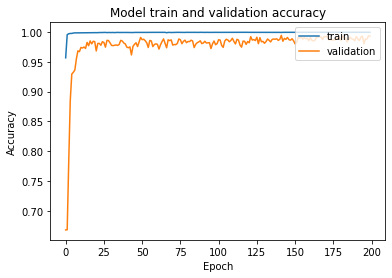

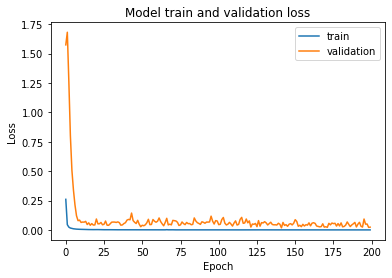


Training Accuracy Array:  [0.9568552374839783, 0.9957476854324341, 0.9972593188285828, 0.9977961182594299, 0.9978243708610535, 0.9984883666038513, 0.9987285733222961, 0.9987709522247314, 0.9987850785255432, 0.9986861348152161, 0.9988133311271667, 0.9987568259239197, 0.9990252256393433, 0.9989404678344727, 0.9992371201515198, 0.9990958571434021, 0.9992088675498962, 0.9993501305580139, 0.9991664886474609, 0.9991241097450256, 0.9990958571434021, 0.9991382360458374, 0.9993360042572021, 0.9992794990539551, 0.9993642568588257, 0.9994348883628845, 0.9995478987693787, 0.9992088675498962, 0.999406635761261, 0.9992936253547668, 0.9993218779563904, 0.9994207620620728, 0.9992371201515198, 0.9994490146636963, 0.9995478987693787, 0.999406635761261, 0.9994772672653198, 0.9994913935661316, 0.9994490146636963, 0.9994913935661316, 0.9994490146636963, 0.9993783831596375, 0.9994913935661316, 0.9994207620620728, 0.9993218779563904, 0.9995196461677551, 0.9995055198669434, 0.9995620250701904, 0.999576210975

In [ ]:
score = cnn_learning_high_SNR.evaluate(X_test, Y_test, verbose=0)
print('\nEvaluating on Test data : Score of SNR = ' + str(score[1]*100) +'\n')

summarize_model(history)
cnn_learning_high_SNR.save("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_highSNR.tf")

print("\nTraining Accuracy Array: ", history.history['accuracy'])
print("\nValidation Accuracy Array: ", history.history['val_accuracy'])

# Low SNR

In [ ]:
x_data_fft_low_SNR = x_data_fft_data[:,0:10]
y_labels_low_SNR = y_labels_data[:,0:10]

print(x_data_fft_low_SNR.shape)
print(y_labels_low_SNR.shape)

(15, 10, 715, 128, 2)
(15, 10, 715)


In [ ]:
x_dim = x_data_fft_low_SNR.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]
print(num_snapshots_per_tech)

7150


In [ ]:
y_labels_low_SNR = y_labels_low_SNR.flatten()
x_data_fft_low_SNR = np.reshape(x_data_fft_low_SNR, (total_num_snapshots, x_dim[3], x_dim[4]))

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler_std = StandardScaler()

fft_data_low_SNR_flat = scaler_std.fit_transform(np.reshape(x_data_fft_low_SNR, (total_num_snapshots, num_samples*2)))
fft_data_low_SNR_2d = np.reshape(fft_data_low_SNR_flat, (total_num_snapshots, num_samples, 2))

from keras.utils.np_utils import to_categorical
y_labels_one_hot_low_SNR = to_categorical(y_labels_low_SNR)

In [ ]:
from keras.callbacks import EarlyStopping
ES = EarlyStopping(monitor = 'val_accuracy', mode = 'max', min_delta = 0.00001, patience = 200, verbose = 1)

import logging
logging.disable(logging.WARNING)

In [ ]:
from sklearn.model_selection import train_test_split
fft_data_low_SNR_iq = fft_data_low_SNR_2d.reshape(-1, num_samples, 2, 1)

X_train, X_test_valid, Y_train, Y_test_valid = train_test_split(fft_data_low_SNR_iq, y_labels_one_hot_low_SNR, test_size=0.4)
X_validation, X_test, Y_validation, Y_test = train_test_split(X_test_valid, Y_test_valid, test_size=0.5)

Epoch 1/200
63/63 [==============================] - 28s 414ms/step - loss: 1.6278 - accuracy: 0.5290 - val_loss: 1.9688 - val_accuracy: 0.3230
Epoch 2/200
63/63 [==============================] - 23s 361ms/step - loss: 0.8803 - accuracy: 0.7355 - val_loss: 2.5111 - val_accuracy: 0.0796
Epoch 3/200
63/63 [==============================] - 23s 360ms/step - loss: 0.8171 - accuracy: 0.7466 - val_loss: 3.3463 - val_accuracy: 0.0988
Epoch 4/200
63/63 [==============================] - 23s 361ms/step - loss: 0.7850 - accuracy: 0.7499 - val_loss: 3.5075 - val_accuracy: 0.1102
Epoch 5/200
63/63 [==============================] - 23s 360ms/step - loss: 0.7638 - accuracy: 0.7557 - val_loss: 2.9507 - val_accuracy: 0.1453
Epoch 6/200
63/63 [==============================] - 23s 361ms/step - loss: 0.7495 - accuracy: 0.7565 - val_loss: 1.9026 - val_accuracy: 0.3692
Epoch 7/200
63/63 [==============================] - 23s 362ms/step - loss: 0.7369 - accuracy: 0.7627 - val_loss: 1.4175 - val_accuracy:

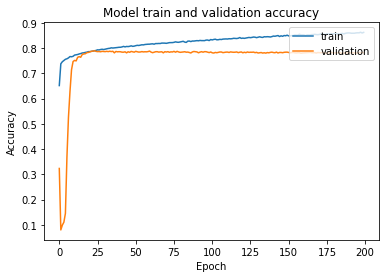

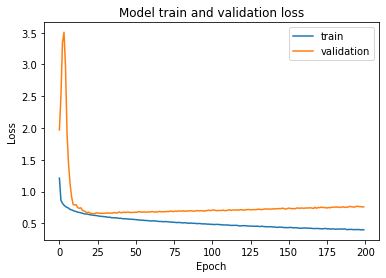


Training Accuracy Array:  [0.6512820720672607, 0.7375136017799377, 0.7457187175750732, 0.7505671977996826, 0.7553224563598633, 0.7573115825653076, 0.7608547210693359, 0.7661227583885193, 0.7653457522392273, 0.7670707106590271, 0.7719502449035645, 0.7730225324630737, 0.7742968201637268, 0.776456892490387, 0.7779953479766846, 0.7802796959877014, 0.7808857560157776, 0.7825485467910767, 0.7833877205848694, 0.7855788469314575, 0.7856099605560303, 0.7867443561553955, 0.7881274223327637, 0.789199709892273, 0.7903496623039246, 0.7927739024162292, 0.7922610640525818, 0.794032633304596, 0.7950582504272461, 0.7939238548278809, 0.795306921005249, 0.7967210412025452, 0.7981507182121277, 0.798834502696991, 0.800777018070221, 0.7998912334442139, 0.8004661798477173, 0.8006992936134338, 0.8019735813140869, 0.802859365940094, 0.8029370903968811, 0.8042424321174622, 0.8063403367996216, 0.804444432258606, 0.806138277053833, 0.805609941482544, 0.8066977262496948, 0.8086557984352112, 0.8065889477729797, 0.

In [ ]:
cnn_learning_low_SNR = cnn2_model()

epochs = 200
batch_size = 1024

history = cnn_learning_low_SNR.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])

score = cnn_learning_low_SNR.evaluate(X_test, Y_test, verbose=0)
print('\nEvaluating on Test data : Score of SNR  = ' + str(score[1]*100) +'\n')

summarize_model(history)
cnn_learning_low_SNR.save("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_lowSNR.tf")

print("\nTraining Accuracy Array: ", history.history['accuracy'])
print("\nValidation Accuracy Array: ", history.history['val_accuracy'])

# Training each SNR separately and transfer learning 

In [ ]:
x_dim = x_data_fft_data.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]
print(num_snapshots_per_tech)

15015


In [ ]:
from sklearn.model_selection import train_test_split
from keras import models
from keras.utils.np_utils import to_categorical
import math

X_train_curr = np.zeros((math.floor(0.6*total_num_snapshots/21), num_samples, 2))
X_validation_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_samples, 2))
X_test_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_samples, 2))
Y_train_curr = np.zeros((math.floor(0.6*total_num_snapshots/21), num_tech))
Y_validation_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_tech))
Y_test_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_tech))

X_test_valid_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_samples, 2))
Y_test_valid_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_tech))

In [ ]:
print('X_train_curr.shape = ' + str(X_train_curr.shape))
print('X_validation_curr.shape = ' + str(X_validation_curr.shape))
print('X_test_curr.shape = ' + str(X_test_curr.shape))
print('Y_train_curr.shape = ' + str(Y_train_curr.shape))
print('Y_validation_curr.shape = ' + str(Y_validation_curr.shape))
print('Y_test_curr.shape = ' + str(Y_test_curr.shape))

X_train_curr.shape = (6435, 128, 2)
X_validation_curr.shape = (2145, 128, 2)
X_test_curr.shape = (2145, 128, 2)
Y_train_curr.shape = (6435, 15)
Y_validation_curr.shape = (2145, 15)
Y_test_curr.shape = (2145, 15)


In [ ]:
from matplotlib import pyplot

def summarize_model(history, i):

  pyplot.plot(history.history['accuracy'])
  pyplot.plot(history.history['val_accuracy']) 
  pyplot.title('Model train and validation accuracy - SNR ' + str(2*i-20))
  pyplot.ylabel('Accuracy')
  pyplot.xlabel('Epoch')
  pyplot.legend(['train', 'validation'], loc='upper right')
  pyplot.show()

  pyplot.plot(history.history['loss'])
  pyplot.plot(history.history['val_loss'])  
  pyplot.title('Model train and validation loss - SNR ' + str(2*i-20))
  pyplot.ylabel('Loss')
  pyplot.xlabel('Epoch')
  pyplot.legend(['train', 'validation'], loc='upper right')
  pyplot.show()

In [ ]:
from keras.callbacks import EarlyStopping
ES = EarlyStopping(monitor = 'val_accuracy', mode = 'max', min_delta = 0.0001, patience = 30, verbose = 1)

import logging
logging.disable(logging.WARNING)

from sklearn.preprocessing import StandardScaler
from keras.utils.np_utils import to_categorical
scaler_std = StandardScaler()

In [ ]:
def Testing(X_test_curr, Y_test_curr, i):
  
  all_snr_model = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_allSNR.tf"))

  score = all_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nScore of SNR on All SNR model without Transfer Learning ' + str(2*i-20) + ' = ' + str(score[1]*100))

  high_snr_model = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_highSNR.tf"))

  score = high_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('Score of SNR on High SNR model without Transfer Learning ' + str(2*i-20) + ' = ' + str(score[1]*100))

  low_snr_model = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_lowSNR.tf"))

  score = low_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('Score of SNR on low SNR model without Transfer Learning ' + str(2*i-20) + ' = ' + str(score[1]*100))

In [ ]:
def train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i):
  
  print("\nTraining SNR = "+str(2*i-20)+" Data\n")

  lstm_model_cur = cnn2_model()
  history = lstm_model_cur.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024)

  score = lstm_model_cur.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')

  summarize_model(history, i)
  lstm_model_cur.save("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_SNR_"+str(2*i-20)+".tf")
  del history, lstm_model_cur

In [ ]:
def train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i):
  
  print("\nTraining SNR = "+str(2*i-20)+" Data on a pre-trained All SNR model\n")

  lstm_model_cur = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_allSNR.tf"))
  lstm_model_cur.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  history = lstm_model_cur.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024, callbacks=[ES])

  score = lstm_model_cur.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')

  summarize_model(history, i)
  lstm_model_cur.save("/gdrive/My Drive/Signal Identification Model CNN/Transfer Learning/cnnFFTdata_allSNR_to_SNR_"+str(2*i-20)+".tf")
  del history, lstm_model_cur

In [ ]:
def train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i):
  
  print("\nTraining SNR = "+str(2*i-20)+" Data on a pre-trained High SNR model\n")

  lstm_model_cur = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_highSNR.tf"))
  lstm_model_cur.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  history = lstm_model_cur.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024, callbacks=[ES])

  score = lstm_model_cur.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')

  summarize_model(history, i)
  lstm_model_cur.save("/gdrive/My Drive/Signal Identification Model CNN/Transfer Learning/cnnFFTdata_highSNR_to_SNR_"+str(2*i-20)+".tf")
  del history, lstm_model_cur

In [ ]:
def train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i):
  
  print("\nTraining SNR = "+str(2*i-20)+" Data on a pre-trained Low SNR model\n")

  lstm_model_cur = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_lowSNR.tf"))
  lstm_model_cur.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  history = lstm_model_cur.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024, callbacks=[ES])

  score = lstm_model_cur.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')

  summarize_model(history, i)
  lstm_model_cur.save("/gdrive/My Drive/Signal Identification Model CNN/Transfer Learning/cnnFFTdata_lowSNR_to_SNR_"+str(2*i-20)+".tf")
  del history, lstm_model_cur


Score of SNR on All SNR model without Transfer Learning -20 = 14.125874638557434
Score of SNR on High SNR model without Transfer Learning -20 = 6.806527078151703
Score of SNR on low SNR model without Transfer Learning -20 = 37.57575750350952

Training SNR = -20 Data

Epoch 1/200
7/7 [==============================] - 3s 229ms/step - loss: 3.0538 - accuracy: 0.0713 - val_loss: 2.6852 - val_accuracy: 0.1124
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 2.7845 - accuracy: 0.1193 - val_loss: 2.6440 - val_accuracy: 0.1823
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 2.6088 - accuracy: 0.1606 - val_loss: 2.6016 - val_accuracy: 0.2145
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 2.4469 - accuracy: 0.2198 - val_loss: 2.5699 - val_accuracy: 0.2270
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 2.3291 - accuracy: 0.2590 - val_loss: 2.5675 - val_accuracy: 0.2075
Epoch 6/200
7/7 [=========

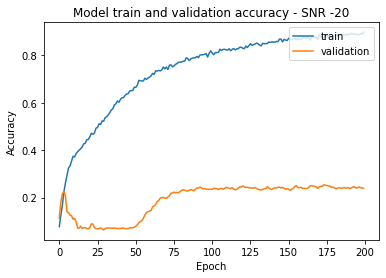

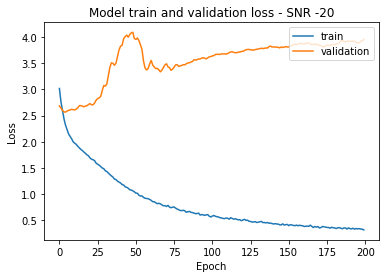


Training SNR = -20 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 240ms/step - loss: 3.8692 - accuracy: 0.3751 - val_loss: 4.1267 - val_accuracy: 0.1795
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 3.3625 - accuracy: 0.3948 - val_loss: 3.9721 - val_accuracy: 0.1832
Epoch 3/200
7/7 [==============================] - 1s 158ms/step - loss: 3.0355 - accuracy: 0.4069 - val_loss: 3.9177 - val_accuracy: 0.1874
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 2.9300 - accuracy: 0.4094 - val_loss: 3.8246 - val_accuracy: 0.1953
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 2.7212 - accuracy: 0.4227 - val_loss: 3.6419 - val_accuracy: 0.2112
Epoch 6/200
7/7 [==============================] - 1s 150ms/step - loss: 2.6216 - accuracy: 0.4324 - val_loss: 3.3967 - val_accuracy: 0.2247
Epoch 7/200
7/7 [==============================] - 1s 148ms/step - loss: 2.4310 - accuracy: 0.430

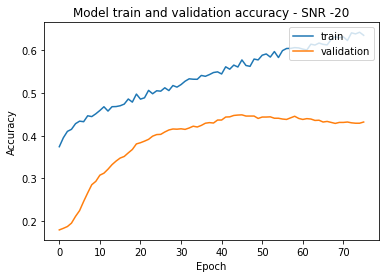

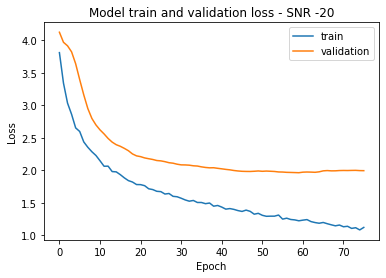


Training SNR = -20 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 226ms/step - loss: 12.3270 - accuracy: 0.1928 - val_loss: 10.9159 - val_accuracy: 0.0839
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 10.9709 - accuracy: 0.2130 - val_loss: 9.7833 - val_accuracy: 0.0886
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 10.4536 - accuracy: 0.2146 - val_loss: 8.8688 - val_accuracy: 0.1077
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 9.8766 - accuracy: 0.2271 - val_loss: 8.2652 - val_accuracy: 0.1245
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 9.0730 - accuracy: 0.2374 - val_loss: 7.8484 - val_accuracy: 0.1338
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 8.6050 - accuracy: 0.2395 - val_loss: 7.5829 - val_accuracy: 0.1385
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - loss: 7.9116 - accuracy: 

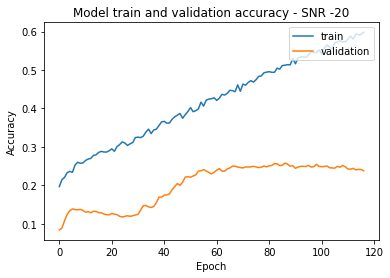

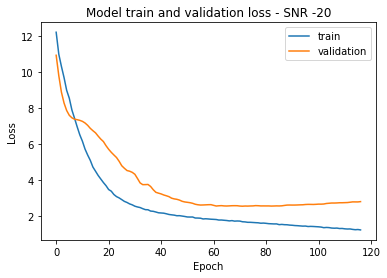


Training SNR = -20 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 240ms/step - loss: 3.0987 - accuracy: 0.4182 - val_loss: 2.4738 - val_accuracy: 0.3893
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 2.8543 - accuracy: 0.4289 - val_loss: 2.3281 - val_accuracy: 0.4051
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 2.4635 - accuracy: 0.4420 - val_loss: 2.1455 - val_accuracy: 0.4266
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 2.3155 - accuracy: 0.4640 - val_loss: 1.9610 - val_accuracy: 0.4592
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 2.1971 - accuracy: 0.4708 - val_loss: 1.8254 - val_accuracy: 0.4867
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 2.1138 - accuracy: 0.4783 - val_loss: 1.7310 - val_accuracy: 0.5063
Epoch 7/200
7/7 [==============================] - 1s 149ms/step - loss: 2.0069 - accuracy: 0.490

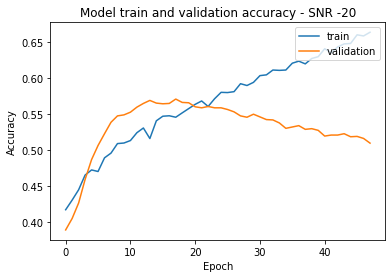

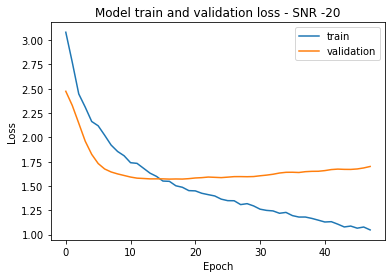


Score of SNR on All SNR model without Transfer Learning -18 = 25.874125957489014
Score of SNR on High SNR model without Transfer Learning -18 = 8.205128461122513
Score of SNR on low SNR model without Transfer Learning -18 = 57.296037673950195

Training SNR = -18 Data

Epoch 1/200
7/7 [==============================] - 3s 230ms/step - loss: 3.0444 - accuracy: 0.0729 - val_loss: 2.6287 - val_accuracy: 0.1902
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 2.6004 - accuracy: 0.1758 - val_loss: 2.4751 - val_accuracy: 0.3674
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 2.2594 - accuracy: 0.2955 - val_loss: 2.3799 - val_accuracy: 0.4112
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 2.0457 - accuracy: 0.3718 - val_loss: 2.3553 - val_accuracy: 0.3716
Epoch 5/200
7/7 [==============================] - 1s 147ms/step - loss: 1.8770 - accuracy: 0.4234 - val_loss: 2.3972 - val_accuracy: 0.2312
Epoch 6/200
7/7 [========

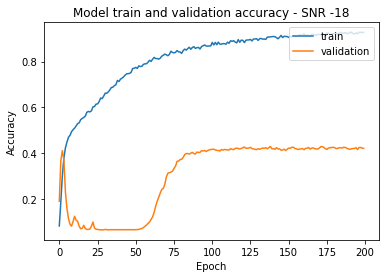

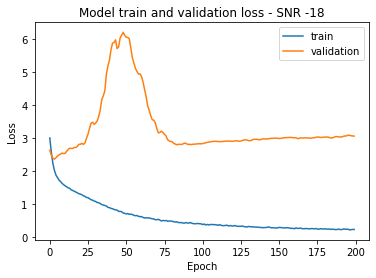


Training SNR = -18 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 239ms/step - loss: 2.8069 - accuracy: 0.4965 - val_loss: 2.9720 - val_accuracy: 0.2713
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 2.4463 - accuracy: 0.5145 - val_loss: 2.7884 - val_accuracy: 0.3016
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 2.2999 - accuracy: 0.5271 - val_loss: 2.6632 - val_accuracy: 0.3240
Epoch 4/200
7/7 [==============================] - 1s 158ms/step - loss: 2.0675 - accuracy: 0.5469 - val_loss: 2.5560 - val_accuracy: 0.3506
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 1.9684 - accuracy: 0.5453 - val_loss: 2.4418 - val_accuracy: 0.3753
Epoch 6/200
7/7 [==============================] - 1s 148ms/step - loss: 1.8904 - accuracy: 0.5442 - val_loss: 2.3055 - val_accuracy: 0.3935
Epoch 7/200
7/7 [==============================] - 1s 150ms/step - loss: 1.8034 - accuracy: 0.552

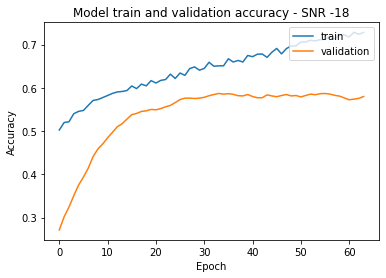

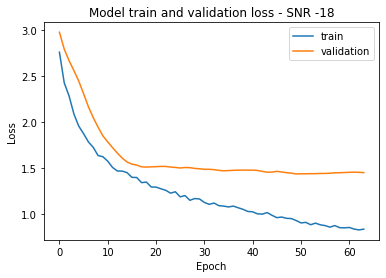


Training SNR = -18 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 4s 241ms/step - loss: 9.8138 - accuracy: 0.2972 - val_loss: 9.0604 - val_accuracy: 0.1035
Epoch 2/200
7/7 [==============================] - 1s 146ms/step - loss: 8.7715 - accuracy: 0.3154 - val_loss: 7.5536 - val_accuracy: 0.1492
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 8.1180 - accuracy: 0.3411 - val_loss: 6.6127 - val_accuracy: 0.1879
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 7.4166 - accuracy: 0.3566 - val_loss: 6.1129 - val_accuracy: 0.2051
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 7.0585 - accuracy: 0.3685 - val_loss: 5.8143 - val_accuracy: 0.2168
Epoch 6/200
7/7 [==============================] - 1s 158ms/step - loss: 6.5216 - accuracy: 0.3834 - val_loss: 5.6702 - val_accuracy: 0.2247
Epoch 7/200
7/7 [==============================] - 1s 152ms/step - loss: 6.0687 - accuracy: 0.38

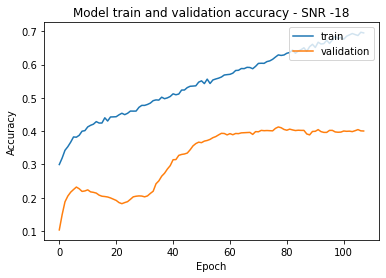

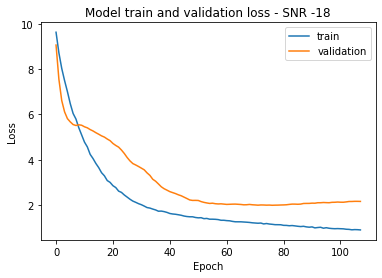


Training SNR = -18 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 237ms/step - loss: 2.0012 - accuracy: 0.5699 - val_loss: 1.5200 - val_accuracy: 0.5641
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 1.7881 - accuracy: 0.5819 - val_loss: 1.4464 - val_accuracy: 0.5795
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 1.6748 - accuracy: 0.5855 - val_loss: 1.3473 - val_accuracy: 0.6084
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 1.6130 - accuracy: 0.5894 - val_loss: 1.2501 - val_accuracy: 0.6410
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 1.5359 - accuracy: 0.6023 - val_loss: 1.1800 - val_accuracy: 0.6667
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 1.4528 - accuracy: 0.6103 - val_loss: 1.1302 - val_accuracy: 0.6779
Epoch 7/200
7/7 [==============================] - 1s 149ms/step - loss: 1.4159 - accuracy: 0.610

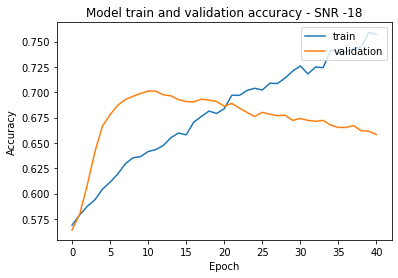

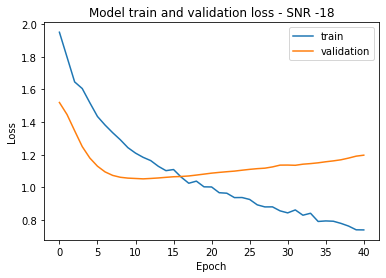


Score of SNR on All SNR model without Transfer Learning -16 = 42.89044141769409
Score of SNR on High SNR model without Transfer Learning -16 = 10.90909093618393
Score of SNR on low SNR model without Transfer Learning -16 = 78.04195880889893

Training SNR = -16 Data

Epoch 1/200
7/7 [==============================] - 3s 231ms/step - loss: 2.9295 - accuracy: 0.0910 - val_loss: 2.4386 - val_accuracy: 0.3991
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 2.1107 - accuracy: 0.3486 - val_loss: 1.9506 - val_accuracy: 0.6005
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 1.6188 - accuracy: 0.5351 - val_loss: 1.7554 - val_accuracy: 0.6154
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 1.4354 - accuracy: 0.5807 - val_loss: 1.8137 - val_accuracy: 0.5953
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 1.3371 - accuracy: 0.6045 - val_loss: 1.9611 - val_accuracy: 0.4508
Epoch 6/200
7/7 [==========

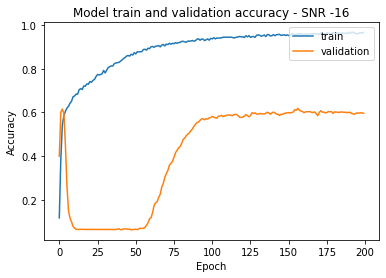

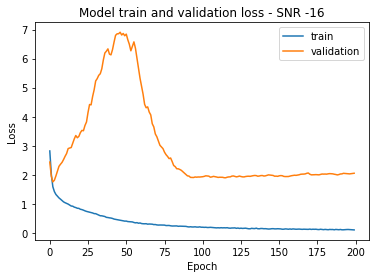


Training SNR = -16 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 245ms/step - loss: 1.6892 - accuracy: 0.6440 - val_loss: 1.6405 - val_accuracy: 0.5091
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 1.4989 - accuracy: 0.6620 - val_loss: 1.5338 - val_accuracy: 0.5408
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 1.3327 - accuracy: 0.6836 - val_loss: 1.4970 - val_accuracy: 0.5646
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 1.2688 - accuracy: 0.6917 - val_loss: 1.4515 - val_accuracy: 0.5790
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 1.2167 - accuracy: 0.6933 - val_loss: 1.4106 - val_accuracy: 0.5930
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 1.1251 - accuracy: 0.7058 - val_loss: 1.3592 - val_accuracy: 0.6033
Epoch 7/200
7/7 [==============================] - 1s 150ms/step - loss: 1.0608 - accuracy: 0.712

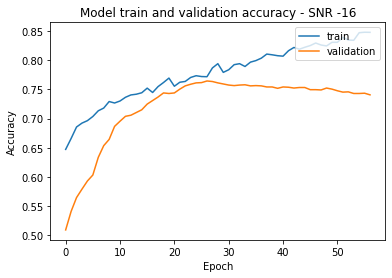

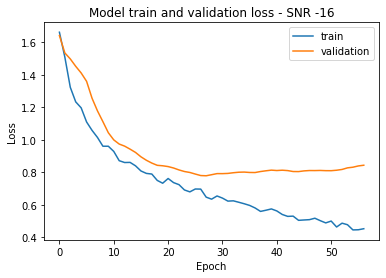


Training SNR = -16 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 241ms/step - loss: 6.9823 - accuracy: 0.4263 - val_loss: 6.3539 - val_accuracy: 0.2019
Epoch 2/200
7/7 [==============================] - 1s 146ms/step - loss: 6.0579 - accuracy: 0.4775 - val_loss: 4.7997 - val_accuracy: 0.2979
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 5.5945 - accuracy: 0.5049 - val_loss: 4.1366 - val_accuracy: 0.3510
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 4.9951 - accuracy: 0.5329 - val_loss: 3.8796 - val_accuracy: 0.3888
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 4.7247 - accuracy: 0.5386 - val_loss: 3.8215 - val_accuracy: 0.3967
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 4.3555 - accuracy: 0.5557 - val_loss: 3.8796 - val_accuracy: 0.3972
Epoch 7/200
7/7 [==============================] - 1s 150ms/step - loss: 4.1368 - accuracy: 0.55

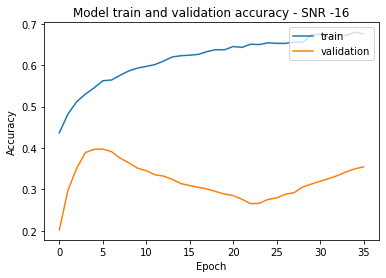

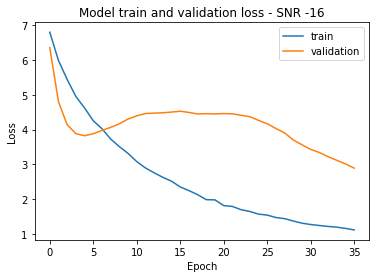


Training SNR = -16 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 238ms/step - loss: 1.0914 - accuracy: 0.7127 - val_loss: 0.7562 - val_accuracy: 0.7594
Epoch 2/200
7/7 [==============================] - 1s 153ms/step - loss: 1.0192 - accuracy: 0.7265 - val_loss: 0.8156 - val_accuracy: 0.7427
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.9357 - accuracy: 0.7395 - val_loss: 0.8316 - val_accuracy: 0.7408
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.9343 - accuracy: 0.7157 - val_loss: 0.7874 - val_accuracy: 0.7548
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.8827 - accuracy: 0.7414 - val_loss: 0.7312 - val_accuracy: 0.7720
Epoch 6/200
7/7 [==============================] - 1s 151ms/step - loss: 0.8526 - accuracy: 0.7353 - val_loss: 0.6935 - val_accuracy: 0.7800
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 0.7930 - accuracy: 0.756

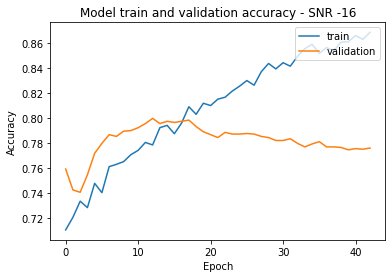

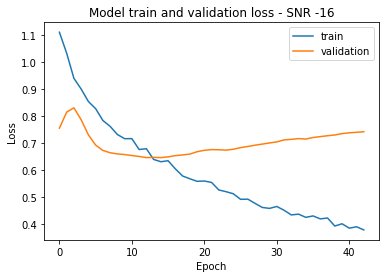


Score of SNR on All SNR model without Transfer Learning -14 = 69.74359154701233
Score of SNR on High SNR model without Transfer Learning -14 = 16.363635659217834
Score of SNR on low SNR model without Transfer Learning -14 = 87.55244612693787

Training SNR = -14 Data

Epoch 1/200
7/7 [==============================] - 3s 246ms/step - loss: 2.8307 - accuracy: 0.1229 - val_loss: 2.2129 - val_accuracy: 0.6037
Epoch 2/200
7/7 [==============================] - 1s 153ms/step - loss: 1.6489 - accuracy: 0.5305 - val_loss: 1.4066 - val_accuracy: 0.6984
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 1.2116 - accuracy: 0.6635 - val_loss: 1.2087 - val_accuracy: 0.7110
Epoch 4/200
7/7 [==============================] - 1s 159ms/step - loss: 1.0706 - accuracy: 0.6895 - val_loss: 1.3196 - val_accuracy: 0.7058
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.9945 - accuracy: 0.7084 - val_loss: 1.5474 - val_accuracy: 0.5772
Epoch 6/200
7/7 [=========

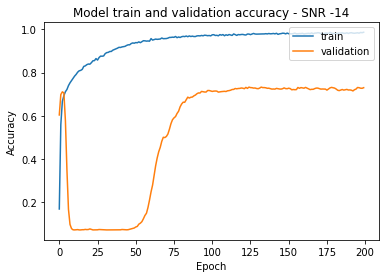

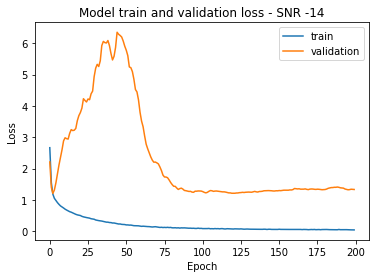


Training SNR = -14 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 237ms/step - loss: 1.0257 - accuracy: 0.7648 - val_loss: 0.8164 - val_accuracy: 0.7119
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.8824 - accuracy: 0.7830 - val_loss: 0.7985 - val_accuracy: 0.7301
Epoch 3/200
7/7 [==============================] - 1s 160ms/step - loss: 0.8113 - accuracy: 0.7827 - val_loss: 0.7655 - val_accuracy: 0.7506
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.7267 - accuracy: 0.8002 - val_loss: 0.7282 - val_accuracy: 0.7688
Epoch 5/200
7/7 [==============================] - 1s 164ms/step - loss: 0.6332 - accuracy: 0.8091 - val_loss: 0.6925 - val_accuracy: 0.7804
Epoch 6/200
7/7 [==============================] - 1s 156ms/step - loss: 0.6260 - accuracy: 0.8069 - val_loss: 0.6520 - val_accuracy: 0.7949
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - loss: 0.5628 - accuracy: 0.821

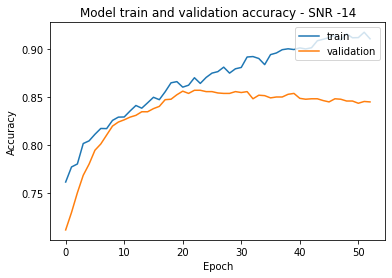

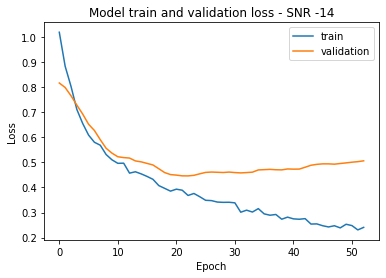


Training SNR = -14 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 4s 245ms/step - loss: 4.6320 - accuracy: 0.5769 - val_loss: 4.4104 - val_accuracy: 0.3441
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 3.9765 - accuracy: 0.6204 - val_loss: 3.1971 - val_accuracy: 0.4653
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 3.4457 - accuracy: 0.6511 - val_loss: 2.7186 - val_accuracy: 0.5469
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 3.1620 - accuracy: 0.6711 - val_loss: 2.5927 - val_accuracy: 0.5730
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 2.7764 - accuracy: 0.6858 - val_loss: 2.5608 - val_accuracy: 0.5883
Epoch 6/200
7/7 [==============================] - 1s 150ms/step - loss: 2.6639 - accuracy: 0.6980 - val_loss: 2.5438 - val_accuracy: 0.5930
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 2.5403 - accuracy: 0.70

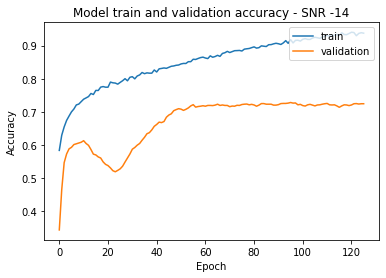

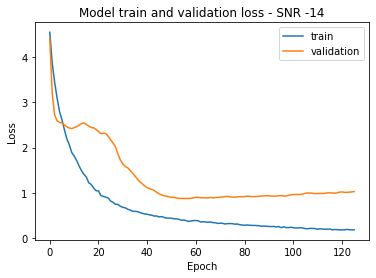


Training SNR = -14 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 231ms/step - loss: 0.7010 - accuracy: 0.7899 - val_loss: 0.4138 - val_accuracy: 0.8606
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 0.6059 - accuracy: 0.8050 - val_loss: 0.4450 - val_accuracy: 0.8480
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.5409 - accuracy: 0.8150 - val_loss: 0.4653 - val_accuracy: 0.8410
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.5194 - accuracy: 0.8252 - val_loss: 0.4630 - val_accuracy: 0.8438
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.4815 - accuracy: 0.8304 - val_loss: 0.4597 - val_accuracy: 0.8480
Epoch 6/200
7/7 [==============================] - 1s 162ms/step - loss: 0.4703 - accuracy: 0.8399 - val_loss: 0.4644 - val_accuracy: 0.8462
Epoch 7/200
7/7 [==============================] - 1s 154ms/step - loss: 0.4346 - accuracy: 0.840

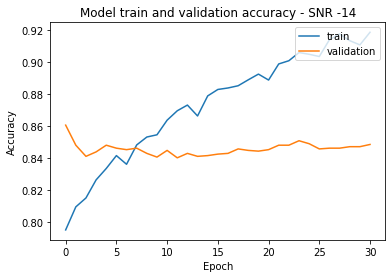

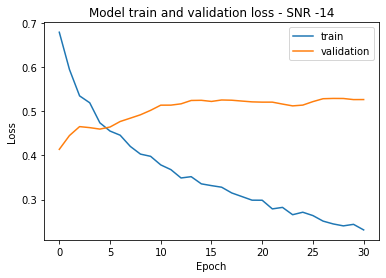


Score of SNR on All SNR model without Transfer Learning -12 = 88.67132663726807
Score of SNR on High SNR model without Transfer Learning -12 = 36.68997585773468
Score of SNR on low SNR model without Transfer Learning -12 = 91.65500998497009

Training SNR = -12 Data

Epoch 1/200
7/7 [==============================] - 3s 236ms/step - loss: 2.6172 - accuracy: 0.1886 - val_loss: 1.6637 - val_accuracy: 0.7207
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 1.1499 - accuracy: 0.6888 - val_loss: 0.9321 - val_accuracy: 0.7510
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.9050 - accuracy: 0.7367 - val_loss: 0.8550 - val_accuracy: 0.7552
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.7903 - accuracy: 0.7696 - val_loss: 1.0012 - val_accuracy: 0.7669
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.7321 - accuracy: 0.7746 - val_loss: 1.2830 - val_accuracy: 0.7026
Epoch 6/200
7/7 [==========

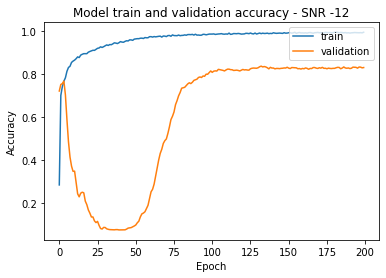

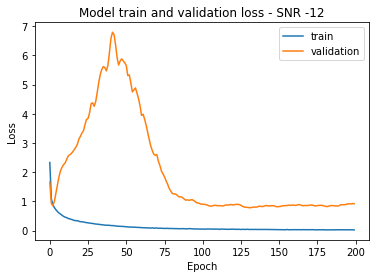


Training SNR = -12 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 230ms/step - loss: 0.6920 - accuracy: 0.8228 - val_loss: 0.3983 - val_accuracy: 0.8573
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.5689 - accuracy: 0.8358 - val_loss: 0.4091 - val_accuracy: 0.8536
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.4721 - accuracy: 0.8608 - val_loss: 0.3992 - val_accuracy: 0.8527
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.4375 - accuracy: 0.8603 - val_loss: 0.3941 - val_accuracy: 0.8536
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.3849 - accuracy: 0.8703 - val_loss: 0.3865 - val_accuracy: 0.8611
Epoch 6/200
7/7 [==============================] - 1s 163ms/step - loss: 0.3462 - accuracy: 0.8813 - val_loss: 0.3776 - val_accuracy: 0.8699
Epoch 7/200
7/7 [==============================] - 1s 150ms/step - loss: 0.3481 - accuracy: 0.880

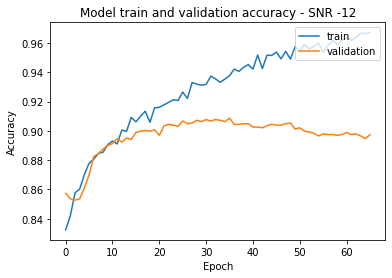

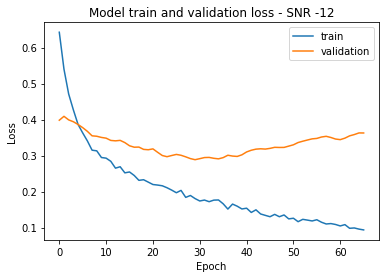


Training SNR = -12 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 242ms/step - loss: 2.9156 - accuracy: 0.7041 - val_loss: 2.1844 - val_accuracy: 0.5786
Epoch 2/200
7/7 [==============================] - 1s 153ms/step - loss: 2.3566 - accuracy: 0.7454 - val_loss: 1.5921 - val_accuracy: 0.7026
Epoch 3/200
7/7 [==============================] - 1s 158ms/step - loss: 2.0404 - accuracy: 0.7675 - val_loss: 1.4313 - val_accuracy: 0.7408
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 1.8072 - accuracy: 0.7816 - val_loss: 1.4157 - val_accuracy: 0.7576
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 1.5433 - accuracy: 0.7957 - val_loss: 1.4254 - val_accuracy: 0.7636
Epoch 6/200
7/7 [==============================] - 1s 151ms/step - loss: 1.4474 - accuracy: 0.8010 - val_loss: 1.4749 - val_accuracy: 0.7655
Epoch 7/200
7/7 [==============================] - 1s 148ms/step - loss: 1.3415 - accuracy: 0.80

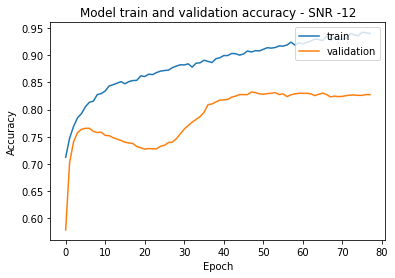

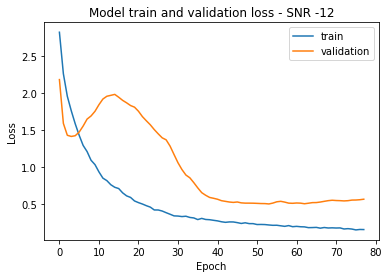


Training SNR = -12 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 233ms/step - loss: 0.4846 - accuracy: 0.8330 - val_loss: 0.2547 - val_accuracy: 0.9058
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.3874 - accuracy: 0.8620 - val_loss: 0.2764 - val_accuracy: 0.9026
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.3454 - accuracy: 0.8761 - val_loss: 0.3079 - val_accuracy: 0.8988
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.3118 - accuracy: 0.8836 - val_loss: 0.3276 - val_accuracy: 0.8932
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.2967 - accuracy: 0.8858 - val_loss: 0.3422 - val_accuracy: 0.8904
Epoch 6/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2709 - accuracy: 0.9004 - val_loss: 0.3545 - val_accuracy: 0.8881
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2605 - accuracy: 0.900

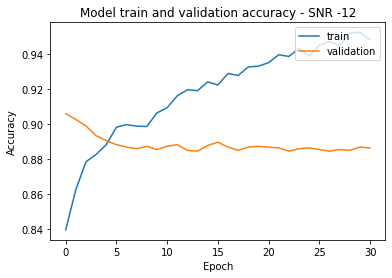

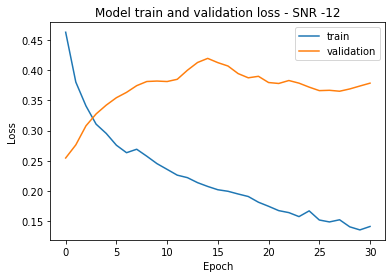

In [ ]:
#es

for i in range(0, 5):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_data_fft_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)


Score of SNR on All SNR model without Transfer Learning -10 = 92.12121367454529
Score of SNR on High SNR model without Transfer Learning -10 = 63.63636255264282
Score of SNR on low SNR model without Transfer Learning -10 = 89.32400941848755

Training SNR = -10 Data

Epoch 1/200
7/7 [==============================] - 4s 235ms/step - loss: 2.3712 - accuracy: 0.2841 - val_loss: 1.0978 - val_accuracy: 0.7590
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.8597 - accuracy: 0.7530 - val_loss: 0.6620 - val_accuracy: 0.7818
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 0.7130 - accuracy: 0.7810 - val_loss: 0.6484 - val_accuracy: 0.8000
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.6389 - accuracy: 0.8137 - val_loss: 0.7822 - val_accuracy: 0.8019
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.5639 - accuracy: 0.8496 - val_loss: 1.0531 - val_accuracy: 0.7380
Epoch 6/200
7/7 [==========

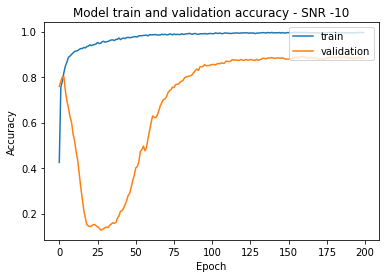

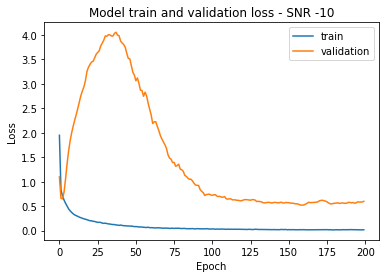


Training SNR = -10 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 247ms/step - loss: 0.4587 - accuracy: 0.8613 - val_loss: 0.2544 - val_accuracy: 0.9063
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.3375 - accuracy: 0.8870 - val_loss: 0.2639 - val_accuracy: 0.9054
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.2907 - accuracy: 0.8998 - val_loss: 0.2473 - val_accuracy: 0.9128
Epoch 4/200
7/7 [==============================] - 1s 161ms/step - loss: 0.2898 - accuracy: 0.8944 - val_loss: 0.2474 - val_accuracy: 0.9133
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.2560 - accuracy: 0.9061 - val_loss: 0.2522 - val_accuracy: 0.9124
Epoch 6/200
7/7 [==============================] - 1s 153ms/step - loss: 0.2396 - accuracy: 0.9105 - val_loss: 0.2536 - val_accuracy: 0.9147
Epoch 7/200
7/7 [==============================] - 1s 162ms/step - loss: 0.2281 - accuracy: 0.912

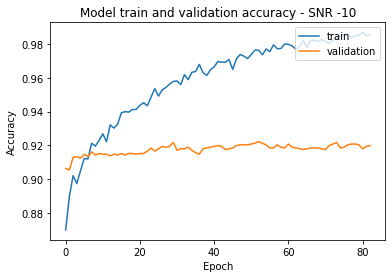

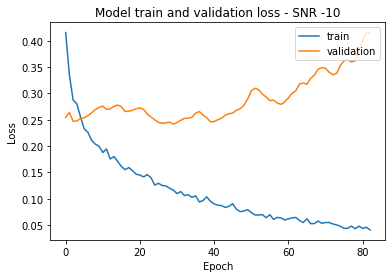


Training SNR = -10 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 227ms/step - loss: 1.6001 - accuracy: 0.8129 - val_loss: 1.0029 - val_accuracy: 0.7897
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 1.2898 - accuracy: 0.8342 - val_loss: 0.8573 - val_accuracy: 0.8359
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 1.1191 - accuracy: 0.8455 - val_loss: 0.8617 - val_accuracy: 0.8434
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.9146 - accuracy: 0.8594 - val_loss: 0.9101 - val_accuracy: 0.8387
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.7996 - accuracy: 0.8749 - val_loss: 0.9884 - val_accuracy: 0.8364
Epoch 6/200
7/7 [==============================] - 1s 151ms/step - loss: 0.7620 - accuracy: 0.8796 - val_loss: 1.0494 - val_accuracy: 0.8364
Epoch 7/200
7/7 [==============================] - 1s 169ms/step - loss: 0.6344 - accuracy: 0.89

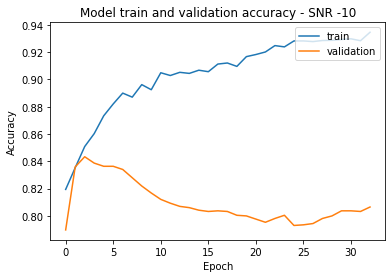

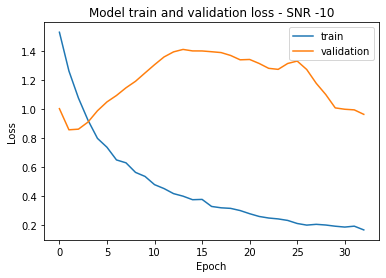


Training SNR = -10 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 248ms/step - loss: 0.3677 - accuracy: 0.8615 - val_loss: 0.2173 - val_accuracy: 0.9221
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.2723 - accuracy: 0.8981 - val_loss: 0.2507 - val_accuracy: 0.9217
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 0.2413 - accuracy: 0.9020 - val_loss: 0.3021 - val_accuracy: 0.9119
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.2216 - accuracy: 0.9128 - val_loss: 0.3556 - val_accuracy: 0.9082
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2121 - accuracy: 0.9173 - val_loss: 0.3987 - val_accuracy: 0.9044
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 0.1967 - accuracy: 0.9222 - val_loss: 0.4388 - val_accuracy: 0.9007
Epoch 7/200
7/7 [==============================] - 1s 160ms/step - loss: 0.1972 - accuracy: 0.924

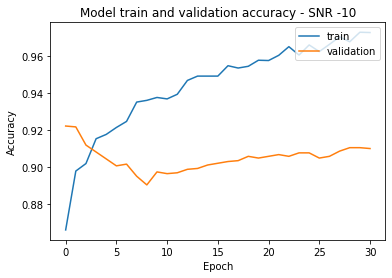

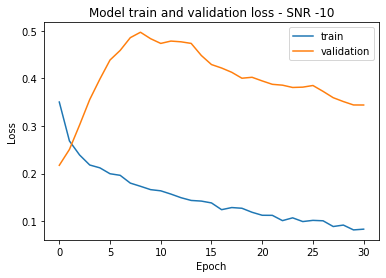


Score of SNR on All SNR model without Transfer Learning -8 = 94.77855563163757
Score of SNR on High SNR model without Transfer Learning -8 = 85.22144556045532
Score of SNR on low SNR model without Transfer Learning -8 = 90.06993174552917

Training SNR = -8 Data

Epoch 1/200
7/7 [==============================] - 3s 232ms/step - loss: 2.2570 - accuracy: 0.3254 - val_loss: 0.8432 - val_accuracy: 0.7818
Epoch 2/200
7/7 [==============================] - 1s 155ms/step - loss: 0.7473 - accuracy: 0.7781 - val_loss: 0.6108 - val_accuracy: 0.7800
Epoch 3/200
7/7 [==============================] - 1s 153ms/step - loss: 0.6026 - accuracy: 0.8306 - val_loss: 0.6704 - val_accuracy: 0.7832
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.5128 - accuracy: 0.8790 - val_loss: 0.8683 - val_accuracy: 0.7627
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.4338 - accuracy: 0.9082 - val_loss: 1.1810 - val_accuracy: 0.6900
Epoch 6/200
7/7 [==============

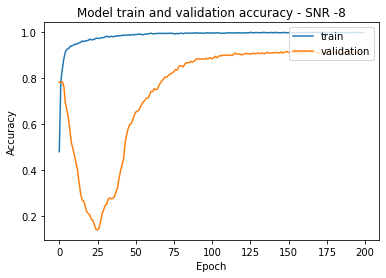

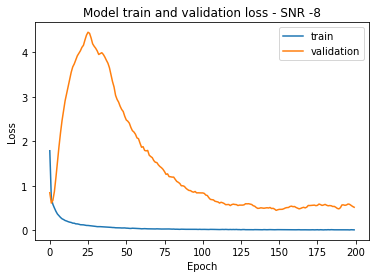


Training SNR = -8 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 226ms/step - loss: 0.2639 - accuracy: 0.9101 - val_loss: 0.1977 - val_accuracy: 0.9231
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2042 - accuracy: 0.9275 - val_loss: 0.2042 - val_accuracy: 0.9287
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1583 - accuracy: 0.9390 - val_loss: 0.2157 - val_accuracy: 0.9343
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.1582 - accuracy: 0.9409 - val_loss: 0.2247 - val_accuracy: 0.9352
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1458 - accuracy: 0.9454 - val_loss: 0.2184 - val_accuracy: 0.9352
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 0.1465 - accuracy: 0.9465 - val_loss: 0.2130 - val_accuracy: 0.9338
Epoch 7/200
7/7 [==============================] - 1s 162ms/step - loss: 0.1406 - accuracy: 0.9460

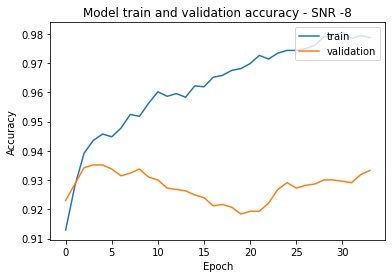

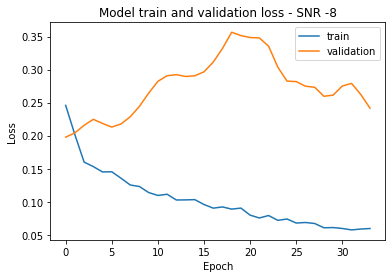


Training SNR = -8 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 241ms/step - loss: 0.7380 - accuracy: 0.8900 - val_loss: 0.5206 - val_accuracy: 0.8932
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 0.5553 - accuracy: 0.9060 - val_loss: 0.5421 - val_accuracy: 0.8918
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.4828 - accuracy: 0.9190 - val_loss: 0.6469 - val_accuracy: 0.8834
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.4026 - accuracy: 0.9322 - val_loss: 0.7742 - val_accuracy: 0.8695
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.3405 - accuracy: 0.9349 - val_loss: 0.9014 - val_accuracy: 0.8625
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 0.3084 - accuracy: 0.9431 - val_loss: 1.0276 - val_accuracy: 0.8513
Epoch 7/200
7/7 [==============================] - 1s 155ms/step - loss: 0.2917 - accuracy: 0.944

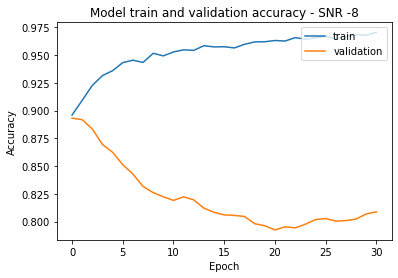

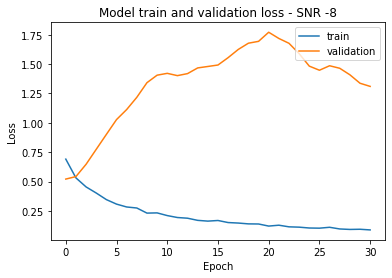


Training SNR = -8 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 238ms/step - loss: 0.2904 - accuracy: 0.8816 - val_loss: 0.2043 - val_accuracy: 0.9198
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2035 - accuracy: 0.9239 - val_loss: 0.2826 - val_accuracy: 0.9133
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1713 - accuracy: 0.9329 - val_loss: 0.4052 - val_accuracy: 0.9072
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1597 - accuracy: 0.9369 - val_loss: 0.5270 - val_accuracy: 0.9030
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1340 - accuracy: 0.9520 - val_loss: 0.6246 - val_accuracy: 0.8970
Epoch 6/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1310 - accuracy: 0.9533 - val_loss: 0.6852 - val_accuracy: 0.8951
Epoch 7/200
7/7 [==============================] - 1s 172ms/step - loss: 0.1285 - accuracy: 0.9517

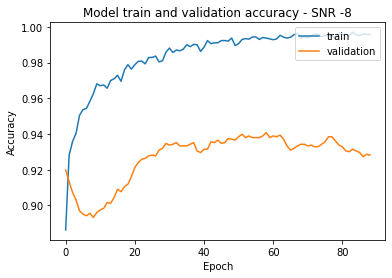

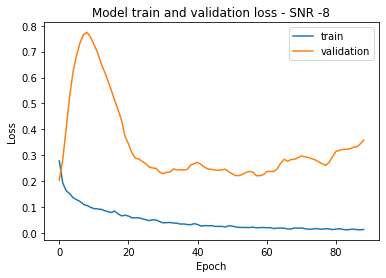


Score of SNR on All SNR model without Transfer Learning -6 = 95.71095705032349
Score of SNR on High SNR model without Transfer Learning -6 = 93.61305236816406
Score of SNR on low SNR model without Transfer Learning -6 = 91.56177043914795

Training SNR = -6 Data

Epoch 1/200
7/7 [==============================] - 3s 224ms/step - loss: 2.0588 - accuracy: 0.3753 - val_loss: 0.6521 - val_accuracy: 0.8126
Epoch 2/200
7/7 [==============================] - 1s 153ms/step - loss: 0.6488 - accuracy: 0.8043 - val_loss: 0.4879 - val_accuracy: 0.8331
Epoch 3/200
7/7 [==============================] - 1s 157ms/step - loss: 0.5119 - accuracy: 0.8860 - val_loss: 0.5651 - val_accuracy: 0.8373
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.4177 - accuracy: 0.9209 - val_loss: 0.7856 - val_accuracy: 0.7744
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.3260 - accuracy: 0.9400 - val_loss: 1.0936 - val_accuracy: 0.6946
Epoch 6/200
7/7 [==============

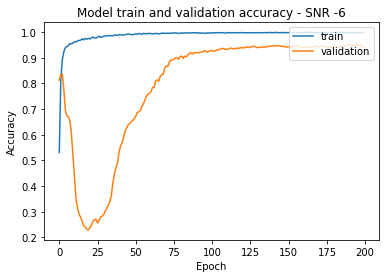

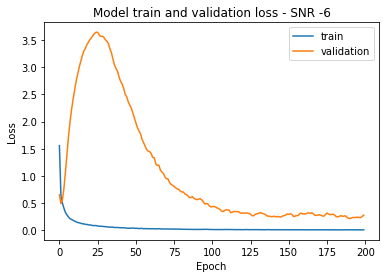


Training SNR = -6 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 240ms/step - loss: 0.1695 - accuracy: 0.9369 - val_loss: 0.1104 - val_accuracy: 0.9576
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1338 - accuracy: 0.9512 - val_loss: 0.1101 - val_accuracy: 0.9627
Epoch 3/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1101 - accuracy: 0.9557 - val_loss: 0.1234 - val_accuracy: 0.9641
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1074 - accuracy: 0.9592 - val_loss: 0.1488 - val_accuracy: 0.9604
Epoch 5/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0962 - accuracy: 0.9621 - val_loss: 0.1748 - val_accuracy: 0.9576
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0954 - accuracy: 0.9640 - val_loss: 0.1874 - val_accuracy: 0.9557
Epoch 7/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0860 - accuracy: 0.9683

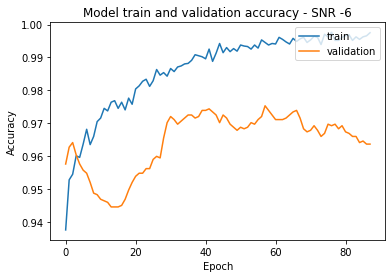

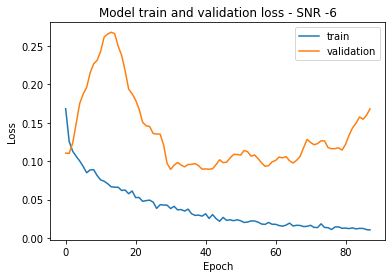


Training SNR = -6 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 239ms/step - loss: 0.3349 - accuracy: 0.9372 - val_loss: 0.2394 - val_accuracy: 0.9529
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.2499 - accuracy: 0.9542 - val_loss: 0.2173 - val_accuracy: 0.9566
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2238 - accuracy: 0.9555 - val_loss: 0.2284 - val_accuracy: 0.9524
Epoch 4/200
7/7 [==============================] - 1s 161ms/step - loss: 0.1652 - accuracy: 0.9627 - val_loss: 0.2654 - val_accuracy: 0.9464
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1546 - accuracy: 0.9666 - val_loss: 0.3355 - val_accuracy: 0.9357
Epoch 6/200
7/7 [==============================] - 1s 155ms/step - loss: 0.1439 - accuracy: 0.9699 - val_loss: 0.3943 - val_accuracy: 0.9263
Epoch 7/200
7/7 [==============================] - 1s 160ms/step - loss: 0.1202 - accuracy: 0.971

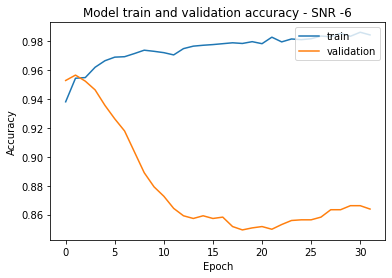

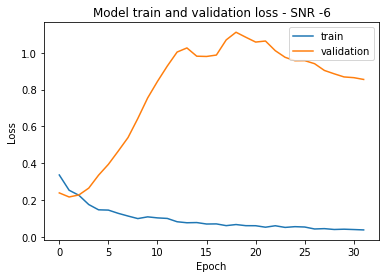


Training SNR = -6 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 238ms/step - loss: 0.2501 - accuracy: 0.9020 - val_loss: 0.1621 - val_accuracy: 0.9417
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 0.1634 - accuracy: 0.9392 - val_loss: 0.2364 - val_accuracy: 0.9352
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.1367 - accuracy: 0.9473 - val_loss: 0.3543 - val_accuracy: 0.9315
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1179 - accuracy: 0.9573 - val_loss: 0.4644 - val_accuracy: 0.9268
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1093 - accuracy: 0.9572 - val_loss: 0.5549 - val_accuracy: 0.9221
Epoch 6/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0950 - accuracy: 0.9637 - val_loss: 0.6262 - val_accuracy: 0.9189
Epoch 7/200
7/7 [==============================] - 1s 176ms/step - loss: 0.0917 - accuracy: 0.9680

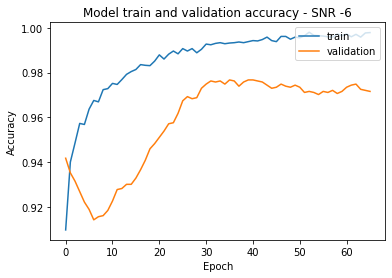

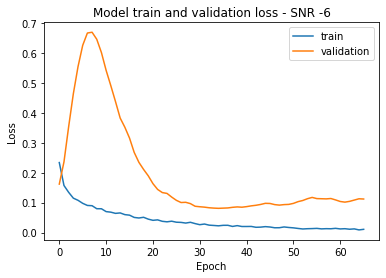


Score of SNR on All SNR model without Transfer Learning -4 = 95.99067568778992
Score of SNR on High SNR model without Transfer Learning -4 = 97.43589758872986
Score of SNR on low SNR model without Transfer Learning -4 = 91.65500998497009

Training SNR = -4 Data

Epoch 1/200
7/7 [==============================] - 3s 233ms/step - loss: 1.8816 - accuracy: 0.4453 - val_loss: 0.5142 - val_accuracy: 0.8159
Epoch 2/200
7/7 [==============================] - 1s 155ms/step - loss: 0.5262 - accuracy: 0.8708 - val_loss: 0.3855 - val_accuracy: 0.8755
Epoch 3/200
7/7 [==============================] - 1s 157ms/step - loss: 0.3945 - accuracy: 0.9358 - val_loss: 0.5556 - val_accuracy: 0.8256
Epoch 4/200
7/7 [==============================] - 1s 146ms/step - loss: 0.3084 - accuracy: 0.9524 - val_loss: 0.8783 - val_accuracy: 0.7235
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.2444 - accuracy: 0.9608 - val_loss: 1.2440 - val_accuracy: 0.6704
Epoch 6/200
7/7 [==============

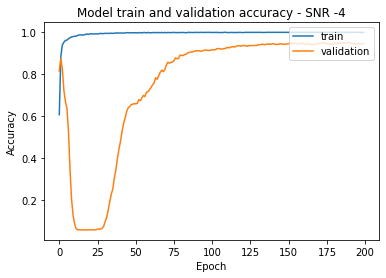

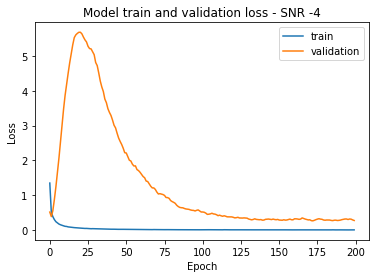


Training SNR = -4 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 227ms/step - loss: 0.1106 - accuracy: 0.9581 - val_loss: 0.0904 - val_accuracy: 0.9697
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0798 - accuracy: 0.9694 - val_loss: 0.0852 - val_accuracy: 0.9748
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0637 - accuracy: 0.9778 - val_loss: 0.1153 - val_accuracy: 0.9674
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0561 - accuracy: 0.9782 - val_loss: 0.1692 - val_accuracy: 0.9576
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0502 - accuracy: 0.9819 - val_loss: 0.2299 - val_accuracy: 0.9506
Epoch 6/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0457 - accuracy: 0.9853 - val_loss: 0.2814 - val_accuracy: 0.9445
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0388 - accuracy: 0.9860

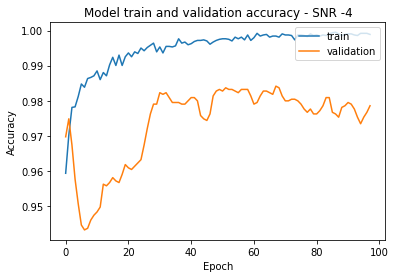

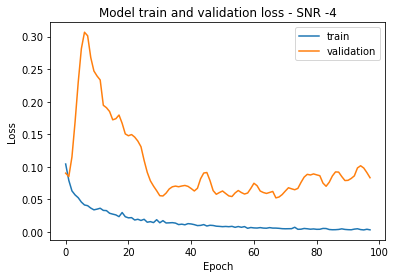


Training SNR = -4 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 237ms/step - loss: 0.1200 - accuracy: 0.9723 - val_loss: 0.1308 - val_accuracy: 0.9744
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0729 - accuracy: 0.9829 - val_loss: 0.1367 - val_accuracy: 0.9725
Epoch 3/200
7/7 [==============================] - 1s 166ms/step - loss: 0.0577 - accuracy: 0.9840 - val_loss: 0.1444 - val_accuracy: 0.9697
Epoch 4/200
7/7 [==============================] - 1s 155ms/step - loss: 0.0533 - accuracy: 0.9874 - val_loss: 0.1755 - val_accuracy: 0.9646
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0448 - accuracy: 0.9857 - val_loss: 0.2193 - val_accuracy: 0.9585
Epoch 6/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0431 - accuracy: 0.9882 - val_loss: 0.2627 - val_accuracy: 0.9483
Epoch 7/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0398 - accuracy: 0.988

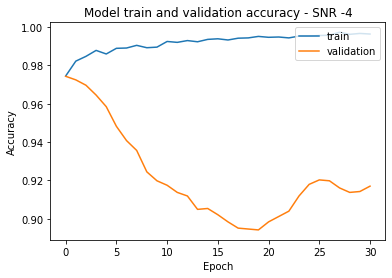

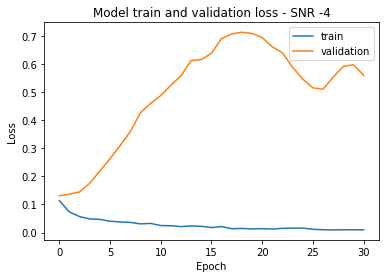


Training SNR = -4 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 224ms/step - loss: 0.2176 - accuracy: 0.9202 - val_loss: 0.1486 - val_accuracy: 0.9459
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1314 - accuracy: 0.9534 - val_loss: 0.2209 - val_accuracy: 0.9389
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0999 - accuracy: 0.9631 - val_loss: 0.3325 - val_accuracy: 0.9301
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0819 - accuracy: 0.9733 - val_loss: 0.4419 - val_accuracy: 0.9235
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0756 - accuracy: 0.9724 - val_loss: 0.5187 - val_accuracy: 0.9212
Epoch 6/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0647 - accuracy: 0.9789 - val_loss: 0.5394 - val_accuracy: 0.9203
Epoch 7/200
7/7 [==============================] - 1s 165ms/step - loss: 0.0574 - accuracy: 0.9803

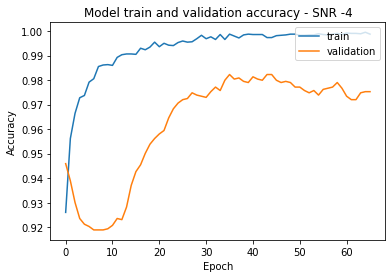

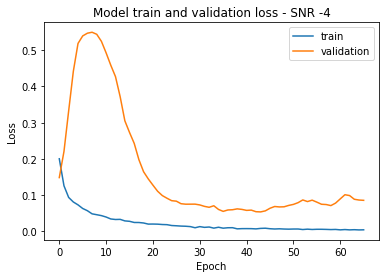


Score of SNR on All SNR model without Transfer Learning -2 = 96.82983756065369
Score of SNR on High SNR model without Transfer Learning -2 = 98.74125719070435
Score of SNR on low SNR model without Transfer Learning -2 = 92.44755506515503

Training SNR = -2 Data

Epoch 1/200
7/7 [==============================] - 3s 237ms/step - loss: 1.9357 - accuracy: 0.4363 - val_loss: 0.4867 - val_accuracy: 0.8480
Epoch 2/200
7/7 [==============================] - 1s 154ms/step - loss: 0.5413 - accuracy: 0.9025 - val_loss: 0.3122 - val_accuracy: 0.9156
Epoch 3/200
7/7 [==============================] - 1s 153ms/step - loss: 0.3907 - accuracy: 0.9489 - val_loss: 0.5602 - val_accuracy: 0.8368
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.2955 - accuracy: 0.9641 - val_loss: 0.9851 - val_accuracy: 0.7580
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.2304 - accuracy: 0.9715 - val_loss: 1.4263 - val_accuracy: 0.7016
Epoch 6/200
7/7 [==============

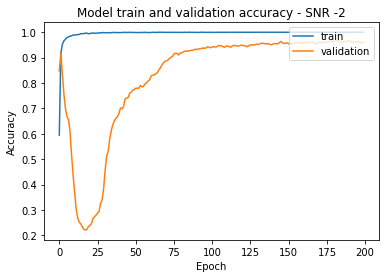

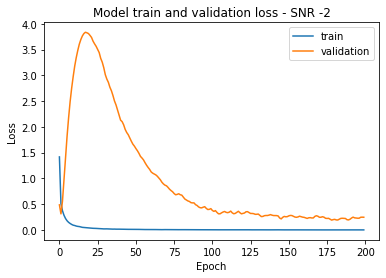


Training SNR = -2 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 236ms/step - loss: 0.0843 - accuracy: 0.9723 - val_loss: 0.0499 - val_accuracy: 0.9837
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0551 - accuracy: 0.9816 - val_loss: 0.0656 - val_accuracy: 0.9841
Epoch 3/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0409 - accuracy: 0.9854 - val_loss: 0.1021 - val_accuracy: 0.9716
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0306 - accuracy: 0.9909 - val_loss: 0.1619 - val_accuracy: 0.9608
Epoch 5/200
7/7 [==============================] - 1s 162ms/step - loss: 0.0299 - accuracy: 0.9888 - val_loss: 0.2405 - val_accuracy: 0.9483
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0201 - accuracy: 0.9931 - val_loss: 0.3086 - val_accuracy: 0.9431
Epoch 7/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0238 - accuracy: 0.9928

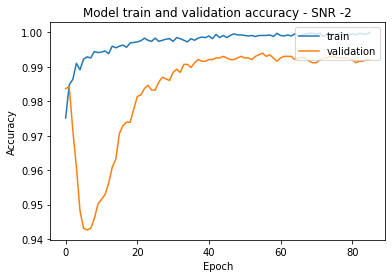

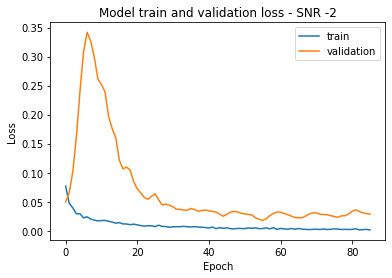


Training SNR = -2 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 231ms/step - loss: 0.0262 - accuracy: 0.9937 - val_loss: 0.0426 - val_accuracy: 0.9916
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0311 - accuracy: 0.9938 - val_loss: 0.0402 - val_accuracy: 0.9907
Epoch 3/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0092 - accuracy: 0.9954 - val_loss: 0.0448 - val_accuracy: 0.9888
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0093 - accuracy: 0.9964 - val_loss: 0.0539 - val_accuracy: 0.9869
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0049 - accuracy: 0.9981 - val_loss: 0.0718 - val_accuracy: 0.9851
Epoch 6/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0044 - accuracy: 0.9984 - val_loss: 0.0956 - val_accuracy: 0.9776
Epoch 7/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0073 - accuracy: 0.996

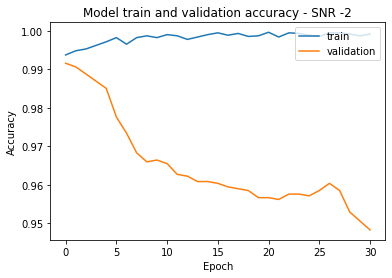

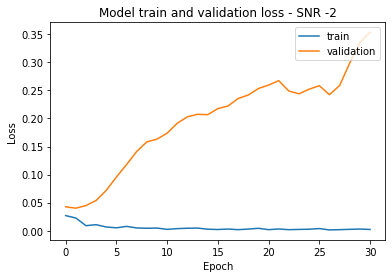


Training SNR = -2 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 233ms/step - loss: 0.1963 - accuracy: 0.9277 - val_loss: 0.1238 - val_accuracy: 0.9557
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1031 - accuracy: 0.9680 - val_loss: 0.2164 - val_accuracy: 0.9436
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0792 - accuracy: 0.9725 - val_loss: 0.3283 - val_accuracy: 0.9394
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0565 - accuracy: 0.9818 - val_loss: 0.4291 - val_accuracy: 0.9375
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0502 - accuracy: 0.9854 - val_loss: 0.4960 - val_accuracy: 0.9357
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0433 - accuracy: 0.9896 - val_loss: 0.5326 - val_accuracy: 0.9361
Epoch 7/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0368 - accuracy: 0.9899

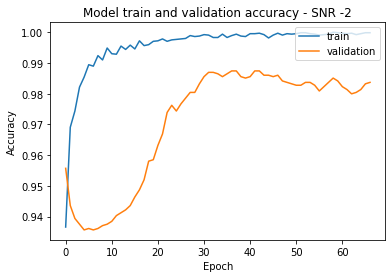

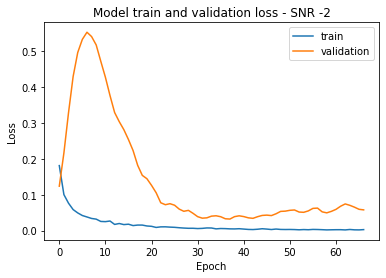

In [ ]:
#es

for i in range(5, 10):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_data_fft_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)

In [ ]:
#es

for i in range(10, 21):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_data_fft_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)


Score of SNR on All SNR model without Transfer Learning -20 = 14.312353730201721
Score of SNR on High SNR model without Transfer Learning -20 = 7.132866978645325
Score of SNR on low SNR model without Transfer Learning -20 = 36.59673631191254

Training SNR = -20 Data

Epoch 1/200
7/7 [==============================] - 3s 231ms/step - loss: 3.0962 - accuracy: 0.0690 - val_loss: 2.6826 - val_accuracy: 0.1049
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 2.8012 - accuracy: 0.1112 - val_loss: 2.6407 - val_accuracy: 0.1669
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 2.5932 - accuracy: 0.1638 - val_loss: 2.6015 - val_accuracy: 0.2135
Epoch 4/200
7/7 [==============================] - 1s 159ms/step - loss: 2.4486 - accuracy: 0.2127 - val_loss: 2.5785 - val_accuracy: 0.2242
Epoch 5/200
7/7 [==============================] - 1s 160ms/step - loss: 2.3138 - accuracy: 0.2686 - val_loss: 2.5723 - val_accuracy: 0.2182
Epoch 6/200
7/7 [=========

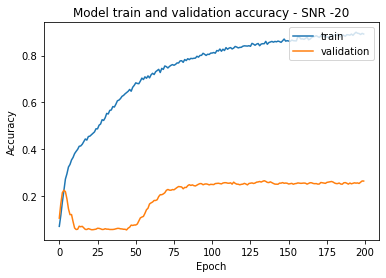

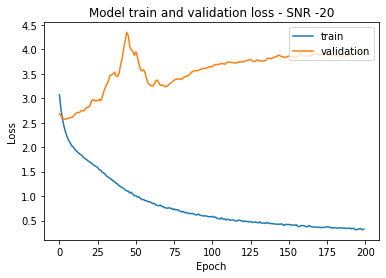


Training SNR = -20 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 231ms/step - loss: 3.8691 - accuracy: 0.3694 - val_loss: 4.2779 - val_accuracy: 0.1585
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 3.3513 - accuracy: 0.3980 - val_loss: 4.2068 - val_accuracy: 0.1585
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 3.0625 - accuracy: 0.4143 - val_loss: 4.1055 - val_accuracy: 0.1636
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 2.9275 - accuracy: 0.4086 - val_loss: 3.9067 - val_accuracy: 0.1758
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 2.7552 - accuracy: 0.4228 - val_loss: 3.6509 - val_accuracy: 0.1907
Epoch 6/200
7/7 [==============================] - 1s 148ms/step - loss: 2.5815 - accuracy: 0.4227 - val_loss: 3.3730 - val_accuracy: 0.2200
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - loss: 2.5020 - accuracy: 0.438

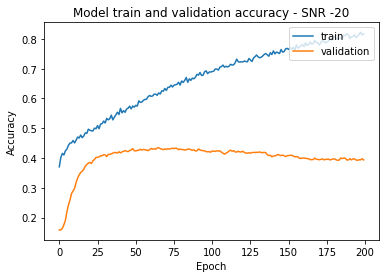

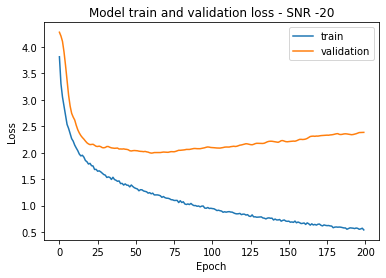


Training SNR = -20 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 4s 245ms/step - loss: 12.1032 - accuracy: 0.1921 - val_loss: 11.2435 - val_accuracy: 0.0783
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 11.2314 - accuracy: 0.2219 - val_loss: 10.1135 - val_accuracy: 0.0844
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 10.3096 - accuracy: 0.2217 - val_loss: 9.2776 - val_accuracy: 0.0932
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 9.7303 - accuracy: 0.2326 - val_loss: 8.6705 - val_accuracy: 0.1021
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 8.9990 - accuracy: 0.2365 - val_loss: 8.1764 - val_accuracy: 0.1119
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 8.5798 - accuracy: 0.2510 - val_loss: 7.8108 - val_accuracy: 0.1226
Epoch 7/200
7/7 [==============================] - 1s 159ms/step - loss: 8.1854 - accuracy:

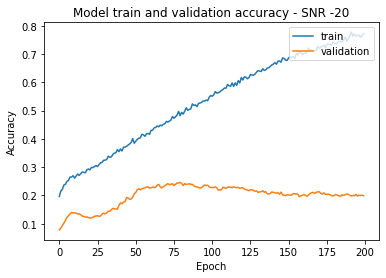

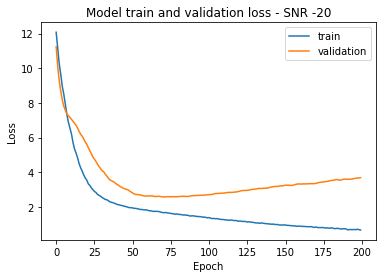


Training SNR = -20 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 228ms/step - loss: 3.0884 - accuracy: 0.4058 - val_loss: 2.3590 - val_accuracy: 0.4005
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 2.7320 - accuracy: 0.4396 - val_loss: 2.1991 - val_accuracy: 0.4238
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 2.4493 - accuracy: 0.4505 - val_loss: 2.0501 - val_accuracy: 0.4494
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 2.2515 - accuracy: 0.4780 - val_loss: 1.8908 - val_accuracy: 0.4825
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 2.1969 - accuracy: 0.4622 - val_loss: 1.7677 - val_accuracy: 0.5035
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 2.0252 - accuracy: 0.4853 - val_loss: 1.6931 - val_accuracy: 0.5207
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - loss: 2.0254 - accuracy: 0.481

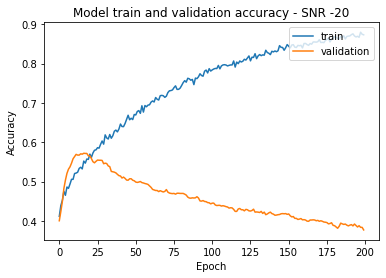

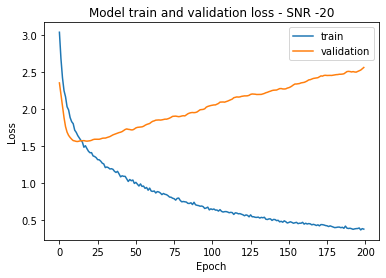


Score of SNR on All SNR model without Transfer Learning -18 = 24.289044737815857
Score of SNR on High SNR model without Transfer Learning -18 = 8.904428780078888
Score of SNR on low SNR model without Transfer Learning -18 = 56.78321719169617

Training SNR = -18 Data

Epoch 1/200
7/7 [==============================] - 3s 231ms/step - loss: 3.0670 - accuracy: 0.0719 - val_loss: 2.6429 - val_accuracy: 0.1809
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 2.6949 - accuracy: 0.1475 - val_loss: 2.5121 - val_accuracy: 0.3142
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 2.3557 - accuracy: 0.2595 - val_loss: 2.3772 - val_accuracy: 0.3925
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 2.0995 - accuracy: 0.3601 - val_loss: 2.3231 - val_accuracy: 0.4438
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 1.9566 - accuracy: 0.4002 - val_loss: 2.3564 - val_accuracy: 0.3734
Epoch 6/200
7/7 [=========

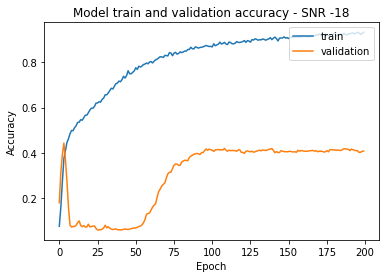

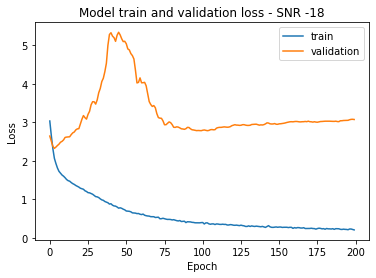


Training SNR = -18 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 232ms/step - loss: 2.7260 - accuracy: 0.5036 - val_loss: 2.8973 - val_accuracy: 0.2816
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 2.4467 - accuracy: 0.5132 - val_loss: 2.7157 - val_accuracy: 0.3221
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 2.2058 - accuracy: 0.5331 - val_loss: 2.5332 - val_accuracy: 0.3524
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 2.0957 - accuracy: 0.5384 - val_loss: 2.4041 - val_accuracy: 0.3739
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 1.9776 - accuracy: 0.5435 - val_loss: 2.2505 - val_accuracy: 0.3981
Epoch 6/200
7/7 [==============================] - 1s 148ms/step - loss: 1.8274 - accuracy: 0.5615 - val_loss: 2.1141 - val_accuracy: 0.4242
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - loss: 1.7976 - accuracy: 0.552

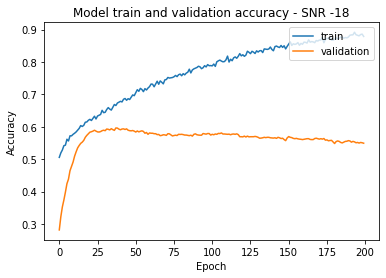

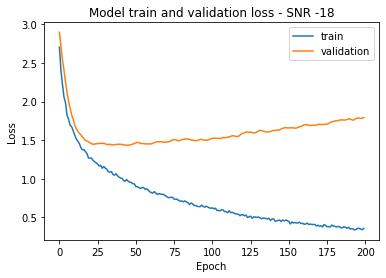


Training SNR = -18 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 234ms/step - loss: 9.6240 - accuracy: 0.2947 - val_loss: 9.0896 - val_accuracy: 0.1063
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 8.7803 - accuracy: 0.3282 - val_loss: 7.7285 - val_accuracy: 0.1422
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 8.1746 - accuracy: 0.3428 - val_loss: 6.8348 - val_accuracy: 0.1790
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 7.3435 - accuracy: 0.3661 - val_loss: 6.2548 - val_accuracy: 0.2065
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 7.0287 - accuracy: 0.3762 - val_loss: 5.8687 - val_accuracy: 0.2256
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 6.3859 - accuracy: 0.3897 - val_loss: 5.6951 - val_accuracy: 0.2396
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - loss: 6.2185 - accuracy: 0.38

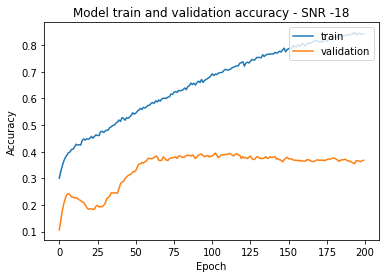

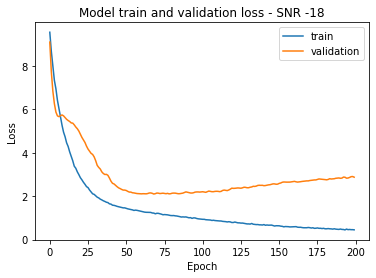


Training SNR = -18 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 241ms/step - loss: 2.0081 - accuracy: 0.5639 - val_loss: 1.4748 - val_accuracy: 0.5786
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 1.8215 - accuracy: 0.5675 - val_loss: 1.4116 - val_accuracy: 0.5963
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 1.6725 - accuracy: 0.5857 - val_loss: 1.3387 - val_accuracy: 0.6135
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 1.5648 - accuracy: 0.6008 - val_loss: 1.2706 - val_accuracy: 0.6345
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 1.5021 - accuracy: 0.6021 - val_loss: 1.1950 - val_accuracy: 0.6597
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 1.4077 - accuracy: 0.6166 - val_loss: 1.1494 - val_accuracy: 0.6685
Epoch 7/200
7/7 [==============================] - 1s 149ms/step - loss: 1.3780 - accuracy: 0.615

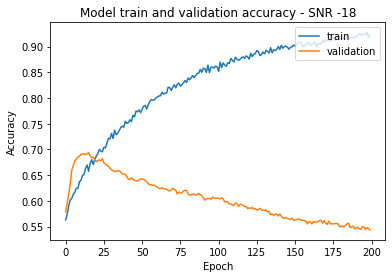

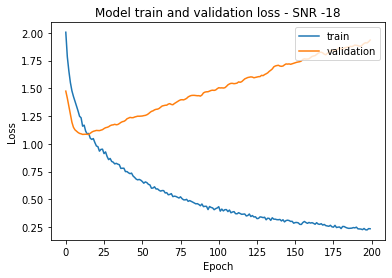


Score of SNR on All SNR model without Transfer Learning -16 = 45.36130428314209
Score of SNR on High SNR model without Transfer Learning -16 = 11.095570772886276
Score of SNR on low SNR model without Transfer Learning -16 = 78.18182110786438

Training SNR = -16 Data

Epoch 1/200
7/7 [==============================] - 3s 226ms/step - loss: 2.9191 - accuracy: 0.0935 - val_loss: 2.5173 - val_accuracy: 0.3869
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 2.2313 - accuracy: 0.2936 - val_loss: 2.0808 - val_accuracy: 0.5846
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 1.7361 - accuracy: 0.4940 - val_loss: 1.8424 - val_accuracy: 0.6103
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 1.4992 - accuracy: 0.5696 - val_loss: 1.8893 - val_accuracy: 0.5552
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 1.3670 - accuracy: 0.6018 - val_loss: 2.0222 - val_accuracy: 0.3939
Epoch 6/200
7/7 [=========

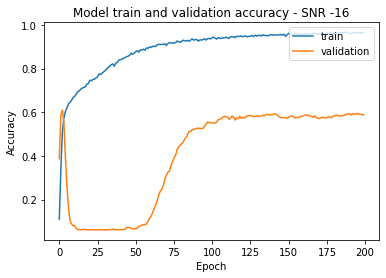

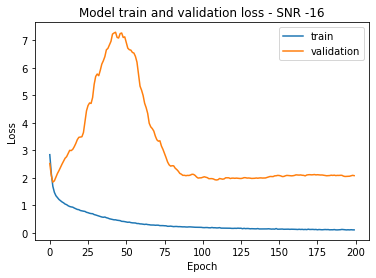


Training SNR = -16 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 230ms/step - loss: 1.6318 - accuracy: 0.6621 - val_loss: 1.8077 - val_accuracy: 0.4783
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 1.5225 - accuracy: 0.6698 - val_loss: 1.7237 - val_accuracy: 0.5105
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 1.4213 - accuracy: 0.6665 - val_loss: 1.6294 - val_accuracy: 0.5389
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 1.2360 - accuracy: 0.6885 - val_loss: 1.5585 - val_accuracy: 0.5524
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 1.2118 - accuracy: 0.6959 - val_loss: 1.4995 - val_accuracy: 0.5716
Epoch 6/200
7/7 [==============================] - 1s 148ms/step - loss: 1.1028 - accuracy: 0.7053 - val_loss: 1.4586 - val_accuracy: 0.5828
Epoch 7/200
7/7 [==============================] - 1s 147ms/step - loss: 1.0892 - accuracy: 0.705

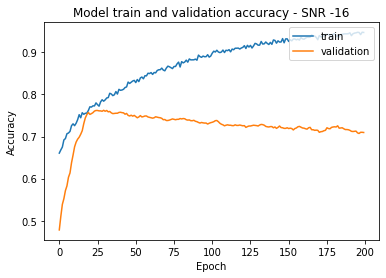

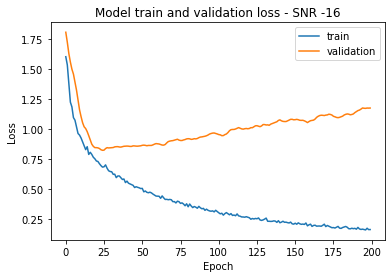


Training SNR = -16 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 286ms/step - loss: 6.9618 - accuracy: 0.4317 - val_loss: 6.5941 - val_accuracy: 0.1949
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 5.9864 - accuracy: 0.4727 - val_loss: 4.9559 - val_accuracy: 0.3058
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 5.5571 - accuracy: 0.5051 - val_loss: 4.1640 - val_accuracy: 0.3641
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 5.0272 - accuracy: 0.5339 - val_loss: 3.8042 - val_accuracy: 0.4042
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 4.6292 - accuracy: 0.5491 - val_loss: 3.6769 - val_accuracy: 0.4168
Epoch 6/200
7/7 [==============================] - 1s 148ms/step - loss: 4.2418 - accuracy: 0.5540 - val_loss: 3.6687 - val_accuracy: 0.4182
Epoch 7/200
7/7 [==============================] - 1s 152ms/step - loss: 3.9680 - accuracy: 0.56

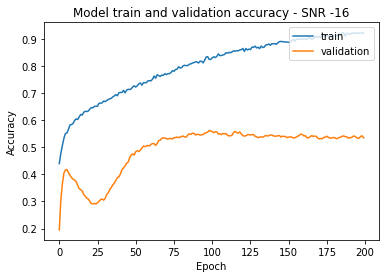

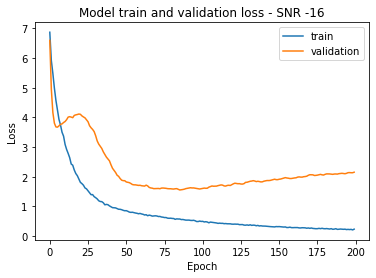


Training SNR = -16 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 234ms/step - loss: 1.1323 - accuracy: 0.7049 - val_loss: 0.7797 - val_accuracy: 0.7576
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 1.0182 - accuracy: 0.7202 - val_loss: 0.8193 - val_accuracy: 0.7497
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.9333 - accuracy: 0.7376 - val_loss: 0.8407 - val_accuracy: 0.7436
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.8932 - accuracy: 0.7427 - val_loss: 0.8083 - val_accuracy: 0.7524
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.8648 - accuracy: 0.7395 - val_loss: 0.7502 - val_accuracy: 0.7720
Epoch 6/200
7/7 [==============================] - 1s 153ms/step - loss: 0.8081 - accuracy: 0.7556 - val_loss: 0.7164 - val_accuracy: 0.7883
Epoch 7/200
7/7 [==============================] - 1s 213ms/step - loss: 0.7746 - accuracy: 0.753

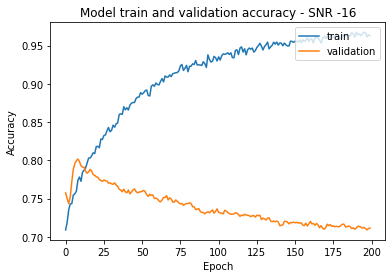

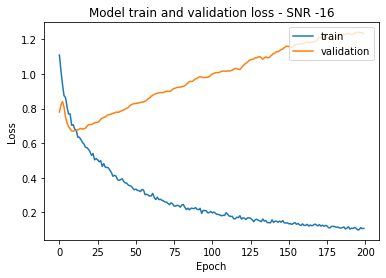


Score of SNR on All SNR model without Transfer Learning -14 = 70.3496515750885
Score of SNR on High SNR model without Transfer Learning -14 = 16.22377634048462
Score of SNR on low SNR model without Transfer Learning -14 = 89.09090757369995

Training SNR = -14 Data

Epoch 1/200
7/7 [==============================] - 3s 237ms/step - loss: 2.8196 - accuracy: 0.1319 - val_loss: 2.1332 - val_accuracy: 0.6256
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 1.6150 - accuracy: 0.5569 - val_loss: 1.4071 - val_accuracy: 0.6970
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 1.2079 - accuracy: 0.6607 - val_loss: 1.2815 - val_accuracy: 0.7291
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 1.0824 - accuracy: 0.6925 - val_loss: 1.4279 - val_accuracy: 0.6746
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.9920 - accuracy: 0.7115 - val_loss: 1.6494 - val_accuracy: 0.5119
Epoch 6/200
7/7 [===========

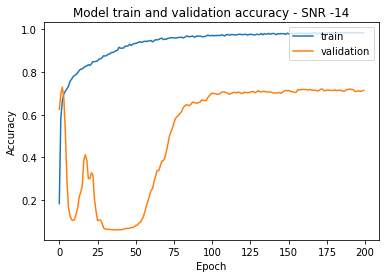

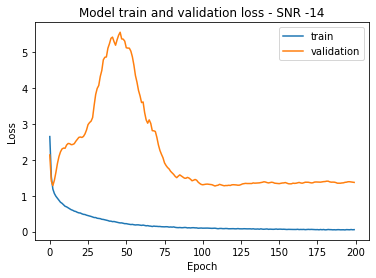


Training SNR = -14 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 227ms/step - loss: 1.1047 - accuracy: 0.7517 - val_loss: 0.8650 - val_accuracy: 0.6951
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.9215 - accuracy: 0.7669 - val_loss: 0.8581 - val_accuracy: 0.7142
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.8264 - accuracy: 0.7799 - val_loss: 0.7924 - val_accuracy: 0.7389
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.7547 - accuracy: 0.7834 - val_loss: 0.7478 - val_accuracy: 0.7534
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.6600 - accuracy: 0.8030 - val_loss: 0.7274 - val_accuracy: 0.7632
Epoch 6/200
7/7 [==============================] - 1s 151ms/step - loss: 0.6574 - accuracy: 0.7941 - val_loss: 0.7188 - val_accuracy: 0.7725
Epoch 7/200
7/7 [==============================] - 1s 150ms/step - loss: 0.5957 - accuracy: 0.813

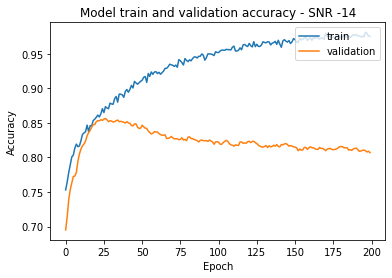

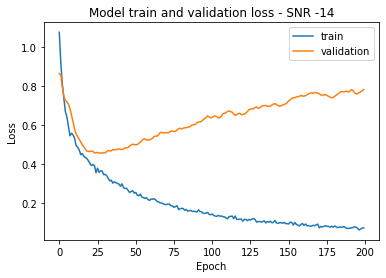


Training SNR = -14 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 238ms/step - loss: 4.9036 - accuracy: 0.5697 - val_loss: 4.6080 - val_accuracy: 0.3119
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 3.9865 - accuracy: 0.6273 - val_loss: 3.4192 - val_accuracy: 0.4364
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 3.5525 - accuracy: 0.6547 - val_loss: 2.8699 - val_accuracy: 0.5161
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 3.1813 - accuracy: 0.6651 - val_loss: 2.6622 - val_accuracy: 0.5562
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 2.9718 - accuracy: 0.6802 - val_loss: 2.5944 - val_accuracy: 0.5692
Epoch 6/200
7/7 [==============================] - 1s 150ms/step - loss: 2.5795 - accuracy: 0.6913 - val_loss: 2.6078 - val_accuracy: 0.5706
Epoch 7/200
7/7 [==============================] - 1s 150ms/step - loss: 2.4301 - accuracy: 0.70

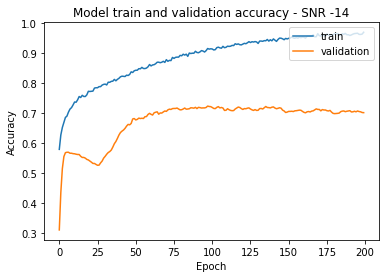

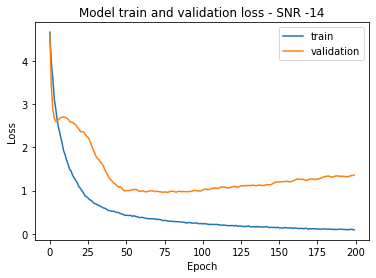


Training SNR = -14 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 227ms/step - loss: 0.7008 - accuracy: 0.7914 - val_loss: 0.4276 - val_accuracy: 0.8555
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.6185 - accuracy: 0.8051 - val_loss: 0.4443 - val_accuracy: 0.8438
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.5619 - accuracy: 0.8140 - val_loss: 0.4573 - val_accuracy: 0.8387
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.5318 - accuracy: 0.8232 - val_loss: 0.4632 - val_accuracy: 0.8392
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.4866 - accuracy: 0.8333 - val_loss: 0.4675 - val_accuracy: 0.8420
Epoch 6/200
7/7 [==============================] - 1s 147ms/step - loss: 0.4626 - accuracy: 0.8419 - val_loss: 0.4684 - val_accuracy: 0.8438
Epoch 7/200
7/7 [==============================] - 1s 149ms/step - loss: 0.4427 - accuracy: 0.843

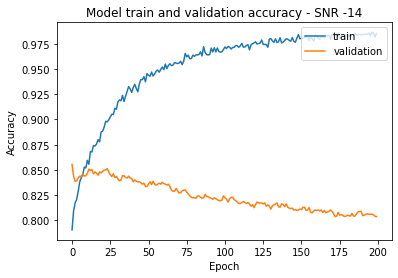

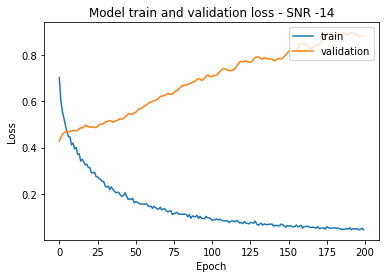


Score of SNR on All SNR model without Transfer Learning -12 = 87.27272748947144
Score of SNR on High SNR model without Transfer Learning -12 = 35.61771512031555
Score of SNR on low SNR model without Transfer Learning -12 = 90.95571041107178

Training SNR = -12 Data

Epoch 1/200
7/7 [==============================] - 3s 268ms/step - loss: 2.6304 - accuracy: 0.1904 - val_loss: 1.6037 - val_accuracy: 0.6839
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 1.1055 - accuracy: 0.7087 - val_loss: 0.9191 - val_accuracy: 0.7464
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 0.8840 - accuracy: 0.7438 - val_loss: 0.8433 - val_accuracy: 0.7473
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.7869 - accuracy: 0.7603 - val_loss: 0.9562 - val_accuracy: 0.7762
Epoch 5/200
7/7 [==============================] - 1s 147ms/step - loss: 0.7003 - accuracy: 0.7862 - val_loss: 1.1962 - val_accuracy: 0.7096
Epoch 6/200
7/7 [==========

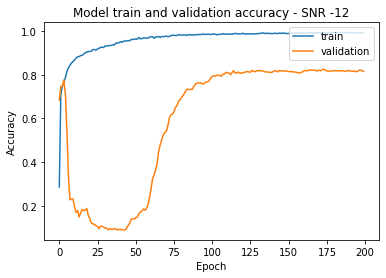

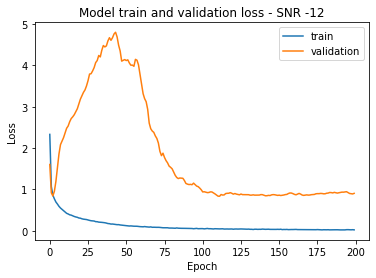


Training SNR = -12 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 239ms/step - loss: 0.6721 - accuracy: 0.8249 - val_loss: 0.3711 - val_accuracy: 0.8648
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.5703 - accuracy: 0.8394 - val_loss: 0.3734 - val_accuracy: 0.8662
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.4592 - accuracy: 0.8584 - val_loss: 0.3434 - val_accuracy: 0.8746
Epoch 4/200
7/7 [==============================] - 1s 154ms/step - loss: 0.4181 - accuracy: 0.8639 - val_loss: 0.3235 - val_accuracy: 0.8839
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.3816 - accuracy: 0.8706 - val_loss: 0.3184 - val_accuracy: 0.8858
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 0.3391 - accuracy: 0.8796 - val_loss: 0.3081 - val_accuracy: 0.8872
Epoch 7/200
7/7 [==============================] - 1s 159ms/step - loss: 0.3272 - accuracy: 0.884

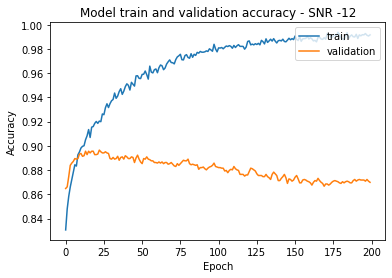

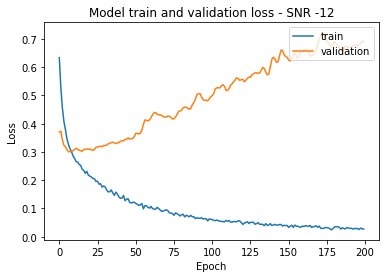


Training SNR = -12 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 237ms/step - loss: 2.7314 - accuracy: 0.7135 - val_loss: 2.4166 - val_accuracy: 0.5566
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 2.2385 - accuracy: 0.7466 - val_loss: 1.8384 - val_accuracy: 0.6625
Epoch 3/200
7/7 [==============================] - 1s 156ms/step - loss: 1.9234 - accuracy: 0.7713 - val_loss: 1.6399 - val_accuracy: 0.7147
Epoch 4/200
7/7 [==============================] - 1s 159ms/step - loss: 1.6544 - accuracy: 0.7903 - val_loss: 1.6255 - val_accuracy: 0.7352
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 1.4065 - accuracy: 0.8060 - val_loss: 1.6657 - val_accuracy: 0.7408
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 1.4138 - accuracy: 0.8058 - val_loss: 1.7256 - val_accuracy: 0.7431
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - loss: 1.2480 - accuracy: 0.81

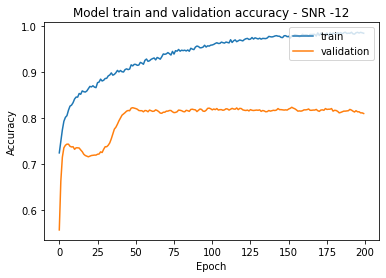

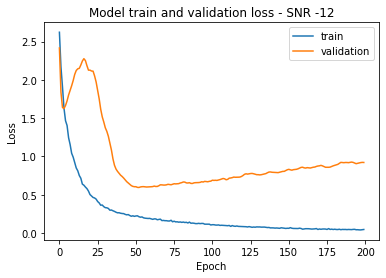


Training SNR = -12 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 243ms/step - loss: 0.4543 - accuracy: 0.8404 - val_loss: 0.2619 - val_accuracy: 0.9049
Epoch 2/200
7/7 [==============================] - 1s 153ms/step - loss: 0.3621 - accuracy: 0.8700 - val_loss: 0.2766 - val_accuracy: 0.9086
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.3276 - accuracy: 0.8763 - val_loss: 0.3076 - val_accuracy: 0.9016
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.3229 - accuracy: 0.8792 - val_loss: 0.3443 - val_accuracy: 0.8914
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.2946 - accuracy: 0.8873 - val_loss: 0.3640 - val_accuracy: 0.8890
Epoch 6/200
7/7 [==============================] - 1s 148ms/step - loss: 0.2745 - accuracy: 0.8963 - val_loss: 0.3798 - val_accuracy: 0.8848
Epoch 7/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2728 - accuracy: 0.900

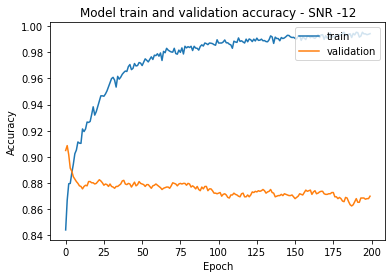

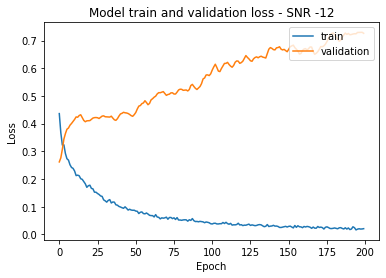

In [ ]:
for i in range(0, 5):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_data_fft_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)


Score of SNR on All SNR model without Transfer Learning -10 = 91.84148907661438
Score of SNR on High SNR model without Transfer Learning -10 = 64.61538672447205
Score of SNR on low SNR model without Transfer Learning -10 = 90.20978808403015

Training SNR = -10 Data

Epoch 1/200
7/7 [==============================] - 8s 322ms/step - loss: 2.4096 - accuracy: 0.2789 - val_loss: 1.0859 - val_accuracy: 0.7664
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.8705 - accuracy: 0.7480 - val_loss: 0.6624 - val_accuracy: 0.7814
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.7340 - accuracy: 0.7733 - val_loss: 0.6598 - val_accuracy: 0.7949
Epoch 4/200
7/7 [==============================] - 1s 160ms/step - loss: 0.6390 - accuracy: 0.8053 - val_loss: 0.7898 - val_accuracy: 0.8326
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.5629 - accuracy: 0.8409 - val_loss: 1.0551 - val_accuracy: 0.7716
Epoch 6/200
7/7 [==========

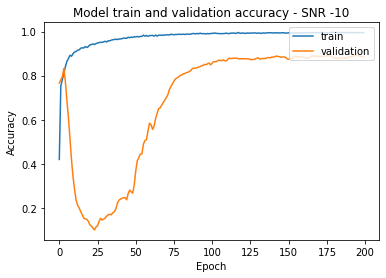

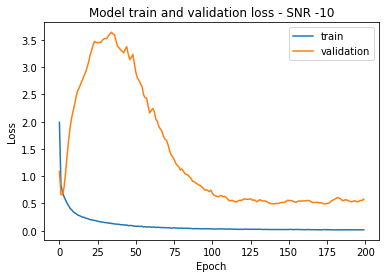


Training SNR = -10 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 234ms/step - loss: 0.4313 - accuracy: 0.8635 - val_loss: 0.2726 - val_accuracy: 0.9063
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.3432 - accuracy: 0.8897 - val_loss: 0.2777 - val_accuracy: 0.9077
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2969 - accuracy: 0.8980 - val_loss: 0.2618 - val_accuracy: 0.9110
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2622 - accuracy: 0.9075 - val_loss: 0.2563 - val_accuracy: 0.9119
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2615 - accuracy: 0.9049 - val_loss: 0.2517 - val_accuracy: 0.9133
Epoch 6/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2363 - accuracy: 0.9122 - val_loss: 0.2473 - val_accuracy: 0.9128
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 0.2293 - accuracy: 0.914

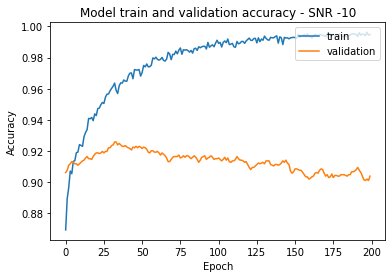

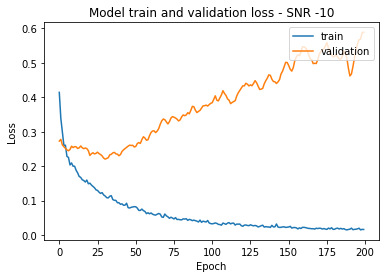


Training SNR = -10 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 227ms/step - loss: 1.6732 - accuracy: 0.8021 - val_loss: 1.0253 - val_accuracy: 0.7748
Epoch 2/200
7/7 [==============================] - 1s 154ms/step - loss: 1.2818 - accuracy: 0.8361 - val_loss: 0.8530 - val_accuracy: 0.8294
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 1.0857 - accuracy: 0.8481 - val_loss: 0.8586 - val_accuracy: 0.8382
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.9144 - accuracy: 0.8632 - val_loss: 0.9284 - val_accuracy: 0.8354
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.7959 - accuracy: 0.8797 - val_loss: 0.9984 - val_accuracy: 0.8326
Epoch 6/200
7/7 [==============================] - 1s 153ms/step - loss: 0.7618 - accuracy: 0.8791 - val_loss: 1.0604 - val_accuracy: 0.8294
Epoch 7/200
7/7 [==============================] - 1s 152ms/step - loss: 0.7166 - accuracy: 0.87

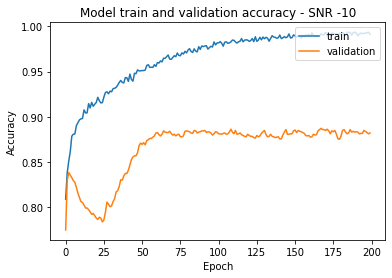

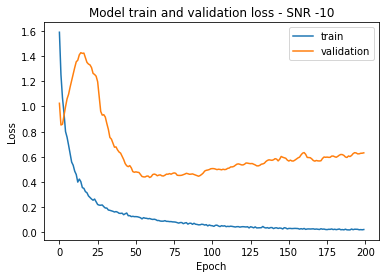


Training SNR = -10 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 287ms/step - loss: 0.3555 - accuracy: 0.8633 - val_loss: 0.2205 - val_accuracy: 0.9203
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2698 - accuracy: 0.8958 - val_loss: 0.2471 - val_accuracy: 0.9193
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2382 - accuracy: 0.9069 - val_loss: 0.3085 - val_accuracy: 0.9119
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2399 - accuracy: 0.9041 - val_loss: 0.3689 - val_accuracy: 0.9044
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.2018 - accuracy: 0.9256 - val_loss: 0.4343 - val_accuracy: 0.8974
Epoch 6/200
7/7 [==============================] - 1s 155ms/step - loss: 0.2047 - accuracy: 0.9153 - val_loss: 0.4793 - val_accuracy: 0.8951
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1966 - accuracy: 0.923

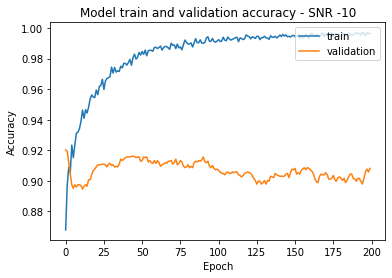

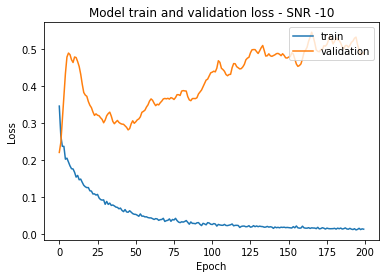


Score of SNR on All SNR model without Transfer Learning -8 = 93.24009418487549
Score of SNR on High SNR model without Transfer Learning -8 = 85.78088283538818
Score of SNR on low SNR model without Transfer Learning -8 = 90.3496503829956

Training SNR = -8 Data

Epoch 1/200
7/7 [==============================] - 3s 239ms/step - loss: 2.2441 - accuracy: 0.3250 - val_loss: 0.8790 - val_accuracy: 0.7935
Epoch 2/200
7/7 [==============================] - 1s 157ms/step - loss: 0.7800 - accuracy: 0.7714 - val_loss: 0.6145 - val_accuracy: 0.7888
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.6183 - accuracy: 0.8183 - val_loss: 0.6023 - val_accuracy: 0.8135
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.5275 - accuracy: 0.8762 - val_loss: 0.7323 - val_accuracy: 0.8415
Epoch 5/200
7/7 [==============================] - 1s 154ms/step - loss: 0.4518 - accuracy: 0.9059 - val_loss: 0.9818 - val_accuracy: 0.7907
Epoch 6/200
7/7 [===============

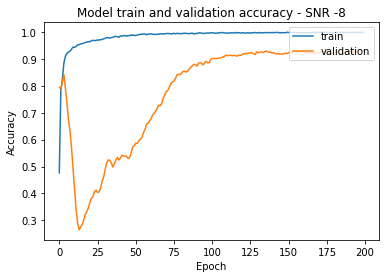

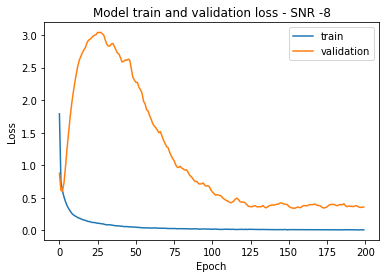


Training SNR = -8 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 233ms/step - loss: 0.2609 - accuracy: 0.9066 - val_loss: 0.1774 - val_accuracy: 0.9385
Epoch 2/200
7/7 [==============================] - 1s 160ms/step - loss: 0.1966 - accuracy: 0.9312 - val_loss: 0.1796 - val_accuracy: 0.9422
Epoch 3/200
7/7 [==============================] - 1s 154ms/step - loss: 0.1712 - accuracy: 0.9370 - val_loss: 0.1769 - val_accuracy: 0.9469
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1547 - accuracy: 0.9402 - val_loss: 0.1806 - val_accuracy: 0.9510
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1511 - accuracy: 0.9418 - val_loss: 0.1894 - val_accuracy: 0.9469
Epoch 6/200
7/7 [==============================] - 1s 159ms/step - loss: 0.1336 - accuracy: 0.9486 - val_loss: 0.1993 - val_accuracy: 0.9441
Epoch 7/200
7/7 [==============================] - 1s 156ms/step - loss: 0.1273 - accuracy: 0.9500

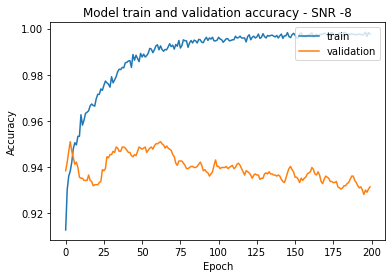

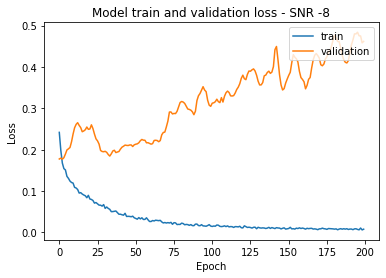


Training SNR = -8 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 228ms/step - loss: 0.7497 - accuracy: 0.8849 - val_loss: 0.4281 - val_accuracy: 0.9175
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.5372 - accuracy: 0.9094 - val_loss: 0.4493 - val_accuracy: 0.9161
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.4718 - accuracy: 0.9207 - val_loss: 0.5315 - val_accuracy: 0.9049
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.4473 - accuracy: 0.9258 - val_loss: 0.6168 - val_accuracy: 0.8951
Epoch 5/200
7/7 [==============================] - 1s 162ms/step - loss: 0.3546 - accuracy: 0.9353 - val_loss: 0.6767 - val_accuracy: 0.8862
Epoch 6/200
7/7 [==============================] - 1s 157ms/step - loss: 0.3164 - accuracy: 0.9364 - val_loss: 0.7813 - val_accuracy: 0.8765
Epoch 7/200
7/7 [==============================] - 1s 154ms/step - loss: 0.2752 - accuracy: 0.943

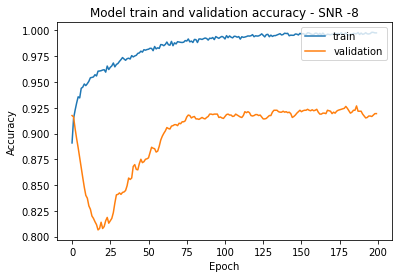

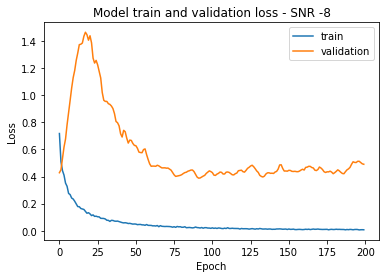


Training SNR = -8 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 242ms/step - loss: 0.2758 - accuracy: 0.8885 - val_loss: 0.2073 - val_accuracy: 0.9249
Epoch 2/200
7/7 [==============================] - 1s 153ms/step - loss: 0.2019 - accuracy: 0.9200 - val_loss: 0.2575 - val_accuracy: 0.9249
Epoch 3/200
7/7 [==============================] - 1s 154ms/step - loss: 0.1698 - accuracy: 0.9325 - val_loss: 0.3566 - val_accuracy: 0.9207
Epoch 4/200
7/7 [==============================] - 1s 157ms/step - loss: 0.1513 - accuracy: 0.9409 - val_loss: 0.4542 - val_accuracy: 0.9142
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1388 - accuracy: 0.9473 - val_loss: 0.5346 - val_accuracy: 0.9096
Epoch 6/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1425 - accuracy: 0.9448 - val_loss: 0.5999 - val_accuracy: 0.9007
Epoch 7/200
7/7 [==============================] - 1s 156ms/step - loss: 0.1285 - accuracy: 0.9528

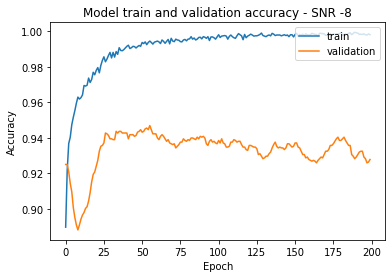

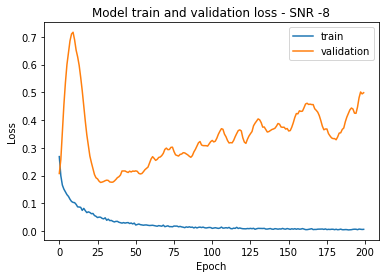


Score of SNR on All SNR model without Transfer Learning -6 = 95.99067568778992
Score of SNR on High SNR model without Transfer Learning -6 = 93.84615421295166
Score of SNR on low SNR model without Transfer Learning -6 = 91.04894995689392

Training SNR = -6 Data

Epoch 1/200
7/7 [==============================] - 4s 231ms/step - loss: 2.0621 - accuracy: 0.3936 - val_loss: 0.7214 - val_accuracy: 0.8079
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.6806 - accuracy: 0.8163 - val_loss: 0.5411 - val_accuracy: 0.8107
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.5249 - accuracy: 0.8921 - val_loss: 0.6425 - val_accuracy: 0.8061
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.4253 - accuracy: 0.9298 - val_loss: 0.8656 - val_accuracy: 0.7711
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.3530 - accuracy: 0.9351 - val_loss: 1.1700 - val_accuracy: 0.7058
Epoch 6/200
7/7 [==============

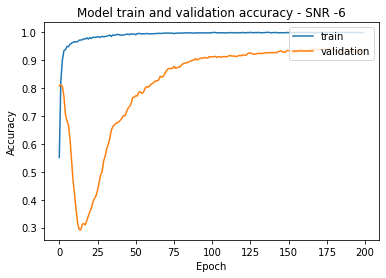

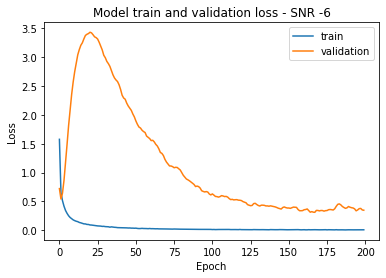


Training SNR = -6 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 229ms/step - loss: 0.1772 - accuracy: 0.9344 - val_loss: 0.1538 - val_accuracy: 0.9483
Epoch 2/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1396 - accuracy: 0.9474 - val_loss: 0.1631 - val_accuracy: 0.9492
Epoch 3/200
7/7 [==============================] - 1s 156ms/step - loss: 0.1119 - accuracy: 0.9614 - val_loss: 0.1758 - val_accuracy: 0.9506
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1094 - accuracy: 0.9572 - val_loss: 0.2040 - val_accuracy: 0.9441
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1080 - accuracy: 0.9626 - val_loss: 0.2267 - val_accuracy: 0.9427
Epoch 6/200
7/7 [==============================] - 1s 156ms/step - loss: 0.0924 - accuracy: 0.9638 - val_loss: 0.2498 - val_accuracy: 0.9417
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0878 - accuracy: 0.9672

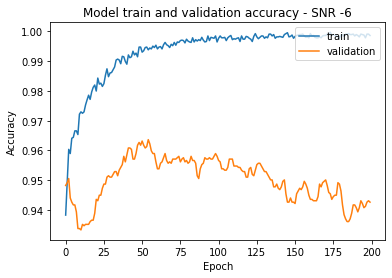

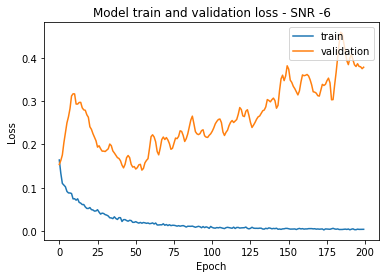


Training SNR = -6 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 232ms/step - loss: 0.3305 - accuracy: 0.9372 - val_loss: 0.2028 - val_accuracy: 0.9529
Epoch 2/200
7/7 [==============================] - 1s 155ms/step - loss: 0.2418 - accuracy: 0.9523 - val_loss: 0.2137 - val_accuracy: 0.9487
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.2298 - accuracy: 0.9561 - val_loss: 0.2429 - val_accuracy: 0.9450
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1666 - accuracy: 0.9636 - val_loss: 0.2968 - val_accuracy: 0.9343
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1593 - accuracy: 0.9677 - val_loss: 0.3337 - val_accuracy: 0.9291
Epoch 6/200
7/7 [==============================] - 1s 160ms/step - loss: 0.1414 - accuracy: 0.9681 - val_loss: 0.3962 - val_accuracy: 0.9221
Epoch 7/200
7/7 [==============================] - 1s 154ms/step - loss: 0.1294 - accuracy: 0.968

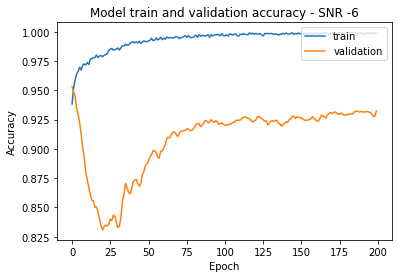

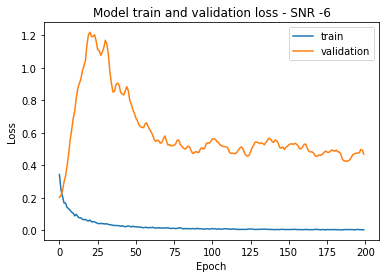


Training SNR = -6 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 228ms/step - loss: 0.2480 - accuracy: 0.9025 - val_loss: 0.2178 - val_accuracy: 0.9315
Epoch 2/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1714 - accuracy: 0.9354 - val_loss: 0.3098 - val_accuracy: 0.9221
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1357 - accuracy: 0.9480 - val_loss: 0.4494 - val_accuracy: 0.9189
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1170 - accuracy: 0.9550 - val_loss: 0.5767 - val_accuracy: 0.9161
Epoch 5/200
7/7 [==============================] - 1s 154ms/step - loss: 0.1023 - accuracy: 0.9641 - val_loss: 0.6609 - val_accuracy: 0.9152
Epoch 6/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0953 - accuracy: 0.9675 - val_loss: 0.7097 - val_accuracy: 0.9128
Epoch 7/200
7/7 [==============================] - 1s 156ms/step - loss: 0.0795 - accuracy: 0.9703

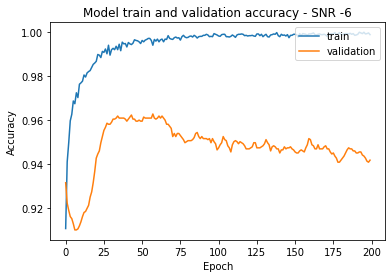

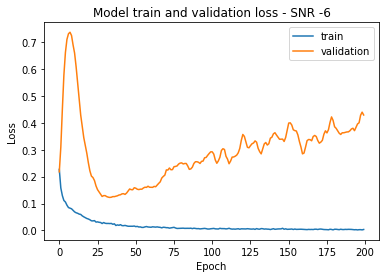


Score of SNR on All SNR model without Transfer Learning -4 = 96.68997526168823
Score of SNR on High SNR model without Transfer Learning -4 = 97.06293940544128
Score of SNR on low SNR model without Transfer Learning -4 = 91.84148907661438

Training SNR = -4 Data

Epoch 1/200
7/7 [==============================] - 4s 230ms/step - loss: 1.8993 - accuracy: 0.4490 - val_loss: 0.5392 - val_accuracy: 0.8471
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.5815 - accuracy: 0.8449 - val_loss: 0.4265 - val_accuracy: 0.8830
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.4387 - accuracy: 0.9281 - val_loss: 0.6134 - val_accuracy: 0.8159
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.3461 - accuracy: 0.9488 - val_loss: 0.9225 - val_accuracy: 0.7818
Epoch 5/200
7/7 [==============================] - 1s 155ms/step - loss: 0.2875 - accuracy: 0.9523 - val_loss: 1.2590 - val_accuracy: 0.7301
Epoch 6/200
7/7 [==============

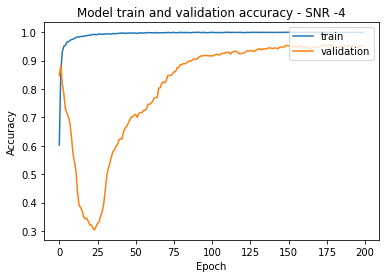

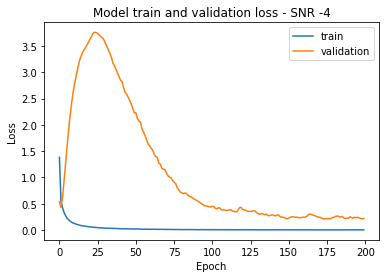


Training SNR = -4 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 244ms/step - loss: 0.1147 - accuracy: 0.9577 - val_loss: 0.0802 - val_accuracy: 0.9697
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0817 - accuracy: 0.9684 - val_loss: 0.0818 - val_accuracy: 0.9688
Epoch 3/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0697 - accuracy: 0.9746 - val_loss: 0.1149 - val_accuracy: 0.9650
Epoch 4/200
7/7 [==============================] - 1s 169ms/step - loss: 0.0626 - accuracy: 0.9745 - val_loss: 0.1567 - val_accuracy: 0.9618
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0530 - accuracy: 0.9800 - val_loss: 0.2142 - val_accuracy: 0.9520
Epoch 6/200
7/7 [==============================] - 1s 162ms/step - loss: 0.0528 - accuracy: 0.9800 - val_loss: 0.2779 - val_accuracy: 0.9431
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0495 - accuracy: 0.9818

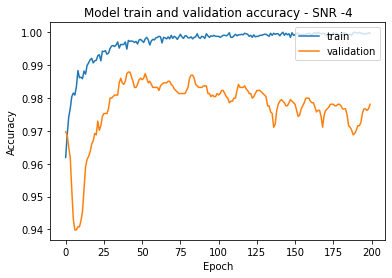

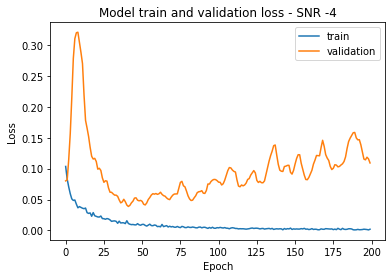


Training SNR = -4 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 243ms/step - loss: 0.1048 - accuracy: 0.9749 - val_loss: 0.0970 - val_accuracy: 0.9753
Epoch 2/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0858 - accuracy: 0.9804 - val_loss: 0.1145 - val_accuracy: 0.9730
Epoch 3/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0583 - accuracy: 0.9837 - val_loss: 0.1389 - val_accuracy: 0.9664
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0567 - accuracy: 0.9823 - val_loss: 0.1780 - val_accuracy: 0.9594
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0443 - accuracy: 0.9880 - val_loss: 0.2461 - val_accuracy: 0.9501
Epoch 6/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0446 - accuracy: 0.9886 - val_loss: 0.2973 - val_accuracy: 0.9445
Epoch 7/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0302 - accuracy: 0.990

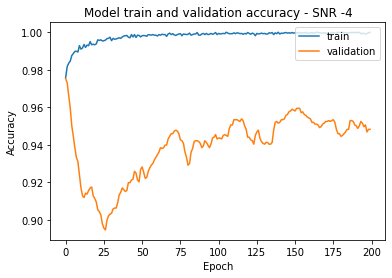

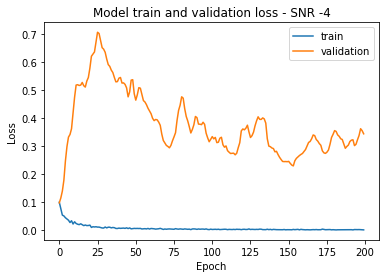


Training SNR = -4 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 231ms/step - loss: 0.2175 - accuracy: 0.9170 - val_loss: 0.1554 - val_accuracy: 0.9459
Epoch 2/200
7/7 [==============================] - 1s 155ms/step - loss: 0.1354 - accuracy: 0.9512 - val_loss: 0.2352 - val_accuracy: 0.9366
Epoch 3/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0994 - accuracy: 0.9672 - val_loss: 0.3582 - val_accuracy: 0.9310
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0832 - accuracy: 0.9739 - val_loss: 0.4550 - val_accuracy: 0.9287
Epoch 5/200
7/7 [==============================] - 1s 155ms/step - loss: 0.0688 - accuracy: 0.9748 - val_loss: 0.5207 - val_accuracy: 0.9273
Epoch 6/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0691 - accuracy: 0.9795 - val_loss: 0.5581 - val_accuracy: 0.9231
Epoch 7/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0571 - accuracy: 0.9827

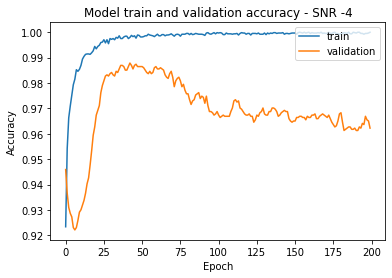

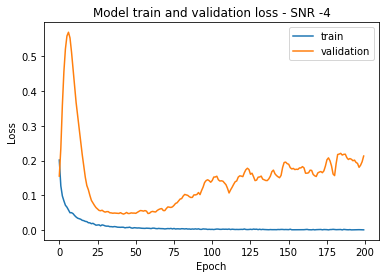


Score of SNR on All SNR model without Transfer Learning -2 = 96.87645435333252
Score of SNR on High SNR model without Transfer Learning -2 = 98.74125719070435
Score of SNR on low SNR model without Transfer Learning -2 = 92.16783046722412

Training SNR = -2 Data

Epoch 1/200
7/7 [==============================] - 4s 235ms/step - loss: 1.8804 - accuracy: 0.4444 - val_loss: 0.4682 - val_accuracy: 0.8280
Epoch 2/200
7/7 [==============================] - 1s 154ms/step - loss: 0.5334 - accuracy: 0.8877 - val_loss: 0.3468 - val_accuracy: 0.9021
Epoch 3/200
7/7 [==============================] - 1s 155ms/step - loss: 0.3787 - accuracy: 0.9517 - val_loss: 0.5610 - val_accuracy: 0.8429
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.2914 - accuracy: 0.9628 - val_loss: 0.8800 - val_accuracy: 0.7646
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2356 - accuracy: 0.9717 - val_loss: 1.2122 - val_accuracy: 0.7086
Epoch 6/200
7/7 [==============

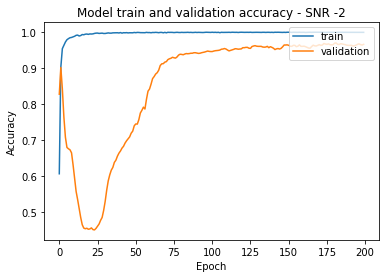

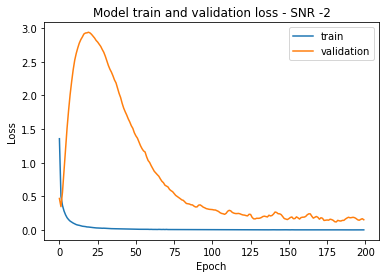


Training SNR = -2 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 247ms/step - loss: 0.0827 - accuracy: 0.9751 - val_loss: 0.0459 - val_accuracy: 0.9800
Epoch 2/200
7/7 [==============================] - 1s 155ms/step - loss: 0.0514 - accuracy: 0.9830 - val_loss: 0.0577 - val_accuracy: 0.9795
Epoch 3/200
7/7 [==============================] - 1s 158ms/step - loss: 0.0378 - accuracy: 0.9870 - val_loss: 0.1022 - val_accuracy: 0.9697
Epoch 4/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0288 - accuracy: 0.9904 - val_loss: 0.1659 - val_accuracy: 0.9594
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0309 - accuracy: 0.9894 - val_loss: 0.2263 - val_accuracy: 0.9557
Epoch 6/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0246 - accuracy: 0.9923 - val_loss: 0.2465 - val_accuracy: 0.9538
Epoch 7/200
7/7 [==============================] - 1s 156ms/step - loss: 0.0243 - accuracy: 0.9914

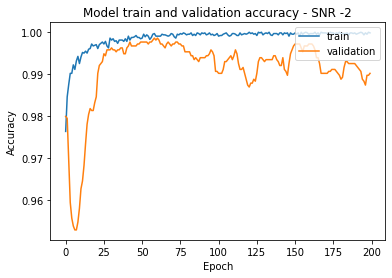

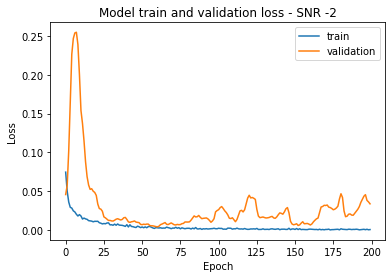


Training SNR = -2 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 234ms/step - loss: 0.0283 - accuracy: 0.9915 - val_loss: 0.0483 - val_accuracy: 0.9869
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0190 - accuracy: 0.9940 - val_loss: 0.0426 - val_accuracy: 0.9869
Epoch 3/200
7/7 [==============================] - 1s 163ms/step - loss: 0.0160 - accuracy: 0.9946 - val_loss: 0.0447 - val_accuracy: 0.9869
Epoch 4/200
7/7 [==============================] - 1s 155ms/step - loss: 0.0126 - accuracy: 0.9965 - val_loss: 0.0517 - val_accuracy: 0.9851
Epoch 5/200
7/7 [==============================] - 1s 155ms/step - loss: 0.0100 - accuracy: 0.9973 - val_loss: 0.0520 - val_accuracy: 0.9846
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0091 - accuracy: 0.9967 - val_loss: 0.0645 - val_accuracy: 0.9832
Epoch 7/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0085 - accuracy: 0.997

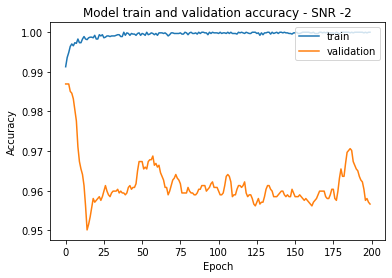

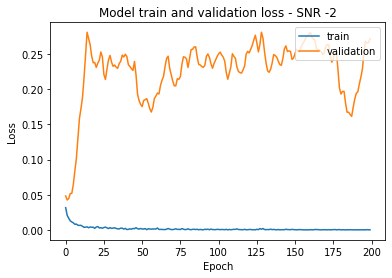


Training SNR = -2 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 257ms/step - loss: 0.2019 - accuracy: 0.9282 - val_loss: 0.1081 - val_accuracy: 0.9594
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1074 - accuracy: 0.9647 - val_loss: 0.1923 - val_accuracy: 0.9506
Epoch 3/200
7/7 [==============================] - 1s 156ms/step - loss: 0.0794 - accuracy: 0.9739 - val_loss: 0.3072 - val_accuracy: 0.9450
Epoch 4/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0626 - accuracy: 0.9790 - val_loss: 0.4039 - val_accuracy: 0.9408
Epoch 5/200
7/7 [==============================] - 1s 156ms/step - loss: 0.0515 - accuracy: 0.9841 - val_loss: 0.4632 - val_accuracy: 0.9408
Epoch 6/200
7/7 [==============================] - 1s 163ms/step - loss: 0.0437 - accuracy: 0.9874 - val_loss: 0.4946 - val_accuracy: 0.9399
Epoch 7/200
7/7 [==============================] - 1s 156ms/step - loss: 0.0377 - accuracy: 0.9880

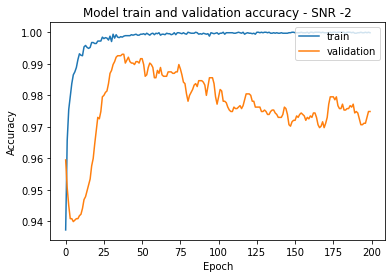

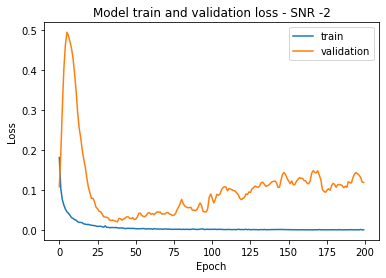

In [ ]:
for i in range(5, 10):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_data_fft_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)


Score of SNR on All SNR model without Transfer Learning 0 = 98.08858036994934
Score of SNR on High SNR model without Transfer Learning 0 = 98.92773628234863
Score of SNR on low SNR model without Transfer Learning 0 = 93.00699234008789

Training SNR = 0 Data

Epoch 1/200
7/7 [==============================] - 4s 227ms/step - loss: 1.7938 - accuracy: 0.4874 - val_loss: 0.4479 - val_accuracy: 0.8252
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.4966 - accuracy: 0.9143 - val_loss: 0.2962 - val_accuracy: 0.9324
Epoch 3/200
7/7 [==============================] - 1s 161ms/step - loss: 0.3521 - accuracy: 0.9597 - val_loss: 0.5175 - val_accuracy: 0.8704
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.2734 - accuracy: 0.9730 - val_loss: 0.8226 - val_accuracy: 0.7790
Epoch 5/200
7/7 [==============================] - 1s 161ms/step - loss: 0.2133 - accuracy: 0.9800 - val_loss: 1.1098 - val_accuracy: 0.7380
Epoch 6/200
7/7 [==================

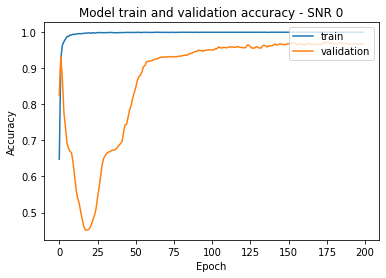

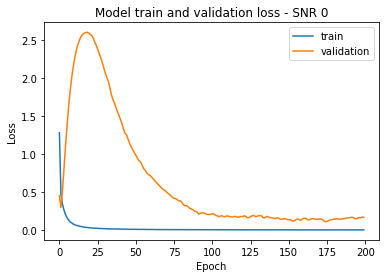


Score of SNR on All SNR model without Transfer Learning 2 = 98.60140085220337
Score of SNR on High SNR model without Transfer Learning 2 = 99.1142213344574
Score of SNR on low SNR model without Transfer Learning 2 = 92.12121367454529

Training SNR = 2 Data

Epoch 1/200
7/7 [==============================] - 3s 224ms/step - loss: 1.7489 - accuracy: 0.5082 - val_loss: 0.3607 - val_accuracy: 0.8760
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.4500 - accuracy: 0.9363 - val_loss: 0.2814 - val_accuracy: 0.9343
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.3140 - accuracy: 0.9706 - val_loss: 0.6079 - val_accuracy: 0.8103
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.2362 - accuracy: 0.9783 - val_loss: 1.0622 - val_accuracy: 0.7650
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1853 - accuracy: 0.9852 - val_loss: 1.4426 - val_accuracy: 0.7287
Epoch 6/200
7/7 [===================

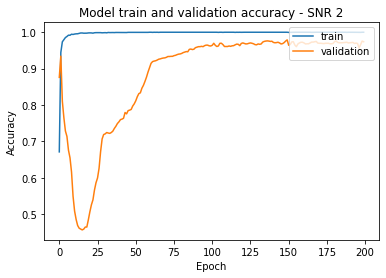

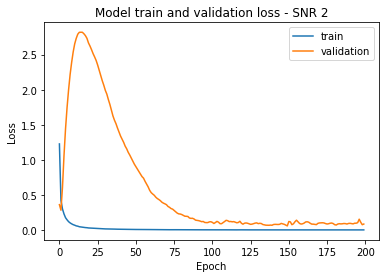


Score of SNR on All SNR model without Transfer Learning 4 = 98.4149158000946
Score of SNR on High SNR model without Transfer Learning 4 = 99.58041906356812
Score of SNR on low SNR model without Transfer Learning 4 = 91.98135137557983

Training SNR = 4 Data

Epoch 1/200
7/7 [==============================] - 3s 230ms/step - loss: 1.7463 - accuracy: 0.5086 - val_loss: 0.3630 - val_accuracy: 0.8765
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.4134 - accuracy: 0.9537 - val_loss: 0.2263 - val_accuracy: 0.9501
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2825 - accuracy: 0.9707 - val_loss: 0.5014 - val_accuracy: 0.8834
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2088 - accuracy: 0.9885 - val_loss: 0.8680 - val_accuracy: 0.7669
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1602 - accuracy: 0.9916 - val_loss: 1.1586 - val_accuracy: 0.7380
Epoch 6/200
7/7 [===================

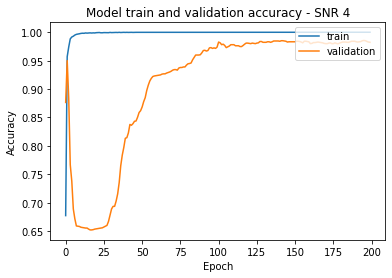

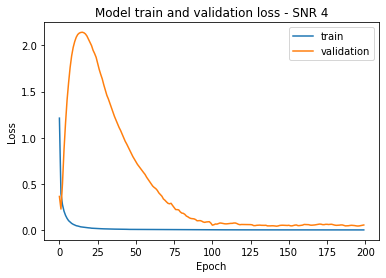


Score of SNR on All SNR model without Transfer Learning 6 = 98.4149158000946
Score of SNR on High SNR model without Transfer Learning 6 = 99.34731721878052
Score of SNR on low SNR model without Transfer Learning 6 = 91.4685308933258

Training SNR = 6 Data

Epoch 1/200
7/7 [==============================] - 3s 236ms/step - loss: 1.7268 - accuracy: 0.5205 - val_loss: 0.3441 - val_accuracy: 0.8364
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.3875 - accuracy: 0.9569 - val_loss: 0.1913 - val_accuracy: 0.9469
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2635 - accuracy: 0.9804 - val_loss: 0.4143 - val_accuracy: 0.9077
Epoch 4/200
7/7 [==============================] - 1s 154ms/step - loss: 0.1943 - accuracy: 0.9881 - val_loss: 0.7897 - val_accuracy: 0.7944
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.1509 - accuracy: 0.9917 - val_loss: 1.1032 - val_accuracy: 0.7580
Epoch 6/200
7/7 [====================

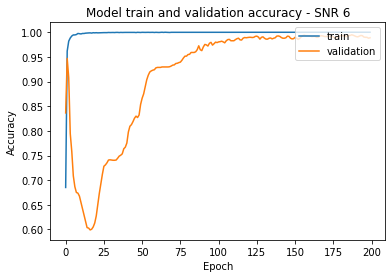

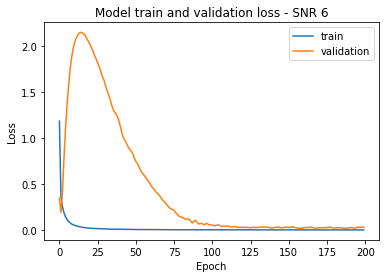


Score of SNR on All SNR model without Transfer Learning 8 = 98.69464039802551
Score of SNR on High SNR model without Transfer Learning 8 = 99.44055676460266
Score of SNR on low SNR model without Transfer Learning 8 = 91.00233316421509

Training SNR = 8 Data

Epoch 1/200
7/7 [==============================] - 3s 234ms/step - loss: 1.6609 - accuracy: 0.5305 - val_loss: 0.2679 - val_accuracy: 0.8872
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.3685 - accuracy: 0.9644 - val_loss: 0.1742 - val_accuracy: 0.9450
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.2499 - accuracy: 0.9773 - val_loss: 0.3178 - val_accuracy: 0.9669
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1832 - accuracy: 0.9891 - val_loss: 0.6468 - val_accuracy: 0.7981
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1449 - accuracy: 0.9916 - val_loss: 0.9506 - val_accuracy: 0.7254
Epoch 6/200
7/7 [==================

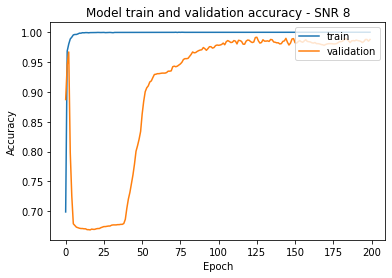

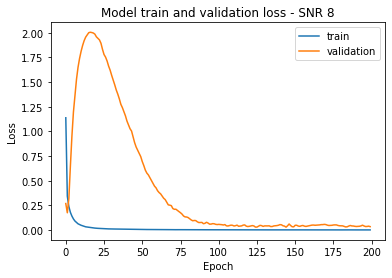

In [ ]:
for i in range(10, 15):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_data_fft_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)


Score of SNR on All SNR model without Transfer Learning 10 = 98.74125719070435
Score of SNR on High SNR model without Transfer Learning 10 = 99.62704181671143
Score of SNR on low SNR model without Transfer Learning 10 = 91.42191410064697

Training SNR = 10 Data

Epoch 1/200
7/7 [==============================] - 4s 233ms/step - loss: 1.6236 - accuracy: 0.5337 - val_loss: 0.3263 - val_accuracy: 0.8620
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.3720 - accuracy: 0.9626 - val_loss: 0.2305 - val_accuracy: 0.9333
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2513 - accuracy: 0.9817 - val_loss: 0.3733 - val_accuracy: 0.9450
Epoch 4/200
7/7 [==============================] - 1s 160ms/step - loss: 0.1821 - accuracy: 0.9889 - val_loss: 0.7042 - val_accuracy: 0.7841
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1400 - accuracy: 0.9923 - val_loss: 0.9662 - val_accuracy: 0.7548
Epoch 6/200
7/7 [==============

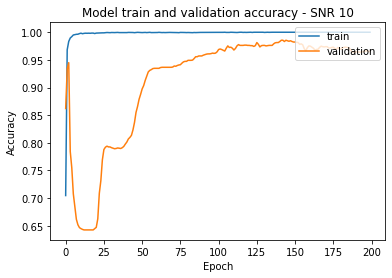

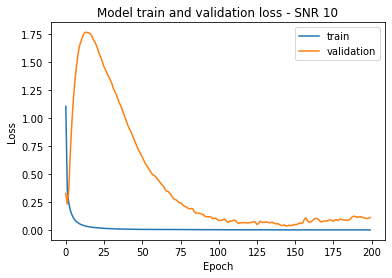


Score of SNR on All SNR model without Transfer Learning 12 = 98.92773628234863
Score of SNR on High SNR model without Transfer Learning 12 = 99.39393997192383
Score of SNR on low SNR model without Transfer Learning 12 = 90.44288992881775

Training SNR = 12 Data

Epoch 1/200
7/7 [==============================] - 4s 231ms/step - loss: 1.5584 - accuracy: 0.5678 - val_loss: 0.3407 - val_accuracy: 0.8354
Epoch 2/200
7/7 [==============================] - 1s 160ms/step - loss: 0.3651 - accuracy: 0.9483 - val_loss: 0.1893 - val_accuracy: 0.9524
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2522 - accuracy: 0.9713 - val_loss: 0.3392 - val_accuracy: 0.9650
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.1879 - accuracy: 0.9862 - val_loss: 0.7099 - val_accuracy: 0.7748
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1420 - accuracy: 0.9920 - val_loss: 1.0197 - val_accuracy: 0.7156
Epoch 6/200
7/7 [==============

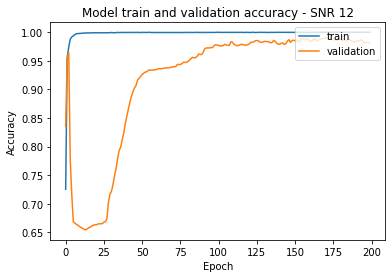

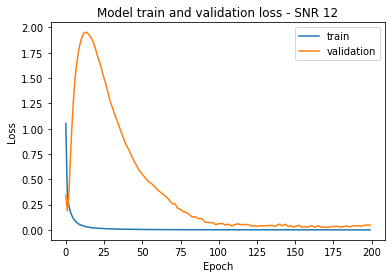


Score of SNR on All SNR model without Transfer Learning 14 = 99.44055676460266
Score of SNR on High SNR model without Transfer Learning 14 = 99.48717951774597
Score of SNR on low SNR model without Transfer Learning 14 = 91.60839319229126

Training SNR = 14 Data

Epoch 1/200
7/7 [==============================] - 3s 239ms/step - loss: 1.6115 - accuracy: 0.5721 - val_loss: 0.2905 - val_accuracy: 0.8779
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.3290 - accuracy: 0.9700 - val_loss: 0.1421 - val_accuracy: 0.9841
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2263 - accuracy: 0.9841 - val_loss: 0.2924 - val_accuracy: 0.9828
Epoch 4/200
7/7 [==============================] - 1s 161ms/step - loss: 0.1712 - accuracy: 0.9901 - val_loss: 0.6063 - val_accuracy: 0.8359
Epoch 5/200
7/7 [==============================] - 1s 215ms/step - loss: 0.1349 - accuracy: 0.9924 - val_loss: 0.8570 - val_accuracy: 0.7450
Epoch 6/200
7/7 [==============

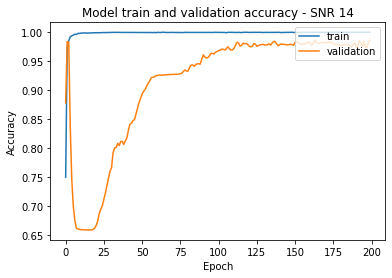

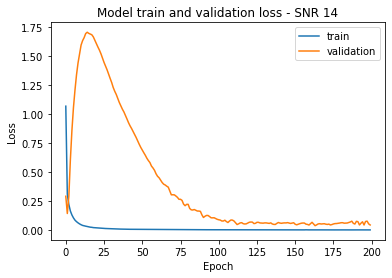


Score of SNR on All SNR model without Transfer Learning 16 = 98.97435903549194
Score of SNR on High SNR model without Transfer Learning 16 = 99.58041906356812
Score of SNR on low SNR model without Transfer Learning 16 = 92.02797412872314

Training SNR = 16 Data

Epoch 1/200
7/7 [==============================] - 4s 235ms/step - loss: 1.5981 - accuracy: 0.5539 - val_loss: 0.3630 - val_accuracy: 0.8312
Epoch 2/200
7/7 [==============================] - 1s 153ms/step - loss: 0.3295 - accuracy: 0.9586 - val_loss: 0.1863 - val_accuracy: 0.9226
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2272 - accuracy: 0.9818 - val_loss: 0.2633 - val_accuracy: 0.9893
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1697 - accuracy: 0.9924 - val_loss: 0.5654 - val_accuracy: 0.8653
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1324 - accuracy: 0.9933 - val_loss: 0.8681 - val_accuracy: 0.7431
Epoch 6/200
7/7 [==============

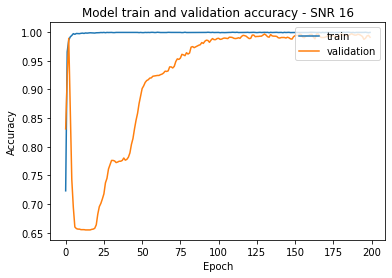

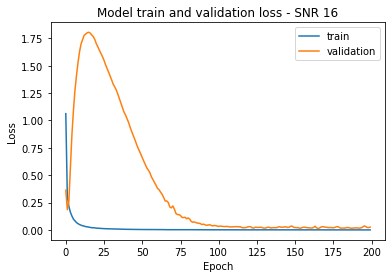


Score of SNR on All SNR model without Transfer Learning 18 = 99.34731721878052
Score of SNR on High SNR model without Transfer Learning 18 = 99.48717951774597
Score of SNR on low SNR model without Transfer Learning 18 = 90.86247086524963

Training SNR = 18 Data

Epoch 1/200
7/7 [==============================] - 3s 232ms/step - loss: 1.6274 - accuracy: 0.5609 - val_loss: 0.2110 - val_accuracy: 0.9068
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.3201 - accuracy: 0.9729 - val_loss: 0.1256 - val_accuracy: 0.9487
Epoch 3/200
7/7 [==============================] - 1s 162ms/step - loss: 0.2228 - accuracy: 0.9808 - val_loss: 0.1647 - val_accuracy: 0.9967
Epoch 4/200
7/7 [==============================] - 1s 162ms/step - loss: 0.1609 - accuracy: 0.9918 - val_loss: 0.4049 - val_accuracy: 0.9338
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1259 - accuracy: 0.9962 - val_loss: 0.6657 - val_accuracy: 0.7981
Epoch 6/200
7/7 [==============

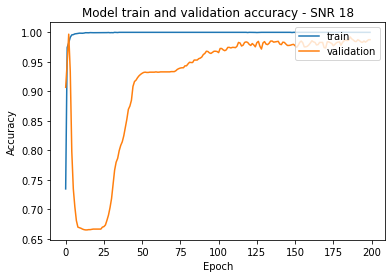

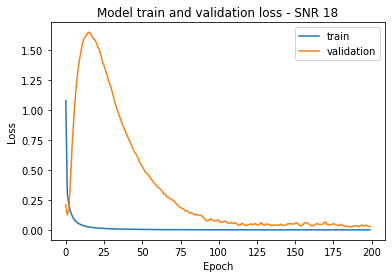


Score of SNR on All SNR model without Transfer Learning 20 = 99.1142213344574
Score of SNR on High SNR model without Transfer Learning 20 = 99.44055676460266
Score of SNR on low SNR model without Transfer Learning 20 = 91.28205180168152

Training SNR = 20 Data

Epoch 1/200
7/7 [==============================] - 3s 235ms/step - loss: 1.6192 - accuracy: 0.5413 - val_loss: 0.3159 - val_accuracy: 0.8429
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.3461 - accuracy: 0.9510 - val_loss: 0.1619 - val_accuracy: 0.9394
Epoch 3/200
7/7 [==============================] - 1s 158ms/step - loss: 0.2396 - accuracy: 0.9808 - val_loss: 0.2024 - val_accuracy: 0.9916
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.1737 - accuracy: 0.9900 - val_loss: 0.4164 - val_accuracy: 0.9403
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.1328 - accuracy: 0.9920 - val_loss: 0.6787 - val_accuracy: 0.7958
Epoch 6/200
7/7 [===============

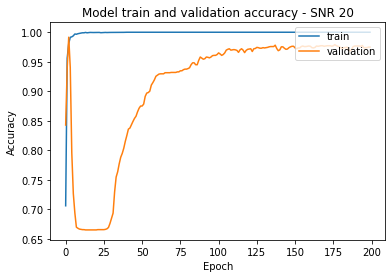

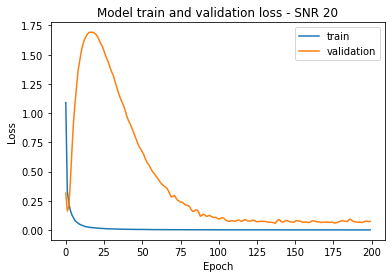

In [ ]:
for i in range(15, 21):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_data_fft_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)

# Signal-type Classification

## Whole data

In [ ]:
x_dim = x_data_fft_data.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]
print(num_snapshots_per_tech)

15015


In [ ]:
x_data_fft = np.reshape(x_data_fft_data, (total_num_snapshots, x_dim[3], x_dim[4]))

from sklearn.preprocessing import StandardScaler
scaler_std = StandardScaler()

fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft, (total_num_snapshots, num_samples*2)))
fft_data_2d = np.reshape(fft_data_flat, (total_num_snapshots, num_samples, 2))
fft_data_iq = fft_data_2d.reshape(-1, num_samples, 2, 1)

In [ ]:
y_labels_all = y_labels_data.flatten()

y_labels_one_hot_all = np.zeros(shape=(y_labels_all.shape[0],3))
for i in range(y_labels_all.shape[0]):
  if(0<=y_labels_all[i] and y_labels_all[i]<=9):
    y_labels_one_hot_all[i][0] = 1
  elif(10<=y_labels_all[i] and y_labels_all[i]<=12):
    y_labels_one_hot_all[i][1] = 1
  else:
    y_labels_one_hot_all[i][2] = 1

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test_valid, Y_train, Y_test_valid = train_test_split(fft_data_iq, y_labels_one_hot_all, test_size=0.4)
X_validation, X_test, Y_validation, Y_test = train_test_split(X_test_valid, Y_test_valid, test_size=0.5)

In [ ]:
from keras.callbacks import EarlyStopping
ES = EarlyStopping(monitor = 'val_accuracy', mode = 'max', min_delta = 0.00001, patience = 200, verbose = 1)

import logging
logging.disable(logging.WARNING)

Epoch 1/200
132/132 [==============================] - 71s 178ms/step - loss: 0.7258 - accuracy: 0.7045 - val_loss: 0.9653 - val_accuracy: 0.6375
Epoch 2/200
132/132 [==============================] - 22s 163ms/step - loss: 0.2541 - accuracy: 0.9110 - val_loss: 1.8117 - val_accuracy: 0.2424
Epoch 3/200
132/132 [==============================] - 22s 169ms/step - loss: 0.2129 - accuracy: 0.9202 - val_loss: 0.8684 - val_accuracy: 0.5969
Epoch 4/200
132/132 [==============================] - 23s 171ms/step - loss: 0.1959 - accuracy: 0.9244 - val_loss: 0.3011 - val_accuracy: 0.8965
Epoch 5/200
132/132 [==============================] - 22s 167ms/step - loss: 0.1900 - accuracy: 0.9258 - val_loss: 0.2300 - val_accuracy: 0.9057
Epoch 6/200
132/132 [==============================] - 22s 166ms/step - loss: 0.1802 - accuracy: 0.9298 - val_loss: 0.1928 - val_accuracy: 0.9241
Epoch 7/200
132/132 [==============================] - 22s 167ms/step - loss: 0.1763 - accuracy: 0.9314 - val_loss: 0.1887 -

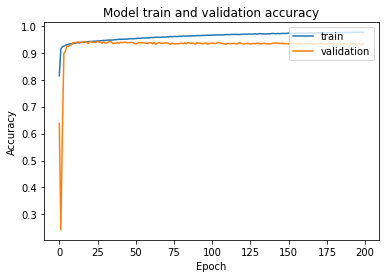

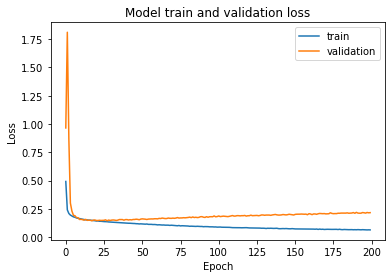


Training Accuracy Array:  [0.814748227596283, 0.9138491153717041, 0.9221815466880798, 0.9249047040939331, 0.9273689389228821, 0.9299367070198059, 0.9310319423675537, 0.9326081275939941, 0.9333259463310242, 0.9342509508132935, 0.9354941248893738, 0.9365967512130737, 0.9369075298309326, 0.9380767345428467, 0.9381285309791565, 0.9391497373580933, 0.9388463497161865, 0.9399193525314331, 0.940096914768219, 0.9411551356315613, 0.9419839382171631, 0.941591739654541, 0.9426129460334778, 0.9422873258590698, 0.9431531429290771, 0.9437821507453918, 0.9438043236732483, 0.9445221424102783, 0.9453879594802856, 0.945794939994812, 0.9455433487892151, 0.9461871385574341, 0.94708251953125, 0.9470381736755371, 0.9468901753425598, 0.9473637342453003, 0.9478965401649475, 0.9485033750534058, 0.9491693377494812, 0.9498575329780579, 0.9498501420021057, 0.9499093294143677, 0.9499315619468689, 0.9506493210792542, 0.9503533244132996, 0.9508639574050903, 0.952136754989624, 0.9518037438392639, 0.9518111348152161,

In [ ]:
cnn_learning = cnn2_model_signalType()

epochs = 200
batch_size = 1024

history = cnn_learning.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])

score = cnn_learning.evaluate(X_test, Y_test, verbose=0)
print('\nEvaluating on Test data : Score of SNR = ' + str(score[1]*100) +'\n')

summarize_model(history)
cnn_learning.save("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/cnnFFTdata_allSNR_signalType.tf")

print("\nTraining Accuracy Array: ", history.history['accuracy'])
print("\nValidation Accuracy Array: ", history.history['val_accuracy'])

## High SNR 

In [ ]:
x_data_fft_high_SNR = x_data_fft_data[:,10:21]
y_labels_high_SNR = y_labels_data[:,10:21]

print(x_data_fft_high_SNR.shape)
print(y_labels_high_SNR.shape)

(15, 11, 715, 128, 2)
(15, 11, 715)


In [ ]:
x_dim = x_data_fft_high_SNR.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]
print(num_snapshots_per_tech)

7865


In [ ]:
x_data_fft_high_SNR = np.reshape(x_data_fft_high_SNR, (total_num_snapshots, x_dim[3], x_dim[4]))

from sklearn.preprocessing import StandardScaler
scaler_std = StandardScaler()

fft_data_high_SNR_flat = scaler_std.fit_transform(np.reshape(x_data_fft_high_SNR, (total_num_snapshots, num_samples*2)))
fft_data_high_SNR_2d = np.reshape(fft_data_high_SNR_flat, (total_num_snapshots, num_samples, 2))
fft_data_high_SNR_iq = fft_data_high_SNR_2d.reshape(-1, num_samples, 2, 1)

In [ ]:
y_labels_high_SNR = y_labels_high_SNR.flatten()

y_labels_one_hot_high_SNR = np.zeros(shape=(y_labels_high_SNR.shape[0],3))
for i in range(y_labels_high_SNR.shape[0]):
  if(0<=y_labels_high_SNR[i] and y_labels_high_SNR[i]<=9):
    y_labels_one_hot_high_SNR[i][0] = 1
  elif(10<=y_labels_high_SNR[i] and y_labels_high_SNR[i]<=12):
    y_labels_one_hot_high_SNR[i][1] = 1
  else:
    y_labels_one_hot_high_SNR[i][2] = 1

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test_valid, Y_train, Y_test_valid = train_test_split(fft_data_high_SNR_iq, y_labels_one_hot_high_SNR, test_size=0.4)
X_validation, X_test, Y_validation, Y_test = train_test_split(X_test_valid, Y_test_valid, test_size=0.5)

In [ ]:
from keras.callbacks import EarlyStopping
ES = EarlyStopping(monitor = 'val_accuracy', mode = 'max', min_delta = 0.00001, patience = 200, verbose = 1)

import logging
logging.disable(logging.WARNING)

In [ ]:
cnn_learning_high_SNR = cnn2_model_signalType()

epochs = 200
batch_size = 1024

history = cnn_learning_high_SNR.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])

Epoch 1/200
70/70 [==============================] - 14s 175ms/step - loss: 0.3999 - accuracy: 0.8588 - val_loss: 1.2964 - val_accuracy: 0.6683
Epoch 2/200
70/70 [==============================] - 12s 167ms/step - loss: 0.0292 - accuracy: 0.9972 - val_loss: 0.8999 - val_accuracy: 0.6683
Epoch 3/200
70/70 [==============================] - 12s 167ms/step - loss: 0.0128 - accuracy: 0.9989 - val_loss: 0.6015 - val_accuracy: 0.6715
Epoch 4/200
70/70 [==============================] - 11s 164ms/step - loss: 0.0087 - accuracy: 0.9988 - val_loss: 0.4494 - val_accuracy: 0.7185
Epoch 5/200
70/70 [==============================] - 11s 162ms/step - loss: 0.0063 - accuracy: 0.9989 - val_loss: 0.2706 - val_accuracy: 0.8968
Epoch 6/200
70/70 [==============================] - 11s 162ms/step - loss: 0.0049 - accuracy: 0.9990 - val_loss: 0.0994 - val_accuracy: 0.9861
Epoch 7/200
70/70 [==============================] - 11s 162ms/step - loss: 0.0037 - accuracy: 0.9994 - val_loss: 0.0324 - val_accuracy:

TypeError: ignored


Evaluating on Test data : Score of SNR = 100.0



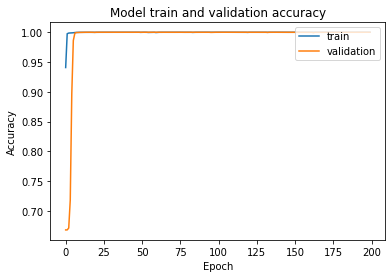

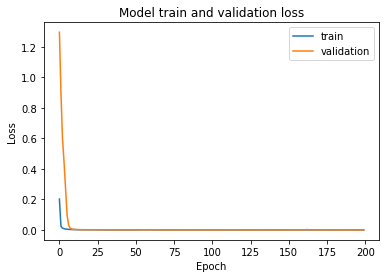


Training Accuracy Array:  [0.9407784342765808, 0.9975135922431946, 0.9986155033111572, 0.9987285733222961, 0.9990252256393433, 0.9991382360458374, 0.9995196461677551, 0.9996892213821411, 0.9998022317886353, 0.9998728632926941, 0.9998587369918823, 0.9999293684959412, 0.9999011158943176, 0.9999011158943176, 0.9999011158943176, 0.9998728632926941, 0.9998446106910706, 0.9999011158943176, 0.9999152421951294, 0.9999152421951294, 0.9998869895935059, 0.9999717473983765, 0.9999293684959412, 0.9999011158943176, 0.9998869895935059, 0.9999717473983765, 0.9999152421951294, 0.9999434947967529, 0.9999576210975647, 0.9999858736991882, 0.9999576210975647, 0.9999858736991882, 0.9999293684959412, 0.9999434947967529, 0.9999576210975647, 0.9999152421951294, 0.9999434947967529, 1.0, 1.0, 0.9999576210975647, 0.9999434947967529, 0.9999717473983765, 0.9998869895935059, 0.9999576210975647, 0.9999858736991882, 0.9999858736991882, 0.9999858736991882, 0.9999858736991882, 0.9999858736991882, 0.9998022317886353, 0.

In [ ]:
score = cnn_learning_high_SNR.evaluate(X_test, Y_test, verbose=0)
print('\nEvaluating on Test data : Score of SNR = ' + str(score[1]*100) +'\n')

summarize_model(history)
cnn_learning_high_SNR.save("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/cnnFFTdata_highSNR_signalType.tf")

print("\nTraining Accuracy Array: ", history.history['accuracy'])
print("\nValidation Accuracy Array: ", history.history['val_accuracy'])

## Low SNR

In [ ]:
x_data_fft_low_SNR = x_data_fft_data[:,0:10]
y_labels_low_SNR = y_labels_data[:,0:10]

print(x_data_fft_low_SNR.shape)
print(y_labels_low_SNR.shape)

(15, 10, 715, 128, 2)
(15, 10, 715)


In [ ]:
x_dim = x_data_fft_low_SNR.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]
print(num_snapshots_per_tech)

7150


In [ ]:
x_data_fft_low_SNR = np.reshape(x_data_fft_low_SNR, (total_num_snapshots, x_dim[3], x_dim[4]))

from sklearn.preprocessing import StandardScaler
scaler_std = StandardScaler()

fft_data_low_SNR_flat = scaler_std.fit_transform(np.reshape(x_data_fft_low_SNR, (total_num_snapshots, num_samples*2)))
fft_data_low_SNR_2d = np.reshape(fft_data_low_SNR_flat, (total_num_snapshots, num_samples, 2))
fft_data_low_SNR_iq = fft_data_low_SNR_2d.reshape(-1, num_samples, 2, 1)

from keras.utils.np_utils import to_categorical
y_labels_one_hot_low_SNR = to_categorical(y_labels_low_SNR)

In [ ]:
y_labels_low_SNR = y_labels_low_SNR.flatten()

y_labels_one_hot_low_SNR = np.zeros(shape=(y_labels_low_SNR.shape[0],3))
for i in range(y_labels_low_SNR.shape[0]):
  if(0<=y_labels_low_SNR[i] and y_labels_low_SNR[i]<=9):
    y_labels_one_hot_low_SNR[i][0] = 1
  elif(10<=y_labels_low_SNR[i] and y_labels_low_SNR[i]<=12):
    y_labels_one_hot_low_SNR[i][1] = 1
  else:
    y_labels_one_hot_low_SNR[i][2] = 1

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test_valid, Y_train, Y_test_valid = train_test_split(fft_data_low_SNR_iq, y_labels_one_hot_low_SNR, test_size=0.4)
X_validation, X_test, Y_validation, Y_test = train_test_split(X_test_valid, Y_test_valid, test_size=0.5)

In [ ]:
from keras.callbacks import EarlyStopping
ES = EarlyStopping(monitor = 'val_accuracy', mode = 'max', min_delta = 0.00001, patience = 200, verbose = 1)

import logging
logging.disable(logging.WARNING)

Epoch 1/200
63/63 [==============================] - 14s 199ms/step - loss: 1.1759 - accuracy: 0.4667 - val_loss: 0.9456 - val_accuracy: 0.5349
Epoch 2/200
63/63 [==============================] - 11s 169ms/step - loss: 0.6022 - accuracy: 0.7657 - val_loss: 1.2225 - val_accuracy: 0.2121
Epoch 3/200
63/63 [==============================] - 11s 168ms/step - loss: 0.4788 - accuracy: 0.8176 - val_loss: 1.9164 - val_accuracy: 0.2061
Epoch 4/200
63/63 [==============================] - 10s 165ms/step - loss: 0.4289 - accuracy: 0.8365 - val_loss: 2.4627 - val_accuracy: 0.2069
Epoch 5/200
63/63 [==============================] - 10s 164ms/step - loss: 0.3954 - accuracy: 0.8473 - val_loss: 1.7716 - val_accuracy: 0.2374
Epoch 6/200
63/63 [==============================] - 10s 163ms/step - loss: 0.3801 - accuracy: 0.8496 - val_loss: 1.6307 - val_accuracy: 0.3029
Epoch 7/200
63/63 [==============================] - 10s 163ms/step - loss: 0.3611 - accuracy: 0.8588 - val_loss: 1.4022 - val_accuracy:

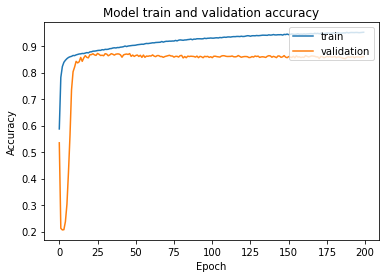

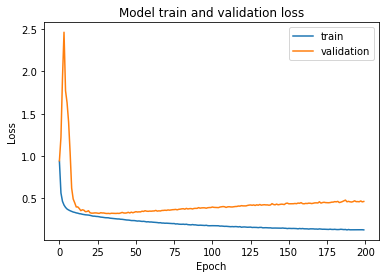


Training Accuracy Array:  [0.5872572064399719, 0.7819580435752869, 0.8225796222686768, 0.838725745677948, 0.8465579152107239, 0.8525718450546265, 0.8569852113723755, 0.8596581220626831, 0.8612897992134094, 0.8645066022872925, 0.8640403747558594, 0.8667754530906677, 0.868267297744751, 0.8701786994934082, 0.870707094669342, 0.8721678256988525, 0.8717793226242065, 0.8737995624542236, 0.8754156827926636, 0.8743434548377991, 0.8780419826507568, 0.8784459829330444, 0.880730390548706, 0.8809790015220642, 0.8818337321281433, 0.8832322955131531, 0.8839938044548035, 0.883869469165802, 0.8863869309425354, 0.8855788707733154, 0.8876923322677612, 0.887365996837616, 0.8881118893623352, 0.8902875185012817, 0.8907226324081421, 0.8926650881767273, 0.8936130404472351, 0.8928671479225159, 0.8945143818855286, 0.8942968249320984, 0.8959596157073975, 0.8964723944664001, 0.897808849811554, 0.9001554250717163, 0.8982439637184143, 0.9001864790916443, 0.9011188745498657, 0.9024708867073059, 0.9025641083717346,

In [ ]:
cnn_learning_low_SNR = cnn2_model_signalType()

epochs = 200
batch_size = 1024

history = cnn_learning_low_SNR.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])

score = cnn_learning_low_SNR.evaluate(X_test, Y_test, verbose=0)
print('\nEvaluating on Test data : Score of SNR = ' + str(score[1]*100) +'\n')

summarize_model(history)
cnn_learning_low_SNR.save("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/cnnFFTdata_lowSNR_signalType.tf")

print("\nTraining Accuracy Array: ", history.history['accuracy'])
print("\nValidation Accuracy Array: ", history.history['val_accuracy'])

## Training each SNR separately and transfer learning 

In [ ]:
x_dim = x_data_fft_data.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]
print(num_snapshots_per_tech)

In [ ]:
from sklearn.model_selection import train_test_split
from keras import models
from keras.utils.np_utils import to_categorical
import math

X_train_curr = np.zeros((math.floor(0.6*total_num_snapshots/21), num_samples, 2))
X_validation_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_samples, 2))
X_test_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_samples, 2))
Y_train_curr = np.zeros((math.floor(0.6*total_num_snapshots/21), num_tech))
Y_validation_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_tech))
Y_test_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_tech))

X_test_valid_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_samples, 2))
Y_test_valid_curr = np.zeros((math.ceil(0.2*total_num_snapshots/21), num_tech))

In [ ]:
print('X_train_curr.shape = ' + str(X_train_curr.shape))
print('X_validation_curr.shape = ' + str(X_validation_curr.shape))
print('X_test_curr.shape = ' + str(X_test_curr.shape))
print('Y_train_curr.shape = ' + str(Y_train_curr.shape))
print('Y_validation_curr.shape = ' + str(Y_validation_curr.shape))
print('Y_test_curr.shape = ' + str(Y_test_curr.shape))

In [ ]:
from matplotlib import pyplot

def summarize_model(history, i):

  pyplot.plot(history.history['accuracy'])
  pyplot.plot(history.history['val_accuracy']) 
  pyplot.title('Model train and validation accuracy - SNR ' + str(2*i-20))
  pyplot.ylabel('Accuracy')
  pyplot.xlabel('Epoch')
  pyplot.legend(['train', 'validation'], loc='upper right')
  pyplot.show()

  pyplot.plot(history.history['loss'])
  pyplot.plot(history.history['val_loss'])  
  pyplot.title('Model train and validation loss - SNR ' + str(2*i-20))
  pyplot.ylabel('Loss')
  pyplot.xlabel('Epoch')
  pyplot.legend(['train', 'validation'], loc='upper right')
  pyplot.show()

In [ ]:
from keras.callbacks import EarlyStopping
ES = EarlyStopping(monitor = 'val_accuracy', mode = 'max', min_delta = 0.001, patience = 60, verbose = 1)

import logging
logging.disable(logging.WARNING)

from sklearn.preprocessing import StandardScaler
scaler_std = StandardScaler()

In [ ]:
def Testing(X_test_curr, Y_test_curr, i):
  
  all_snr_model = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/cnnFFTdata_allSNR_signalType.tf"))

  score = all_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nScore of SNR on All SNR model without Transfer Learning ' + str(2*i-20) + ' = ' + str(score[1]*100))

  high_snr_model = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/cnnFFTdata_highSNR_signalType.tf"))

  score = high_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('Score of SNR on High SNR model without Transfer Learning ' + str(2*i-20) + ' = ' + str(score[1]*100))

  low_snr_model = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/cnnFFTdata_lowSNR_signalType.tf"))

  score = low_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('Score of SNR on low SNR model without Transfer Learning ' + str(2*i-20) + ' = ' + str(score[1]*100))

In [ ]:
def train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i):
  
  print("\nTraining SNR = "+str(2*i-20)+" Data\n")

  lstm_model_cur = cnn2_model_signalType()
  history = lstm_model_cur.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024)

  score = lstm_model_cur.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')

  summarize_model(history, i)
  lstm_model_cur.save("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/SNR separately/cnnFFTdata_SNR_"+str(2*i-20)+"_signalType.tf")
  del history, lstm_model_cur

In [ ]:
def train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i):
  
  print("\nTraining SNR = "+str(2*i-20)+" Data on a pre-trained All SNR model\n")

  lstm_model_cur = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/cnnFFTdata_allSNR_signalType.tf"))
  lstm_model_cur.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  history = lstm_model_cur.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024, callbacks=[ES])

  score = lstm_model_cur.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')

  summarize_model(history, i)
  lstm_model_cur.save("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/Transfer Learning/cnnFFTdata_allSNR_to_SNR_"+str(2*i-20)+"_signalType.tf")
  del history, lstm_model_cur

In [ ]:
def train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i):
  
  print("\nTraining SNR = "+str(2*i-20)+" Data on a pre-trained High SNR model\n")

  lstm_model_cur = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/cnnFFTdata_highSNR_signalType.tf"))
  lstm_model_cur.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  history = lstm_model_cur.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024, callbacks=[ES])

  score = lstm_model_cur.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')

  summarize_model(history, i)
  lstm_model_cur.save("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/Transfer Learning/cnnFFTdata_highSNR_to_SNR_"+str(2*i-20)+"_signalType.tf")
  del history, lstm_model_cur

In [ ]:
def train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i):
  
  print("\nTraining SNR = "+str(2*i-20)+" Data on a pre-trained Low SNR model\n")

  lstm_model_cur = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/cnnFFTdata_lowSNR_signalType.tf"))
  lstm_model_cur.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  history = lstm_model_cur.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024, callbacks=[ES])

  score = lstm_model_cur.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')

  summarize_model(history, i)
  lstm_model_cur.save("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/Transfer Learning/cnnFFTdata_lowSNR_to_SNR_"+str(2*i-20)+"_signalType.tf")
  del history, lstm_model_cur


Score of SNR on All SNR model without Transfer Learning -20 = 29.044288396835327
Score of SNR on High SNR model without Transfer Learning -20 = 19.160838425159454
Score of SNR on low SNR model without Transfer Learning -20 = 53.379952907562256

Training SNR = -20 Data

Epoch 1/200
7/7 [==============================] - 8s 293ms/step - loss: 1.0791 - accuracy: 0.5158 - val_loss: 0.9754 - val_accuracy: 0.6536
Epoch 2/200
7/7 [==============================] - 1s 144ms/step - loss: 0.9608 - accuracy: 0.5868 - val_loss: 0.9639 - val_accuracy: 0.6615
Epoch 3/200
7/7 [==============================] - 1s 142ms/step - loss: 0.9102 - accuracy: 0.6306 - val_loss: 0.9680 - val_accuracy: 0.6662
Epoch 4/200
7/7 [==============================] - 1s 142ms/step - loss: 0.8796 - accuracy: 0.6570 - val_loss: 0.9639 - val_accuracy: 0.6671
Epoch 5/200
7/7 [==============================] - 1s 144ms/step - loss: 0.8489 - accuracy: 0.6701 - val_loss: 0.9605 - val_accuracy: 0.6671
Epoch 6/200
7/7 [=======

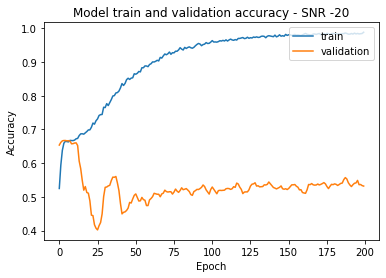

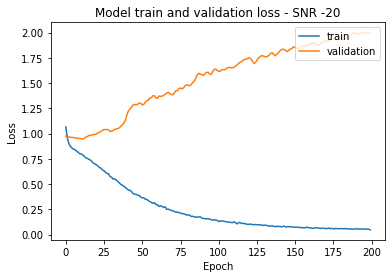


Training SNR = -20 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 238ms/step - loss: 2.5960 - accuracy: 0.6601 - val_loss: 4.0225 - val_accuracy: 0.2536
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 2.2302 - accuracy: 0.6748 - val_loss: 4.6393 - val_accuracy: 0.2424
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 2.1485 - accuracy: 0.6777 - val_loss: 5.0356 - val_accuracy: 0.2364
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 1.7340 - accuracy: 0.6911 - val_loss: 5.2537 - val_accuracy: 0.2340
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 1.5842 - accuracy: 0.6985 - val_loss: 5.4136 - val_accuracy: 0.2317
Epoch 6/200
7/7 [==============================] - 1s 150ms/step - loss: 1.4533 - accuracy: 0.7191 - val_loss: 5.4946 - val_accuracy: 0.2345
Epoch 7/200
7/7 [==============================] - 1s 157ms/step - loss: 1.2955 - accuracy: 0.728

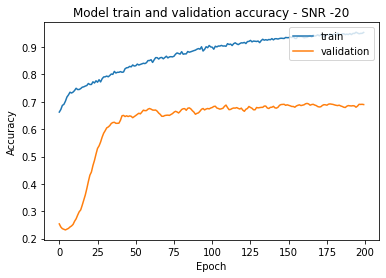

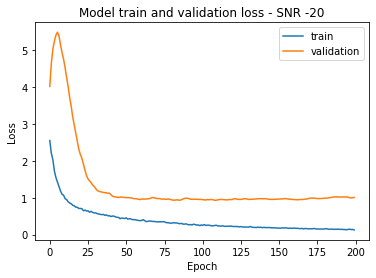


Training SNR = -20 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 240ms/step - loss: 7.8061 - accuracy: 0.5939 - val_loss: 13.6543 - val_accuracy: 0.1935
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 6.8755 - accuracy: 0.6227 - val_loss: 12.1068 - val_accuracy: 0.1935
Epoch 3/200
7/7 [==============================] - 1s 159ms/step - loss: 6.5630 - accuracy: 0.6293 - val_loss: 10.8163 - val_accuracy: 0.1949
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 6.0019 - accuracy: 0.6424 - val_loss: 9.8782 - val_accuracy: 0.1963
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 5.7993 - accuracy: 0.6453 - val_loss: 9.3591 - val_accuracy: 0.1981
Epoch 6/200
7/7 [==============================] - 1s 150ms/step - loss: 5.4283 - accuracy: 0.6412 - val_loss: 8.9378 - val_accuracy: 0.2009
Epoch 7/200
7/7 [==============================] - 1s 164ms/step - loss: 5.0646 - accuracy: 0

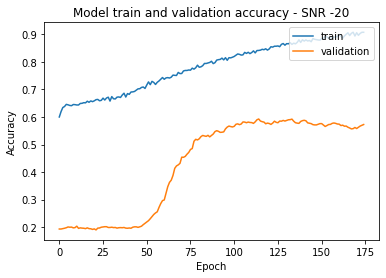

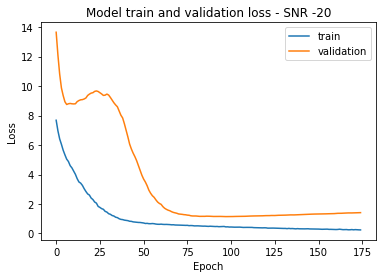


Training SNR = -20 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 235ms/step - loss: 1.7512 - accuracy: 0.6777 - val_loss: 1.4351 - val_accuracy: 0.5273
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 1.4189 - accuracy: 0.6979 - val_loss: 1.4538 - val_accuracy: 0.5235
Epoch 3/200
7/7 [==============================] - 1s 159ms/step - loss: 1.2741 - accuracy: 0.7107 - val_loss: 1.4393 - val_accuracy: 0.5240
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 1.1407 - accuracy: 0.7292 - val_loss: 1.3459 - val_accuracy: 0.5403
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 1.0410 - accuracy: 0.7380 - val_loss: 1.2040 - val_accuracy: 0.5786
Epoch 6/200
7/7 [==============================] - 1s 161ms/step - loss: 0.9281 - accuracy: 0.7421 - val_loss: 1.0504 - val_accuracy: 0.6121
Epoch 7/200
7/7 [==============================] - 1s 152ms/step - loss: 0.8862 - accuracy: 0.750

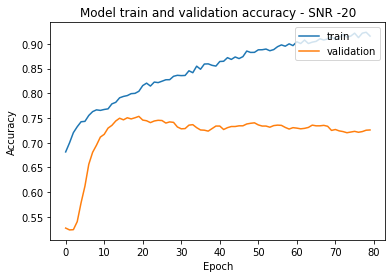

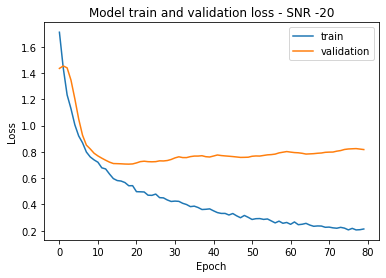


Score of SNR on All SNR model without Transfer Learning -18 = 38.92773985862732
Score of SNR on High SNR model without Transfer Learning -18 = 20.652680099010468
Score of SNR on low SNR model without Transfer Learning -18 = 67.27272868156433

Training SNR = -18 Data

Epoch 1/200
7/7 [==============================] - 3s 235ms/step - loss: 1.2965 - accuracy: 0.3566 - val_loss: 1.0159 - val_accuracy: 0.6112
Epoch 2/200
7/7 [==============================] - 1s 155ms/step - loss: 1.1072 - accuracy: 0.4385 - val_loss: 1.0099 - val_accuracy: 0.6224
Epoch 3/200
7/7 [==============================] - 1s 156ms/step - loss: 0.9737 - accuracy: 0.5157 - val_loss: 1.0198 - val_accuracy: 0.6284
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.9055 - accuracy: 0.6057 - val_loss: 1.0182 - val_accuracy: 0.6331
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.8580 - accuracy: 0.6510 - val_loss: 1.0063 - val_accuracy: 0.6499
Epoch 6/200
7/7 [=========

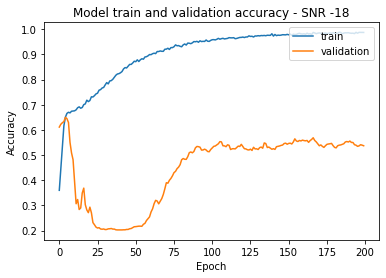

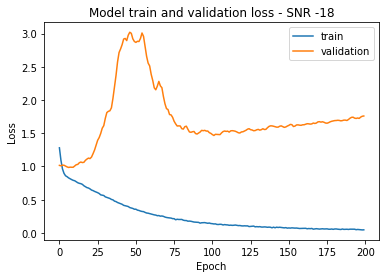


Training SNR = -18 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 228ms/step - loss: 2.0300 - accuracy: 0.6932 - val_loss: 2.9176 - val_accuracy: 0.3543
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 1.7512 - accuracy: 0.7043 - val_loss: 3.4496 - val_accuracy: 0.3282
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 1.4764 - accuracy: 0.7273 - val_loss: 3.8125 - val_accuracy: 0.3179
Epoch 4/200
7/7 [==============================] - 1s 167ms/step - loss: 1.3023 - accuracy: 0.7372 - val_loss: 4.0805 - val_accuracy: 0.3147
Epoch 5/200
7/7 [==============================] - 1s 154ms/step - loss: 1.1970 - accuracy: 0.7435 - val_loss: 4.2326 - val_accuracy: 0.3152
Epoch 6/200
7/7 [==============================] - 1s 153ms/step - loss: 1.1502 - accuracy: 0.7423 - val_loss: 4.2364 - val_accuracy: 0.3198
Epoch 7/200
7/7 [==============================] - 1s 148ms/step - loss: 1.0287 - accuracy: 0.742

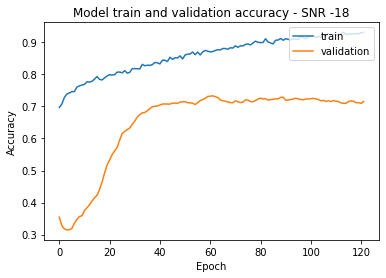

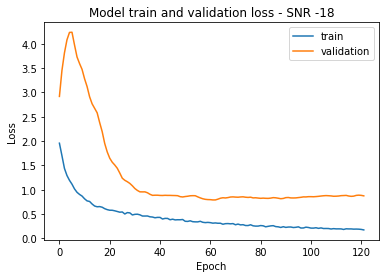


Training SNR = -18 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 230ms/step - loss: 6.9252 - accuracy: 0.6194 - val_loss: 12.3150 - val_accuracy: 0.2033
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 6.1612 - accuracy: 0.6368 - val_loss: 10.4696 - val_accuracy: 0.2075
Epoch 3/200
7/7 [==============================] - 1s 159ms/step - loss: 5.6711 - accuracy: 0.6457 - val_loss: 9.1360 - val_accuracy: 0.2107
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 5.1016 - accuracy: 0.6597 - val_loss: 8.2521 - val_accuracy: 0.2145
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 4.8792 - accuracy: 0.6574 - val_loss: 7.7256 - val_accuracy: 0.2200
Epoch 6/200
7/7 [==============================] - 1s 150ms/step - loss: 4.6671 - accuracy: 0.6460 - val_loss: 7.4237 - val_accuracy: 0.2191
Epoch 7/200
7/7 [==============================] - 1s 171ms/step - loss: 4.2948 - accuracy: 0.

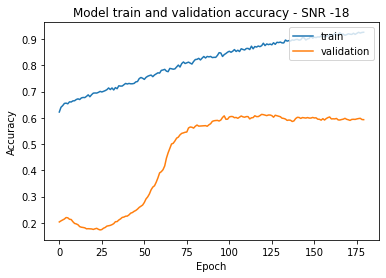

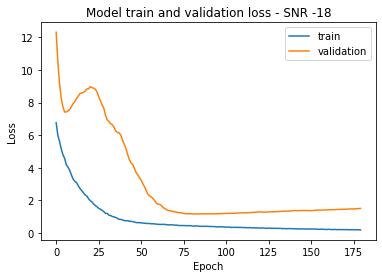


Training SNR = -18 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 241ms/step - loss: 1.2573 - accuracy: 0.7300 - val_loss: 1.0406 - val_accuracy: 0.6471
Epoch 2/200
7/7 [==============================] - 1s 159ms/step - loss: 1.0814 - accuracy: 0.7496 - val_loss: 1.1308 - val_accuracy: 0.6242
Epoch 3/200
7/7 [==============================] - 1s 162ms/step - loss: 0.9669 - accuracy: 0.7569 - val_loss: 1.0968 - val_accuracy: 0.6368
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.8387 - accuracy: 0.7662 - val_loss: 1.0431 - val_accuracy: 0.6527
Epoch 5/200
7/7 [==============================] - 1s 155ms/step - loss: 0.7919 - accuracy: 0.7751 - val_loss: 0.9524 - val_accuracy: 0.6718
Epoch 6/200
7/7 [==============================] - 1s 155ms/step - loss: 0.7335 - accuracy: 0.7806 - val_loss: 0.8661 - val_accuracy: 0.6895
Epoch 7/200
7/7 [==============================] - 1s 155ms/step - loss: 0.6814 - accuracy: 0.785

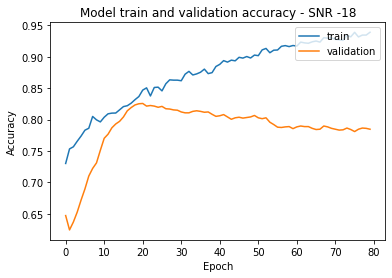

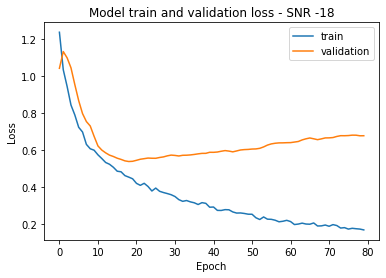


Score of SNR on All SNR model without Transfer Learning -16 = 58.32167863845825
Score of SNR on High SNR model without Transfer Learning -16 = 19.533799588680267
Score of SNR on low SNR model without Transfer Learning -16 = 82.37762451171875

Training SNR = -16 Data

Epoch 1/200
7/7 [==============================] - 3s 228ms/step - loss: 1.3198 - accuracy: 0.3473 - val_loss: 0.9821 - val_accuracy: 0.6443
Epoch 2/200
7/7 [==============================] - 1s 155ms/step - loss: 1.0816 - accuracy: 0.4690 - val_loss: 0.9756 - val_accuracy: 0.6387
Epoch 3/200
7/7 [==============================] - 1s 154ms/step - loss: 0.9435 - accuracy: 0.5488 - val_loss: 0.9853 - val_accuracy: 0.6527
Epoch 4/200
7/7 [==============================] - 1s 159ms/step - loss: 0.8878 - accuracy: 0.6122 - val_loss: 1.0038 - val_accuracy: 0.5897
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.8417 - accuracy: 0.6374 - val_loss: 1.0233 - val_accuracy: 0.3455
Epoch 6/200
7/7 [=========

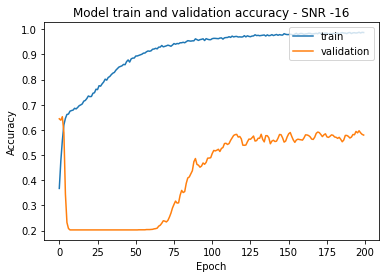

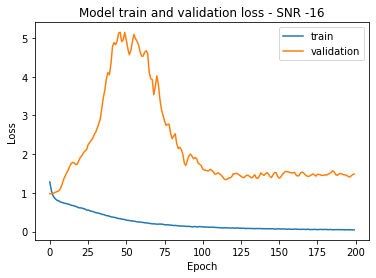


Training SNR = -16 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 230ms/step - loss: 1.3569 - accuracy: 0.7384 - val_loss: 1.5379 - val_accuracy: 0.5706
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.9860 - accuracy: 0.7760 - val_loss: 1.6163 - val_accuracy: 0.5734
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.8792 - accuracy: 0.7853 - val_loss: 1.7116 - val_accuracy: 0.5720
Epoch 4/200
7/7 [==============================] - 1s 160ms/step - loss: 0.7778 - accuracy: 0.8040 - val_loss: 1.7656 - val_accuracy: 0.5702
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.6940 - accuracy: 0.8238 - val_loss: 1.7618 - val_accuracy: 0.5748
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 0.6890 - accuracy: 0.8083 - val_loss: 1.7419 - val_accuracy: 0.5846
Epoch 7/200
7/7 [==============================] - 1s 156ms/step - loss: 0.6489 - accuracy: 0.813

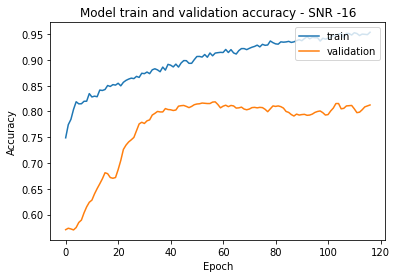

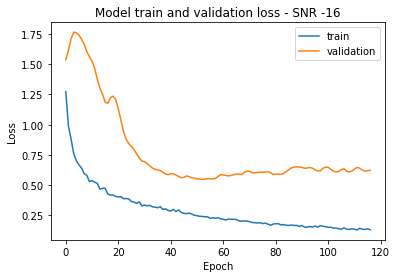


Training SNR = -16 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 238ms/step - loss: 5.5041 - accuracy: 0.6504 - val_loss: 10.7654 - val_accuracy: 0.2056
Epoch 2/200
7/7 [==============================] - 1s 154ms/step - loss: 4.7165 - accuracy: 0.6642 - val_loss: 8.6068 - val_accuracy: 0.2168
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 4.1466 - accuracy: 0.6797 - val_loss: 7.3513 - val_accuracy: 0.2312
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 3.8321 - accuracy: 0.6798 - val_loss: 6.7906 - val_accuracy: 0.2401
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 3.3442 - accuracy: 0.6942 - val_loss: 6.6417 - val_accuracy: 0.2424
Epoch 6/200
7/7 [==============================] - 1s 152ms/step - loss: 3.2542 - accuracy: 0.6936 - val_loss: 6.8017 - val_accuracy: 0.2345
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 2.9192 - accuracy: 0.6

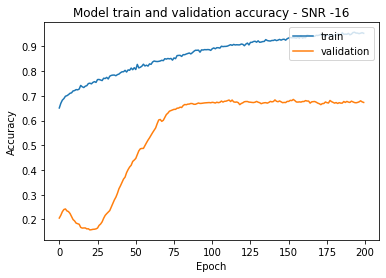

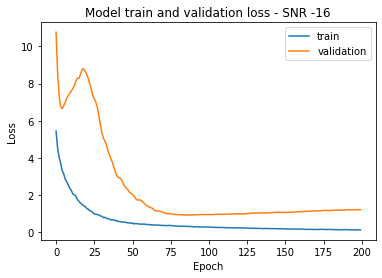


Training SNR = -16 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 229ms/step - loss: 0.8293 - accuracy: 0.7881 - val_loss: 0.5174 - val_accuracy: 0.8182
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.6981 - accuracy: 0.8082 - val_loss: 0.5240 - val_accuracy: 0.8177
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.5766 - accuracy: 0.8208 - val_loss: 0.5517 - val_accuracy: 0.8075
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 0.5424 - accuracy: 0.8321 - val_loss: 0.5334 - val_accuracy: 0.8163
Epoch 5/200
7/7 [==============================] - 1s 147ms/step - loss: 0.4944 - accuracy: 0.8381 - val_loss: 0.5108 - val_accuracy: 0.8280
Epoch 6/200
7/7 [==============================] - 1s 159ms/step - loss: 0.4964 - accuracy: 0.8344 - val_loss: 0.4870 - val_accuracy: 0.8373
Epoch 7/200
7/7 [==============================] - 1s 158ms/step - loss: 0.4746 - accuracy: 0.833

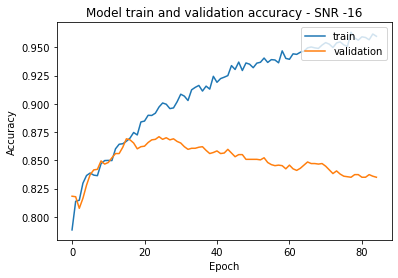

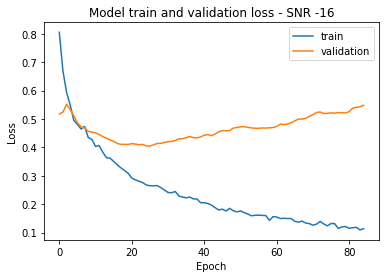


Score of SNR on All SNR model without Transfer Learning -14 = 80.83916306495667
Score of SNR on High SNR model without Transfer Learning -14 = 19.62703913450241
Score of SNR on low SNR model without Transfer Learning -14 = 93.56643557548523

Training SNR = -14 Data

Epoch 1/200
7/7 [==============================] - 3s 237ms/step - loss: 1.5362 - accuracy: 0.2826 - val_loss: 0.9890 - val_accuracy: 0.6196
Epoch 2/200
7/7 [==============================] - 1s 155ms/step - loss: 1.2145 - accuracy: 0.3943 - val_loss: 0.9598 - val_accuracy: 0.6457
Epoch 3/200
7/7 [==============================] - 1s 153ms/step - loss: 1.0509 - accuracy: 0.4734 - val_loss: 0.9608 - val_accuracy: 0.6634
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 0.9323 - accuracy: 0.5461 - val_loss: 0.9701 - val_accuracy: 0.5855
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.8501 - accuracy: 0.6104 - val_loss: 0.9785 - val_accuracy: 0.3781
Epoch 6/200
7/7 [==========

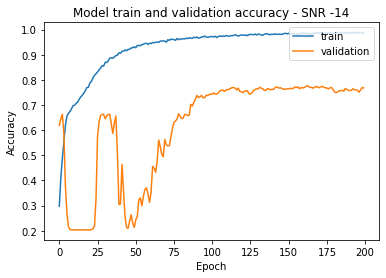

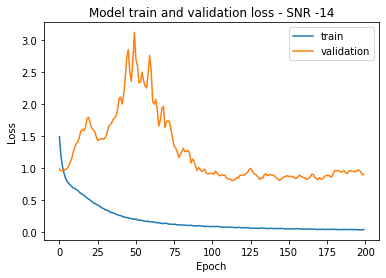


Training SNR = -14 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 242ms/step - loss: 0.6672 - accuracy: 0.8198 - val_loss: 0.5359 - val_accuracy: 0.8177
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 0.4789 - accuracy: 0.8597 - val_loss: 0.5162 - val_accuracy: 0.8345
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.4051 - accuracy: 0.8763 - val_loss: 0.4781 - val_accuracy: 0.8457
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.3902 - accuracy: 0.8821 - val_loss: 0.4440 - val_accuracy: 0.8583
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.3618 - accuracy: 0.8878 - val_loss: 0.4068 - val_accuracy: 0.8681
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 0.3506 - accuracy: 0.8862 - val_loss: 0.3740 - val_accuracy: 0.8788
Epoch 7/200
7/7 [==============================] - 1s 155ms/step - loss: 0.3242 - accuracy: 0.889

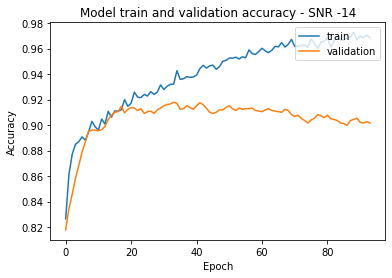

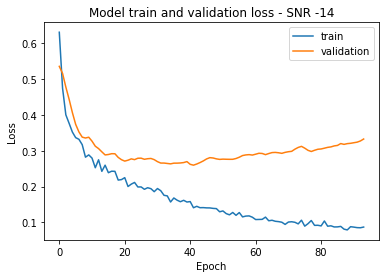


Training SNR = -14 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 4s 238ms/step - loss: 3.8116 - accuracy: 0.6997 - val_loss: 8.8517 - val_accuracy: 0.2168
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 2.8332 - accuracy: 0.7364 - val_loss: 6.2876 - val_accuracy: 0.2667
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 2.4967 - accuracy: 0.7453 - val_loss: 4.9728 - val_accuracy: 0.3091
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 2.2213 - accuracy: 0.7584 - val_loss: 4.3037 - val_accuracy: 0.3315
Epoch 5/200
7/7 [==============================] - 1s 147ms/step - loss: 1.9665 - accuracy: 0.7700 - val_loss: 4.0148 - val_accuracy: 0.3357
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 1.7878 - accuracy: 0.7729 - val_loss: 3.8670 - val_accuracy: 0.3347
Epoch 7/200
7/7 [==============================] - 1s 156ms/step - loss: 1.6389 - accuracy: 0.79

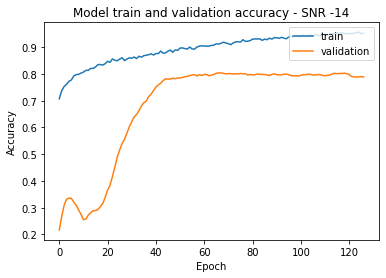

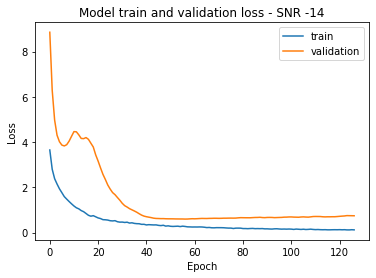


Training SNR = -14 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 228ms/step - loss: 0.4533 - accuracy: 0.8538 - val_loss: 0.2291 - val_accuracy: 0.9249
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.3301 - accuracy: 0.8866 - val_loss: 0.2755 - val_accuracy: 0.9086
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.3294 - accuracy: 0.8892 - val_loss: 0.3303 - val_accuracy: 0.8867
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.2973 - accuracy: 0.8941 - val_loss: 0.3764 - val_accuracy: 0.8685
Epoch 5/200
7/7 [==============================] - 1s 161ms/step - loss: 0.2730 - accuracy: 0.9021 - val_loss: 0.4262 - val_accuracy: 0.8555
Epoch 6/200
7/7 [==============================] - 1s 155ms/step - loss: 0.2739 - accuracy: 0.8966 - val_loss: 0.4465 - val_accuracy: 0.8531
Epoch 7/200
7/7 [==============================] - 1s 157ms/step - loss: 0.2593 - accuracy: 0.902

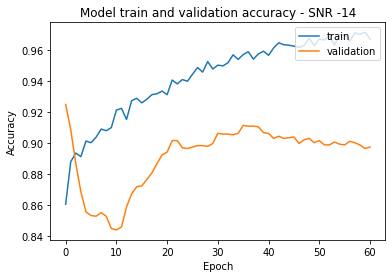

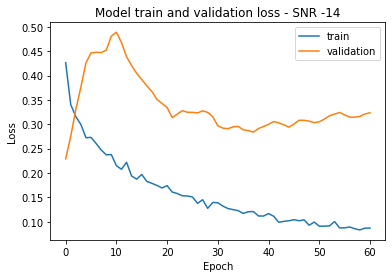


Score of SNR on All SNR model without Transfer Learning -12 = 96.68997526168823
Score of SNR on High SNR model without Transfer Learning -12 = 22.191141545772552
Score of SNR on low SNR model without Transfer Learning -12 = 95.85081338882446

Training SNR = -12 Data

Epoch 1/200
7/7 [==============================] - 4s 291ms/step - loss: 1.2105 - accuracy: 0.4315 - val_loss: 1.0015 - val_accuracy: 0.5529
Epoch 2/200
7/7 [==============================] - 1s 155ms/step - loss: 0.9360 - accuracy: 0.5703 - val_loss: 0.9567 - val_accuracy: 0.6275
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.8365 - accuracy: 0.6429 - val_loss: 0.9122 - val_accuracy: 0.6974
Epoch 4/200
7/7 [==============================] - 1s 158ms/step - loss: 0.7606 - accuracy: 0.6743 - val_loss: 0.8986 - val_accuracy: 0.6704
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.7089 - accuracy: 0.7013 - val_loss: 0.9057 - val_accuracy: 0.5357
Epoch 6/200
7/7 [=========

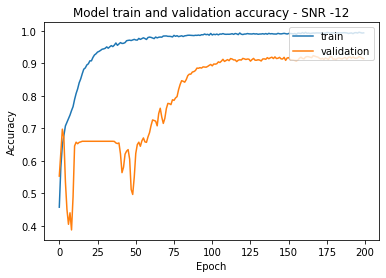

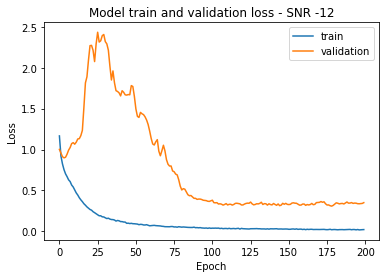


Training SNR = -12 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 233ms/step - loss: 0.2972 - accuracy: 0.9058 - val_loss: 0.1310 - val_accuracy: 0.9566
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.2143 - accuracy: 0.9344 - val_loss: 0.1436 - val_accuracy: 0.9497
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.1797 - accuracy: 0.9391 - val_loss: 0.1513 - val_accuracy: 0.9483
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1761 - accuracy: 0.9403 - val_loss: 0.1545 - val_accuracy: 0.9455
Epoch 5/200
7/7 [==============================] - 1s 147ms/step - loss: 0.1524 - accuracy: 0.9482 - val_loss: 0.1589 - val_accuracy: 0.9441
Epoch 6/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1344 - accuracy: 0.9551 - val_loss: 0.1627 - val_accuracy: 0.9469
Epoch 7/200
7/7 [==============================] - 1s 158ms/step - loss: 0.1391 - accuracy: 0.949

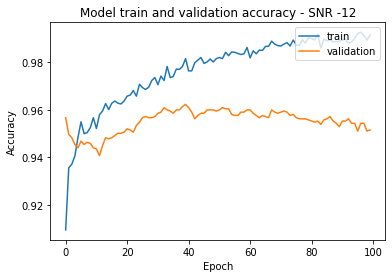

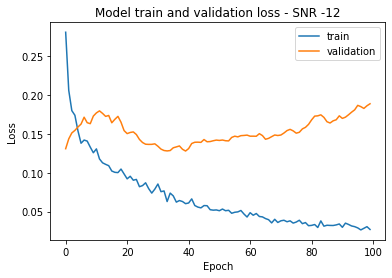


Training SNR = -12 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 4s 239ms/step - loss: 2.0059 - accuracy: 0.7918 - val_loss: 5.3569 - val_accuracy: 0.3221
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 1.3055 - accuracy: 0.8318 - val_loss: 3.1617 - val_accuracy: 0.4573
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 1.0586 - accuracy: 0.8551 - val_loss: 2.1873 - val_accuracy: 0.5613
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 0.9317 - accuracy: 0.8631 - val_loss: 1.8146 - val_accuracy: 0.5916
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.8278 - accuracy: 0.8748 - val_loss: 1.6561 - val_accuracy: 0.5935
Epoch 6/200
7/7 [==============================] - 1s 158ms/step - loss: 0.7003 - accuracy: 0.8842 - val_loss: 1.6425 - val_accuracy: 0.5893
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 0.6524 - accuracy: 0.88

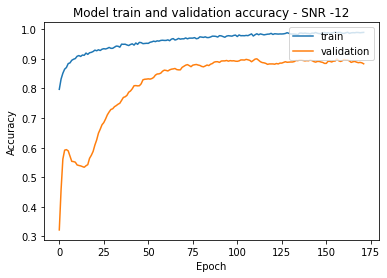

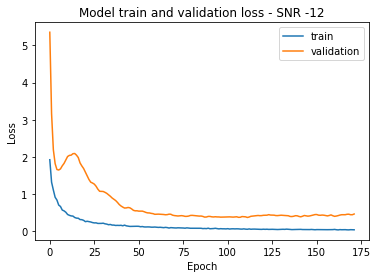


Training SNR = -12 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 242ms/step - loss: 0.2604 - accuracy: 0.9102 - val_loss: 0.1892 - val_accuracy: 0.9408
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 0.1932 - accuracy: 0.9340 - val_loss: 0.2839 - val_accuracy: 0.9058
Epoch 3/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1713 - accuracy: 0.9383 - val_loss: 0.3941 - val_accuracy: 0.8629
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.1457 - accuracy: 0.9449 - val_loss: 0.4828 - val_accuracy: 0.8420
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1507 - accuracy: 0.9457 - val_loss: 0.5528 - val_accuracy: 0.8252
Epoch 6/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1376 - accuracy: 0.9515 - val_loss: 0.5751 - val_accuracy: 0.8214
Epoch 7/200
7/7 [==============================] - 1s 165ms/step - loss: 0.1328 - accuracy: 0.951

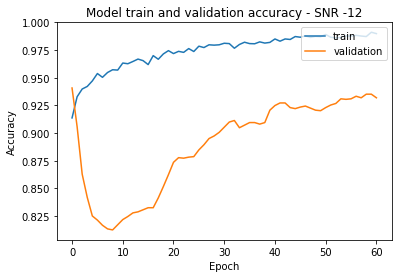

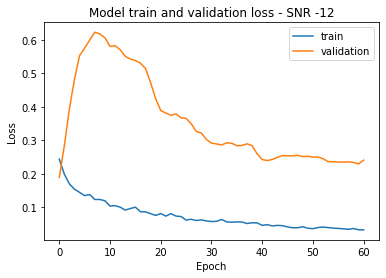


Score of SNR on All SNR model without Transfer Learning -10 = 98.22843670845032
Score of SNR on High SNR model without Transfer Learning -10 = 30.81585168838501
Score of SNR on low SNR model without Transfer Learning -10 = 94.35897469520569

Training SNR = -10 Data

Epoch 1/200
7/7 [==============================] - 3s 234ms/step - loss: 1.1816 - accuracy: 0.4228 - val_loss: 1.0679 - val_accuracy: 0.4047
Epoch 2/200
7/7 [==============================] - 1s 155ms/step - loss: 0.8956 - accuracy: 0.5906 - val_loss: 1.0045 - val_accuracy: 0.5058
Epoch 3/200
7/7 [==============================] - 1s 155ms/step - loss: 0.7805 - accuracy: 0.6577 - val_loss: 0.8567 - val_accuracy: 0.7016
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.6831 - accuracy: 0.7195 - val_loss: 0.7721 - val_accuracy: 0.7296
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.6137 - accuracy: 0.7397 - val_loss: 0.7642 - val_accuracy: 0.6559
Epoch 6/200
7/7 [==========

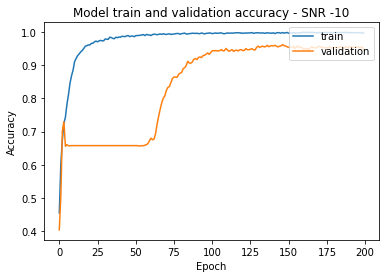

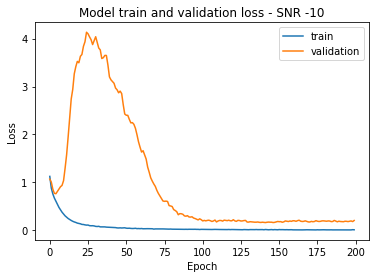


Training SNR = -10 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 232ms/step - loss: 0.1254 - accuracy: 0.9611 - val_loss: 0.0679 - val_accuracy: 0.9804
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0928 - accuracy: 0.9707 - val_loss: 0.0810 - val_accuracy: 0.9748
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0831 - accuracy: 0.9732 - val_loss: 0.0983 - val_accuracy: 0.9688
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0871 - accuracy: 0.9738 - val_loss: 0.1133 - val_accuracy: 0.9655
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0652 - accuracy: 0.9779 - val_loss: 0.1272 - val_accuracy: 0.9590
Epoch 6/200
7/7 [==============================] - 1s 156ms/step - loss: 0.0703 - accuracy: 0.9747 - val_loss: 0.1380 - val_accuracy: 0.9548
Epoch 7/200
7/7 [==============================] - 1s 167ms/step - loss: 0.0623 - accuracy: 0.978

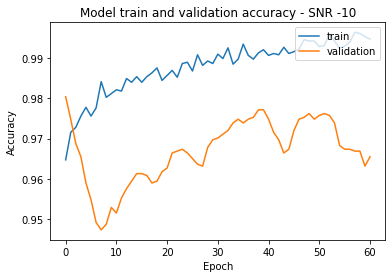

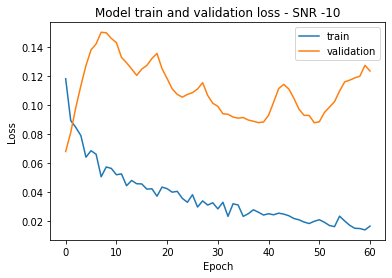


Training SNR = -10 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 284ms/step - loss: 0.8192 - accuracy: 0.8823 - val_loss: 2.4116 - val_accuracy: 0.5548
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.4937 - accuracy: 0.9190 - val_loss: 1.1101 - val_accuracy: 0.7296
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.3300 - accuracy: 0.9401 - val_loss: 0.6671 - val_accuracy: 0.8191
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.3187 - accuracy: 0.9390 - val_loss: 0.4982 - val_accuracy: 0.8513
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.2687 - accuracy: 0.9489 - val_loss: 0.4309 - val_accuracy: 0.8601
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 0.2339 - accuracy: 0.9475 - val_loss: 0.4322 - val_accuracy: 0.8503
Epoch 7/200
7/7 [==============================] - 1s 165ms/step - loss: 0.2199 - accuracy: 0.95

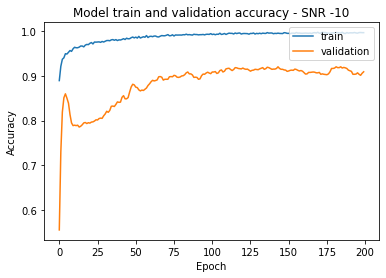

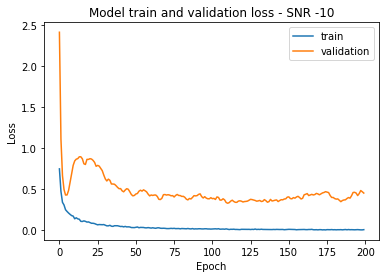


Training SNR = -10 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 241ms/step - loss: 0.1479 - accuracy: 0.9520 - val_loss: 0.2187 - val_accuracy: 0.9217
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1075 - accuracy: 0.9610 - val_loss: 0.3708 - val_accuracy: 0.8667
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0846 - accuracy: 0.9687 - val_loss: 0.5854 - val_accuracy: 0.8168
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0672 - accuracy: 0.9767 - val_loss: 0.7870 - val_accuracy: 0.7893
Epoch 5/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0727 - accuracy: 0.9761 - val_loss: 0.9410 - val_accuracy: 0.7786
Epoch 6/200
7/7 [==============================] - 1s 163ms/step - loss: 0.0682 - accuracy: 0.9777 - val_loss: 1.0570 - val_accuracy: 0.7697
Epoch 7/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0647 - accuracy: 0.975

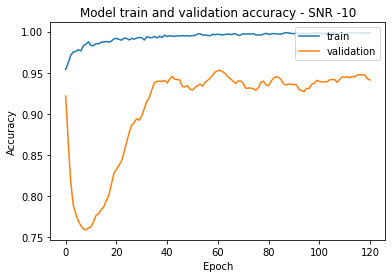

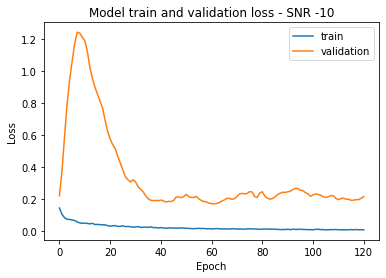


Score of SNR on All SNR model without Transfer Learning -8 = 99.20746088027954
Score of SNR on High SNR model without Transfer Learning -8 = 57.76223540306091
Score of SNR on low SNR model without Transfer Learning -8 = 94.40559148788452

Training SNR = -8 Data

Epoch 1/200
7/7 [==============================] - 3s 234ms/step - loss: 1.4306 - accuracy: 0.3385 - val_loss: 1.1928 - val_accuracy: 0.3170
Epoch 2/200
7/7 [==============================] - 1s 158ms/step - loss: 1.0581 - accuracy: 0.5556 - val_loss: 1.1977 - val_accuracy: 0.3319
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.8671 - accuracy: 0.6522 - val_loss: 0.8678 - val_accuracy: 0.7179
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.7518 - accuracy: 0.7102 - val_loss: 0.6972 - val_accuracy: 0.7259
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.6493 - accuracy: 0.7622 - val_loss: 0.7202 - val_accuracy: 0.6620
Epoch 6/200
7/7 [==============

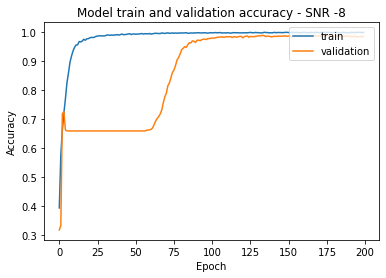

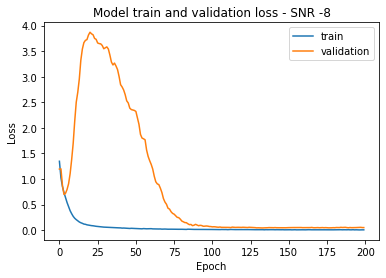


Training SNR = -8 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 227ms/step - loss: 0.0590 - accuracy: 0.9810 - val_loss: 0.0395 - val_accuracy: 0.9897
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0415 - accuracy: 0.9864 - val_loss: 0.0556 - val_accuracy: 0.9809
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0403 - accuracy: 0.9902 - val_loss: 0.0798 - val_accuracy: 0.9711
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0336 - accuracy: 0.9894 - val_loss: 0.1278 - val_accuracy: 0.9492
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0339 - accuracy: 0.9895 - val_loss: 0.1926 - val_accuracy: 0.9240
Epoch 6/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0255 - accuracy: 0.9920 - val_loss: 0.2305 - val_accuracy: 0.9058
Epoch 7/200
7/7 [==============================] - 1s 166ms/step - loss: 0.0251 - accuracy: 0.9911

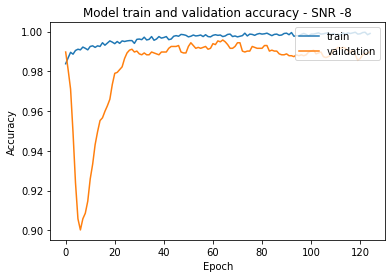

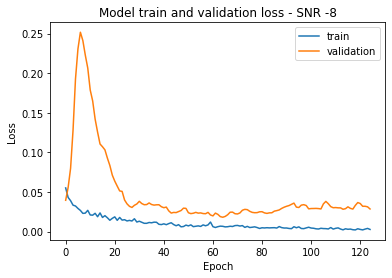


Training SNR = -8 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 227ms/step - loss: 0.2730 - accuracy: 0.9508 - val_loss: 0.5108 - val_accuracy: 0.8620
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1818 - accuracy: 0.9683 - val_loss: 0.1842 - val_accuracy: 0.9394
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1025 - accuracy: 0.9778 - val_loss: 0.1053 - val_accuracy: 0.9641
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1007 - accuracy: 0.9771 - val_loss: 0.1318 - val_accuracy: 0.9534
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0923 - accuracy: 0.9788 - val_loss: 0.2699 - val_accuracy: 0.9100
Epoch 6/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0810 - accuracy: 0.9811 - val_loss: 0.4773 - val_accuracy: 0.8690
Epoch 7/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0722 - accuracy: 0.981

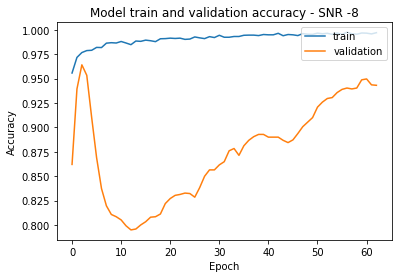

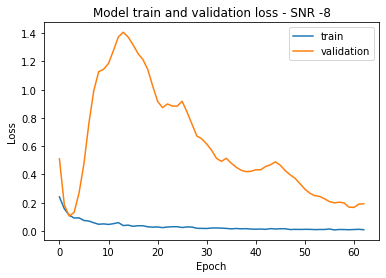


Training SNR = -8 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 242ms/step - loss: 0.0983 - accuracy: 0.9696 - val_loss: 0.2006 - val_accuracy: 0.9329
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0615 - accuracy: 0.9817 - val_loss: 0.2869 - val_accuracy: 0.8946
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0421 - accuracy: 0.9879 - val_loss: 0.4320 - val_accuracy: 0.8494
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0413 - accuracy: 0.9867 - val_loss: 0.5685 - val_accuracy: 0.8186
Epoch 5/200
7/7 [==============================] - 1s 158ms/step - loss: 0.0348 - accuracy: 0.9905 - val_loss: 0.6719 - val_accuracy: 0.8042
Epoch 6/200
7/7 [==============================] - 1s 156ms/step - loss: 0.0307 - accuracy: 0.9899 - val_loss: 0.7265 - val_accuracy: 0.8000
Epoch 7/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0295 - accuracy: 0.9924

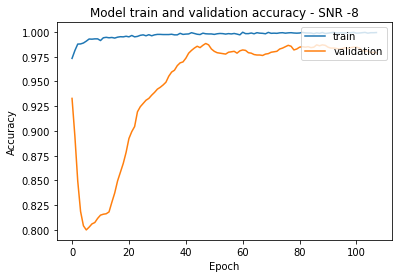

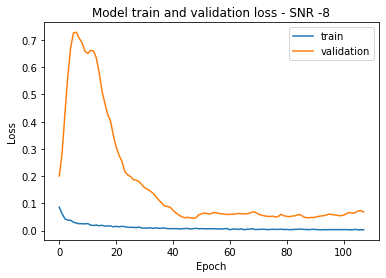


Score of SNR on All SNR model without Transfer Learning -6 = 98.97435903549194
Score of SNR on High SNR model without Transfer Learning -6 = 90.39627313613892
Score of SNR on low SNR model without Transfer Learning -6 = 92.91375279426575

Training SNR = -6 Data

Epoch 1/200
7/7 [==============================] - 3s 269ms/step - loss: 1.0911 - accuracy: 0.4854 - val_loss: 1.4198 - val_accuracy: 0.2476
Epoch 2/200
7/7 [==============================] - 1s 164ms/step - loss: 0.7777 - accuracy: 0.6745 - val_loss: 1.0121 - val_accuracy: 0.5287
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.6220 - accuracy: 0.7567 - val_loss: 0.5784 - val_accuracy: 0.7716
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.4945 - accuracy: 0.8343 - val_loss: 0.6254 - val_accuracy: 0.7007
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.3848 - accuracy: 0.8986 - val_loss: 0.8734 - val_accuracy: 0.6741
Epoch 6/200
7/7 [==============

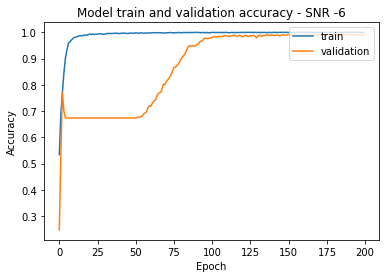

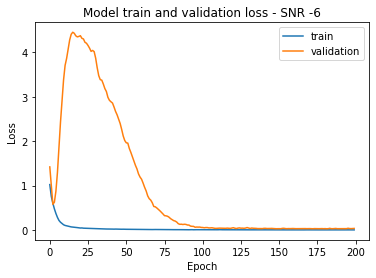


Training SNR = -6 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 229ms/step - loss: 0.0280 - accuracy: 0.9921 - val_loss: 0.0439 - val_accuracy: 0.9893
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0256 - accuracy: 0.9927 - val_loss: 0.0530 - val_accuracy: 0.9865
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0184 - accuracy: 0.9955 - val_loss: 0.0499 - val_accuracy: 0.9841
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0235 - accuracy: 0.9938 - val_loss: 0.0589 - val_accuracy: 0.9767
Epoch 5/200
7/7 [==============================] - 1s 146ms/step - loss: 0.0153 - accuracy: 0.9956 - val_loss: 0.0772 - val_accuracy: 0.9711
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0185 - accuracy: 0.9943 - val_loss: 0.0848 - val_accuracy: 0.9669
Epoch 7/200
7/7 [==============================] - 1s 163ms/step - loss: 0.0134 - accuracy: 0.9957

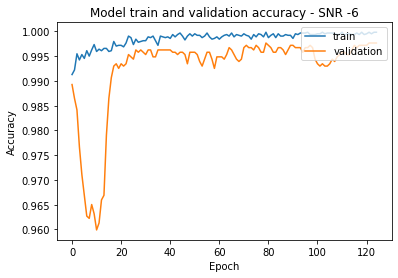

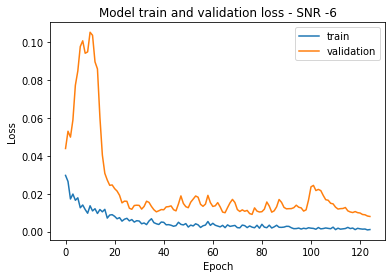


Training SNR = -6 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 242ms/step - loss: 0.0704 - accuracy: 0.9850 - val_loss: 0.0780 - val_accuracy: 0.9809
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0449 - accuracy: 0.9895 - val_loss: 0.0396 - val_accuracy: 0.9879
Epoch 3/200
7/7 [==============================] - 1s 158ms/step - loss: 0.0443 - accuracy: 0.9889 - val_loss: 0.0406 - val_accuracy: 0.9851
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0605 - accuracy: 0.9878 - val_loss: 0.0814 - val_accuracy: 0.9725
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0180 - accuracy: 0.9950 - val_loss: 0.1649 - val_accuracy: 0.9469
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0288 - accuracy: 0.9921 - val_loss: 0.2798 - val_accuracy: 0.9287
Epoch 7/200
7/7 [==============================] - 1s 161ms/step - loss: 0.0179 - accuracy: 0.993

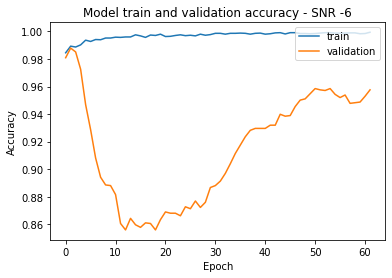

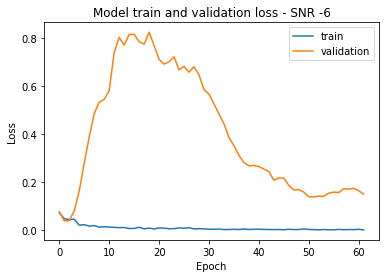


Training SNR = -6 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 234ms/step - loss: 0.0802 - accuracy: 0.9757 - val_loss: 0.2120 - val_accuracy: 0.9249
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0390 - accuracy: 0.9906 - val_loss: 0.2127 - val_accuracy: 0.9152
Epoch 3/200
7/7 [==============================] - 1s 160ms/step - loss: 0.0285 - accuracy: 0.9932 - val_loss: 0.2430 - val_accuracy: 0.9026
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0267 - accuracy: 0.9927 - val_loss: 0.2881 - val_accuracy: 0.8872
Epoch 5/200
7/7 [==============================] - 1s 155ms/step - loss: 0.0282 - accuracy: 0.9907 - val_loss: 0.3254 - val_accuracy: 0.8779
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0212 - accuracy: 0.9945 - val_loss: 0.3448 - val_accuracy: 0.8662
Epoch 7/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0197 - accuracy: 0.9951

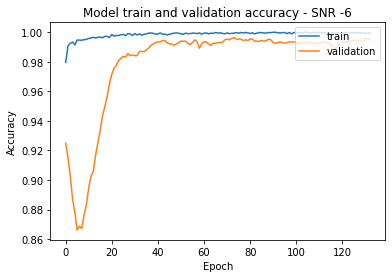

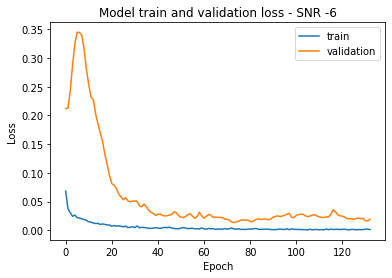


Score of SNR on All SNR model without Transfer Learning -4 = 99.16083812713623
Score of SNR on High SNR model without Transfer Learning -4 = 99.02098178863525
Score of SNR on low SNR model without Transfer Learning -4 = 92.35430955886841

Training SNR = -4 Data

Epoch 1/200
7/7 [==============================] - 4s 283ms/step - loss: 0.9506 - accuracy: 0.5699 - val_loss: 1.4084 - val_accuracy: 0.3305
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.6048 - accuracy: 0.7592 - val_loss: 0.7038 - val_accuracy: 0.8238
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 0.4483 - accuracy: 0.8465 - val_loss: 0.5412 - val_accuracy: 0.7552
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.3238 - accuracy: 0.9120 - val_loss: 1.0610 - val_accuracy: 0.6648
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.2447 - accuracy: 0.9452 - val_loss: 1.7648 - val_accuracy: 0.6625
Epoch 6/200
7/7 [==============

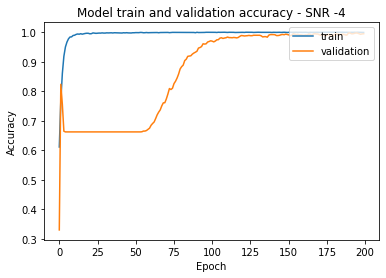

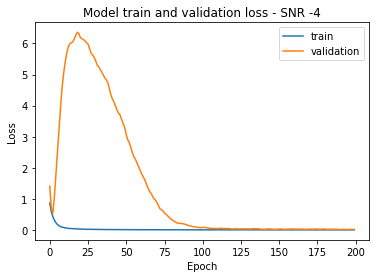


Training SNR = -4 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 225ms/step - loss: 0.0294 - accuracy: 0.9932 - val_loss: 0.0396 - val_accuracy: 0.9874
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0163 - accuracy: 0.9948 - val_loss: 0.0444 - val_accuracy: 0.9828
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0134 - accuracy: 0.9966 - val_loss: 0.0622 - val_accuracy: 0.9762
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0099 - accuracy: 0.9982 - val_loss: 0.0951 - val_accuracy: 0.9585
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0104 - accuracy: 0.9974 - val_loss: 0.1537 - val_accuracy: 0.9347
Epoch 6/200
7/7 [==============================] - 1s 158ms/step - loss: 0.0061 - accuracy: 0.9986 - val_loss: 0.2181 - val_accuracy: 0.9096
Epoch 7/200
7/7 [==============================] - 1s 172ms/step - loss: 0.0097 - accuracy: 0.9964

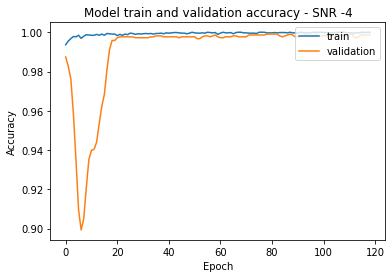

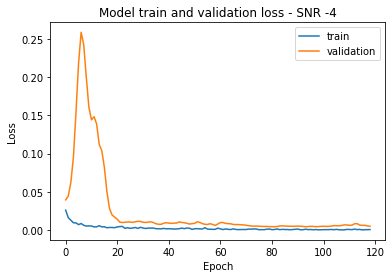


Training SNR = -4 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 4s 233ms/step - loss: 0.0143 - accuracy: 0.9963 - val_loss: 0.0138 - val_accuracy: 0.9953
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0075 - accuracy: 0.9972 - val_loss: 0.0059 - val_accuracy: 0.9972
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0070 - accuracy: 0.9967 - val_loss: 0.0037 - val_accuracy: 0.9977
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0090 - accuracy: 0.9962 - val_loss: 0.0040 - val_accuracy: 0.9981
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0038 - accuracy: 0.9986 - val_loss: 0.0069 - val_accuracy: 0.9967
Epoch 6/200
7/7 [==============================] - 1s 158ms/step - loss: 0.0070 - accuracy: 0.9975 - val_loss: 0.0181 - val_accuracy: 0.9935
Epoch 7/200
7/7 [==============================] - 1s 162ms/step - loss: 0.0070 - accuracy: 0.997

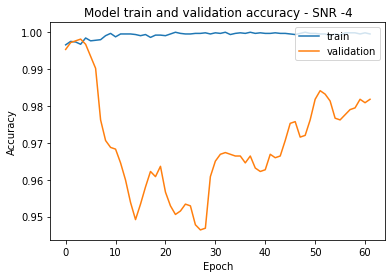

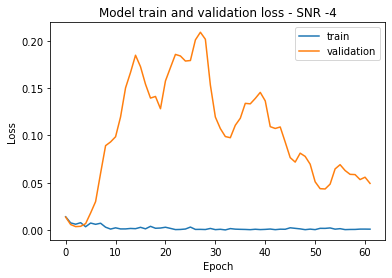


Training SNR = -4 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 229ms/step - loss: 0.0723 - accuracy: 0.9769 - val_loss: 0.3317 - val_accuracy: 0.9026
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0356 - accuracy: 0.9884 - val_loss: 0.3262 - val_accuracy: 0.8932
Epoch 3/200
7/7 [==============================] - 1s 158ms/step - loss: 0.0220 - accuracy: 0.9950 - val_loss: 0.3376 - val_accuracy: 0.8839
Epoch 4/200
7/7 [==============================] - 1s 163ms/step - loss: 0.0226 - accuracy: 0.9933 - val_loss: 0.3451 - val_accuracy: 0.8769
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0167 - accuracy: 0.9961 - val_loss: 0.3237 - val_accuracy: 0.8825
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0127 - accuracy: 0.9968 - val_loss: 0.2752 - val_accuracy: 0.8951
Epoch 7/200
7/7 [==============================] - 1s 159ms/step - loss: 0.0132 - accuracy: 0.9971

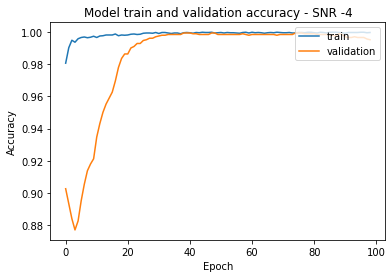

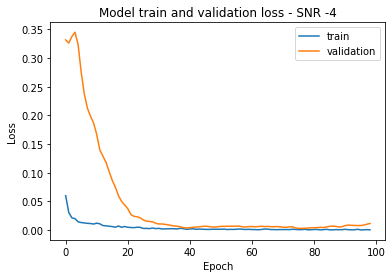


Score of SNR on All SNR model without Transfer Learning -2 = 98.55477809906006
Score of SNR on High SNR model without Transfer Learning -2 = 99.90676045417786
Score of SNR on low SNR model without Transfer Learning -2 = 90.95571041107178

Training SNR = -2 Data

Epoch 1/200
7/7 [==============================] - 3s 226ms/step - loss: 0.9535 - accuracy: 0.5730 - val_loss: 1.8167 - val_accuracy: 0.2862
Epoch 2/200
7/7 [==============================] - 1s 170ms/step - loss: 0.5490 - accuracy: 0.7937 - val_loss: 0.7322 - val_accuracy: 0.8009
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.3704 - accuracy: 0.8893 - val_loss: 0.6300 - val_accuracy: 0.7734
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.2453 - accuracy: 0.9430 - val_loss: 1.6811 - val_accuracy: 0.6667
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.1648 - accuracy: 0.9698 - val_loss: 2.8813 - val_accuracy: 0.6667
Epoch 6/200
7/7 [==============

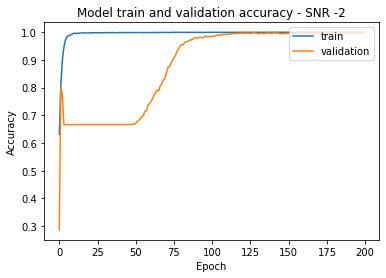

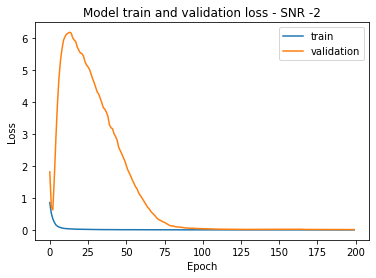


Training SNR = -2 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 245ms/step - loss: 0.0133 - accuracy: 0.9965 - val_loss: 0.0413 - val_accuracy: 0.9888
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0079 - accuracy: 0.9979 - val_loss: 0.0357 - val_accuracy: 0.9893
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0110 - accuracy: 0.9979 - val_loss: 0.0367 - val_accuracy: 0.9883
Epoch 4/200
7/7 [==============================] - 1s 164ms/step - loss: 0.0064 - accuracy: 0.9979 - val_loss: 0.0419 - val_accuracy: 0.9860
Epoch 5/200
7/7 [==============================] - 1s 159ms/step - loss: 0.0040 - accuracy: 0.9992 - val_loss: 0.0492 - val_accuracy: 0.9823
Epoch 6/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0041 - accuracy: 0.9987 - val_loss: 0.0630 - val_accuracy: 0.9748
Epoch 7/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0039 - accuracy: 0.9988

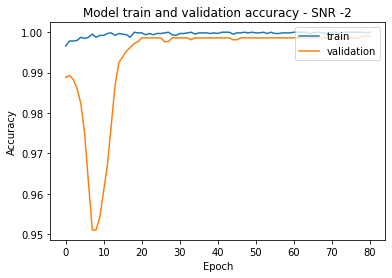

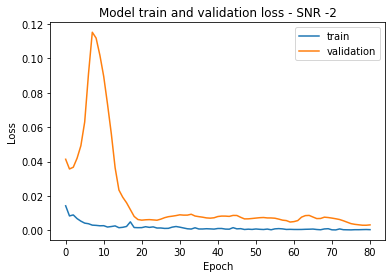


Training SNR = -2 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 243ms/step - loss: 0.0030 - accuracy: 0.9992 - val_loss: 4.1757e-05 - val_accuracy: 1.0000
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0013 - accuracy: 0.9995 - val_loss: 4.2379e-05 - val_accuracy: 1.0000
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0013 - accuracy: 0.9994 - val_loss: 4.8020e-05 - val_accuracy: 1.0000
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0015 - accuracy: 0.9998 - val_loss: 5.3430e-05 - val_accuracy: 1.0000
Epoch 5/200
7/7 [==============================] - 1s 155ms/step - loss: 0.0011 - accuracy: 0.9994 - val_loss: 6.6330e-05 - val_accuracy: 1.0000
Epoch 6/200
7/7 [==============================] - 1s 160ms/step - loss: 3.7361e-04 - accuracy: 1.0000 - val_loss: 1.2927e-04 - val_accuracy: 1.0000
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - lo

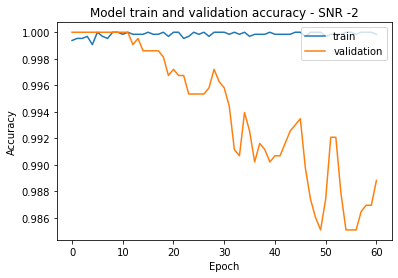

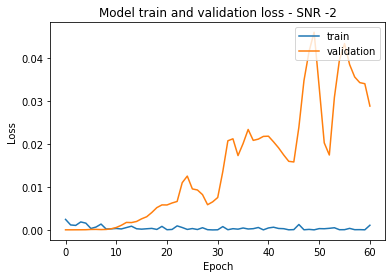


Training SNR = -2 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 246ms/step - loss: 0.0407 - accuracy: 0.9878 - val_loss: 0.2562 - val_accuracy: 0.9221
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0213 - accuracy: 0.9946 - val_loss: 0.2069 - val_accuracy: 0.9319
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0133 - accuracy: 0.9970 - val_loss: 0.1810 - val_accuracy: 0.9333
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0158 - accuracy: 0.9965 - val_loss: 0.1556 - val_accuracy: 0.9394
Epoch 5/200
7/7 [==============================] - 1s 160ms/step - loss: 0.0111 - accuracy: 0.9970 - val_loss: 0.1259 - val_accuracy: 0.9487
Epoch 6/200
7/7 [==============================] - 1s 163ms/step - loss: 0.0122 - accuracy: 0.9975 - val_loss: 0.0916 - val_accuracy: 0.9627
Epoch 7/200
7/7 [==============================] - 1s 158ms/step - loss: 0.0090 - accuracy: 0.9977

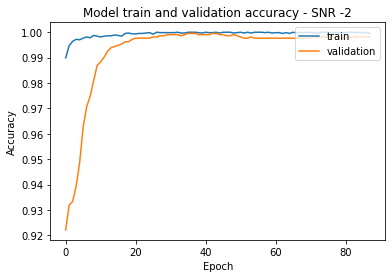

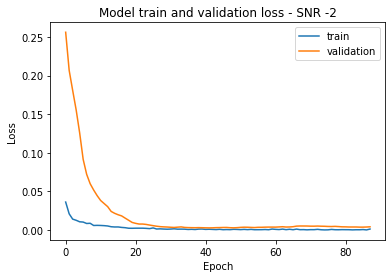

In [ ]:
#es

for i in range(0, 10):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_labels_fft_curr = y_labels_data[:,i].flatten()
  y_data_fft_curr = np.zeros(shape=(y_labels_fft_curr.shape[0], 3))
  
  for j in range(y_labels_fft_curr.shape[0]):
    if(0<=y_labels_fft_curr[j] and y_labels_fft_curr[j]<=9):
      y_data_fft_curr[j][0] = 1
    elif(10<=y_labels_fft_curr[j] and y_labels_fft_curr[j]<=12):
      y_data_fft_curr[j][1] = 1
    else:
      y_data_fft_curr[j][2] = 1

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)


Score of SNR on All SNR model without Transfer Learning 0 = 98.55477809906006
Score of SNR on High SNR model without Transfer Learning 0 = 100.0
Score of SNR on low SNR model without Transfer Learning 0 = 91.60839319229126

Training SNR = 0 Data

Epoch 1/200
7/7 [==============================] - 3s 268ms/step - loss: 1.1922 - accuracy: 0.4614 - val_loss: 2.1918 - val_accuracy: 0.3203
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 0.6607 - accuracy: 0.7622 - val_loss: 0.8441 - val_accuracy: 0.7497
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 0.4395 - accuracy: 0.8748 - val_loss: 0.6910 - val_accuracy: 0.7907
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.3011 - accuracy: 0.9291 - val_loss: 1.7195 - val_accuracy: 0.6578
Epoch 5/200
7/7 [==============================] - 1s 147ms/step - loss: 0.2074 - accuracy: 0.9672 - val_loss: 2.7841 - val_accuracy: 0.6578
Epoch 6/200
7/7 [==============================

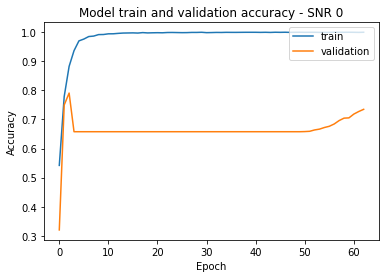

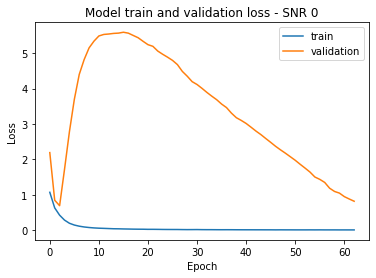


Score of SNR on All SNR model without Transfer Learning 2 = 98.55477809906006
Score of SNR on High SNR model without Transfer Learning 2 = 99.95337724685669
Score of SNR on low SNR model without Transfer Learning 2 = 90.95571041107178

Training SNR = 2 Data

Epoch 1/200
7/7 [==============================] - 3s 259ms/step - loss: 1.1417 - accuracy: 0.5141 - val_loss: 2.8501 - val_accuracy: 0.2531
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 0.5454 - accuracy: 0.8212 - val_loss: 1.1045 - val_accuracy: 0.6126
Epoch 3/200
7/7 [==============================] - 1s 146ms/step - loss: 0.3516 - accuracy: 0.9017 - val_loss: 0.5197 - val_accuracy: 0.8159
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.2287 - accuracy: 0.9552 - val_loss: 1.6903 - val_accuracy: 0.6559
Epoch 5/200
7/7 [==============================] - 1s 146ms/step - loss: 0.1637 - accuracy: 0.9698 - val_loss: 2.8079 - val_accuracy: 0.6559
Epoch 6/200
7/7 [==================

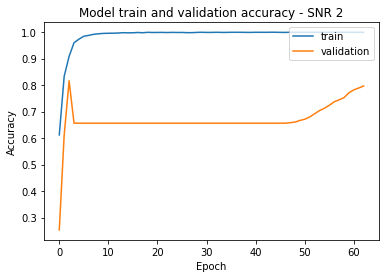

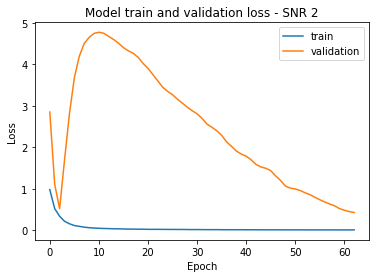


Score of SNR on All SNR model without Transfer Learning 4 = 98.22843670845032
Score of SNR on High SNR model without Transfer Learning 4 = 100.0
Score of SNR on low SNR model without Transfer Learning 4 = 90.25641083717346

Training SNR = 4 Data

Epoch 1/200
7/7 [==============================] - 3s 232ms/step - loss: 1.2517 - accuracy: 0.4957 - val_loss: 3.8833 - val_accuracy: 0.2205
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 0.5537 - accuracy: 0.8268 - val_loss: 1.0659 - val_accuracy: 0.6900
Epoch 3/200
7/7 [==============================] - 1s 145ms/step - loss: 0.3576 - accuracy: 0.9016 - val_loss: 0.6521 - val_accuracy: 0.7851
Epoch 4/200
7/7 [==============================] - 1s 146ms/step - loss: 0.2292 - accuracy: 0.9536 - val_loss: 2.0981 - val_accuracy: 0.6536
Epoch 5/200
7/7 [==============================] - 1s 147ms/step - loss: 0.1548 - accuracy: 0.9729 - val_loss: 3.2926 - val_accuracy: 0.6536
Epoch 6/200
7/7 [==============================

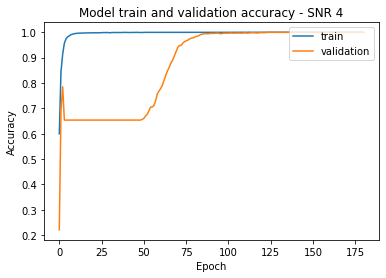

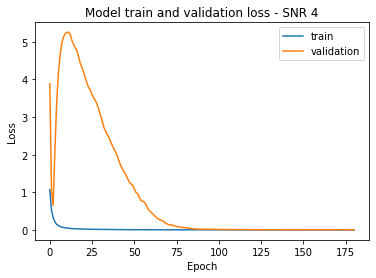


Score of SNR on All SNR model without Transfer Learning 6 = 97.80885577201843
Score of SNR on High SNR model without Transfer Learning 6 = 100.0
Score of SNR on low SNR model without Transfer Learning 6 = 89.83682990074158

Training SNR = 6 Data

Epoch 1/200
7/7 [==============================] - 3s 248ms/step - loss: 1.2109 - accuracy: 0.5222 - val_loss: 5.6308 - val_accuracy: 0.1893
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 0.4626 - accuracy: 0.8522 - val_loss: 1.7132 - val_accuracy: 0.4807
Epoch 3/200
7/7 [==============================] - 1s 148ms/step - loss: 0.2751 - accuracy: 0.9265 - val_loss: 0.3648 - val_accuracy: 0.8741
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.1599 - accuracy: 0.9696 - val_loss: 1.1735 - val_accuracy: 0.6727
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.1185 - accuracy: 0.9801 - val_loss: 1.8914 - val_accuracy: 0.6704
Epoch 6/200
7/7 [==============================

KeyboardInterrupt: ignored

In [ ]:
#es

for i in range(10, 21):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_labels_fft_curr = y_labels_data[:,i].flatten()
  y_data_fft_curr = np.zeros(shape=(y_labels_fft_curr.shape[0], 3))
  
  for j in range(y_labels_fft_curr.shape[0]):
    if(0<=y_labels_fft_curr[j] and y_labels_fft_curr[j]<=9):
      y_data_fft_curr[j][0] = 1
    elif(10<=y_labels_fft_curr[j] and y_labels_fft_curr[j]<=12):
      y_data_fft_curr[j][1] = 1
    else:
      y_data_fft_curr[j][2] = 1

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)


Score of SNR on All SNR model without Transfer Learning -10 = 98.92773628234863
Score of SNR on High SNR model without Transfer Learning -10 = 35.75757443904877
Score of SNR on low SNR model without Transfer Learning -10 = 94.07925605773926

Training SNR = -10 Data

Epoch 1/200
7/7 [==============================] - 8s 287ms/step - loss: 1.1929 - accuracy: 0.4289 - val_loss: 1.0785 - val_accuracy: 0.4499
Epoch 2/200
7/7 [==============================] - 1s 143ms/step - loss: 0.8714 - accuracy: 0.5963 - val_loss: 1.0249 - val_accuracy: 0.5044
Epoch 3/200
7/7 [==============================] - 1s 142ms/step - loss: 0.7333 - accuracy: 0.6723 - val_loss: 0.8514 - val_accuracy: 0.7221
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.6758 - accuracy: 0.7070 - val_loss: 0.7527 - val_accuracy: 0.6858
Epoch 5/200
7/7 [==============================] - 1s 141ms/step - loss: 0.6194 - accuracy: 0.7318 - val_loss: 0.7410 - val_accuracy: 0.6625
Epoch 6/200
7/7 [==========

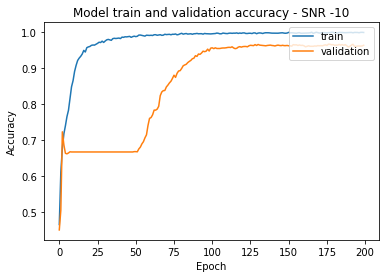

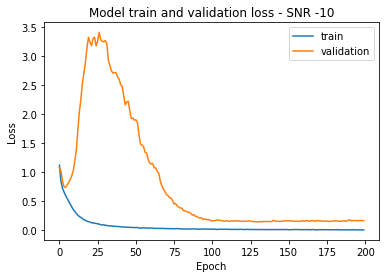


Training SNR = -10 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 246ms/step - loss: 0.1488 - accuracy: 0.9530 - val_loss: 0.0638 - val_accuracy: 0.9800
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1030 - accuracy: 0.9643 - val_loss: 0.0835 - val_accuracy: 0.9725
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0874 - accuracy: 0.9719 - val_loss: 0.1119 - val_accuracy: 0.9632
Epoch 4/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0932 - accuracy: 0.9718 - val_loss: 0.1287 - val_accuracy: 0.9552
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0723 - accuracy: 0.9758 - val_loss: 0.1493 - val_accuracy: 0.9515
Epoch 6/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0733 - accuracy: 0.9744 - val_loss: 0.1639 - val_accuracy: 0.9473
Epoch 7/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0659 - accuracy: 0.978

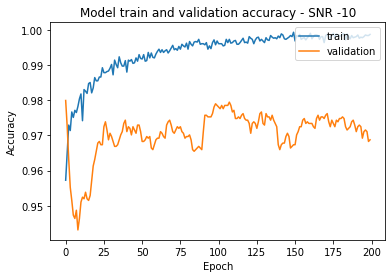

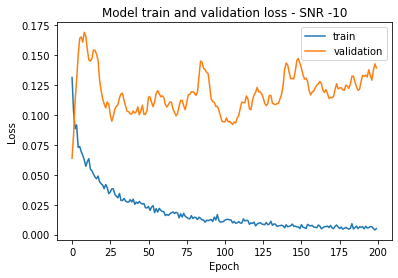


Training SNR = -10 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 232ms/step - loss: 1.0803 - accuracy: 0.8636 - val_loss: 1.5714 - val_accuracy: 0.6723
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.6543 - accuracy: 0.9013 - val_loss: 0.7702 - val_accuracy: 0.8131
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.5365 - accuracy: 0.9138 - val_loss: 0.5295 - val_accuracy: 0.8625
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.4067 - accuracy: 0.9320 - val_loss: 0.4165 - val_accuracy: 0.8909
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.4159 - accuracy: 0.9264 - val_loss: 0.3763 - val_accuracy: 0.8928
Epoch 6/200
7/7 [==============================] - 1s 150ms/step - loss: 0.3304 - accuracy: 0.9394 - val_loss: 0.4041 - val_accuracy: 0.8741
Epoch 7/200
7/7 [==============================] - 1s 160ms/step - loss: 0.2675 - accuracy: 0.94

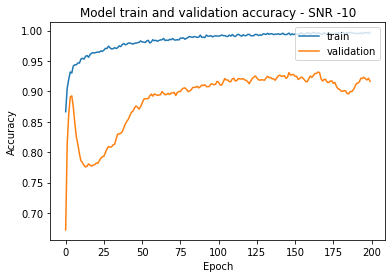

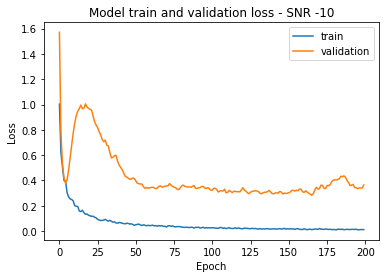


Training SNR = -10 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 225ms/step - loss: 0.1407 - accuracy: 0.9519 - val_loss: 0.2601 - val_accuracy: 0.9096
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 0.1155 - accuracy: 0.9606 - val_loss: 0.5158 - val_accuracy: 0.8406
Epoch 3/200
7/7 [==============================] - 1s 159ms/step - loss: 0.0904 - accuracy: 0.9685 - val_loss: 0.8181 - val_accuracy: 0.7897
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0805 - accuracy: 0.9729 - val_loss: 1.0116 - val_accuracy: 0.7781
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0664 - accuracy: 0.9777 - val_loss: 1.1467 - val_accuracy: 0.7706
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0670 - accuracy: 0.9767 - val_loss: 1.2175 - val_accuracy: 0.7683
Epoch 7/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0633 - accuracy: 0.978

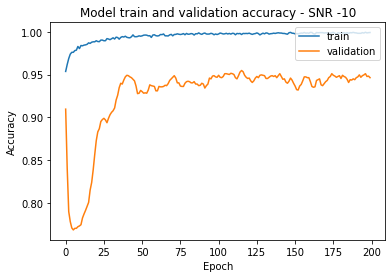

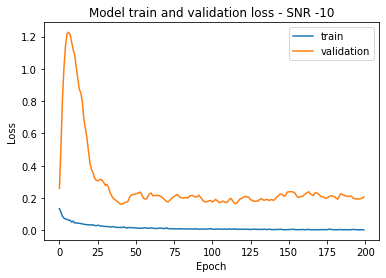


Score of SNR on All SNR model without Transfer Learning -8 = 99.30070042610168
Score of SNR on High SNR model without Transfer Learning -8 = 68.01864504814148
Score of SNR on low SNR model without Transfer Learning -8 = 93.84615421295166

Training SNR = -8 Data

Epoch 1/200
7/7 [==============================] - 4s 247ms/step - loss: 1.3255 - accuracy: 0.3965 - val_loss: 1.2186 - val_accuracy: 0.1613
Epoch 2/200
7/7 [==============================] - 1s 149ms/step - loss: 0.9959 - accuracy: 0.5618 - val_loss: 1.0309 - val_accuracy: 0.4779
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.8226 - accuracy: 0.6596 - val_loss: 0.7580 - val_accuracy: 0.7744
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.6922 - accuracy: 0.7271 - val_loss: 0.6135 - val_accuracy: 0.7469
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.5784 - accuracy: 0.7797 - val_loss: 0.6222 - val_accuracy: 0.6895
Epoch 6/200
7/7 [==============

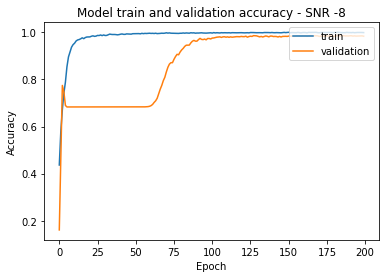

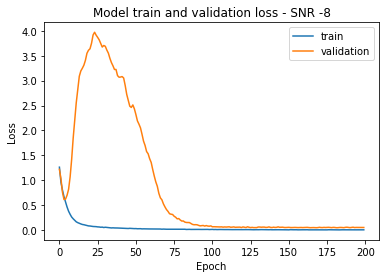


Training SNR = -8 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 238ms/step - loss: 0.0508 - accuracy: 0.9829 - val_loss: 0.0356 - val_accuracy: 0.9911
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0387 - accuracy: 0.9882 - val_loss: 0.0510 - val_accuracy: 0.9851
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0345 - accuracy: 0.9885 - val_loss: 0.0694 - val_accuracy: 0.9767
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0290 - accuracy: 0.9890 - val_loss: 0.1014 - val_accuracy: 0.9646
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0315 - accuracy: 0.9903 - val_loss: 0.1316 - val_accuracy: 0.9548
Epoch 6/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0252 - accuracy: 0.9905 - val_loss: 0.1586 - val_accuracy: 0.9431
Epoch 7/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0274 - accuracy: 0.9903

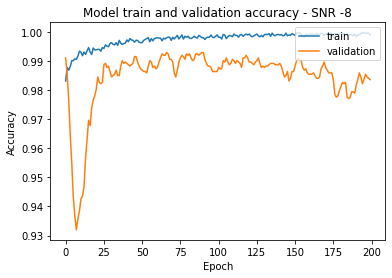

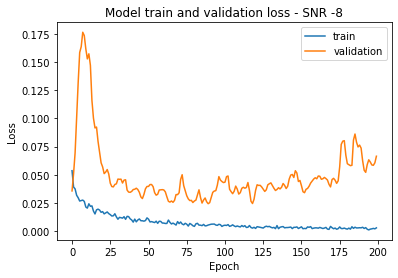


Training SNR = -8 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 4s 278ms/step - loss: 0.3601 - accuracy: 0.9330 - val_loss: 0.3678 - val_accuracy: 0.8942
Epoch 2/200
7/7 [==============================] - 1s 159ms/step - loss: 0.2382 - accuracy: 0.9618 - val_loss: 0.1619 - val_accuracy: 0.9487
Epoch 3/200
7/7 [==============================] - 1s 150ms/step - loss: 0.1673 - accuracy: 0.9702 - val_loss: 0.1135 - val_accuracy: 0.9650
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1363 - accuracy: 0.9728 - val_loss: 0.1140 - val_accuracy: 0.9641
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.1184 - accuracy: 0.9767 - val_loss: 0.1652 - val_accuracy: 0.9469
Epoch 6/200
7/7 [==============================] - 1s 149ms/step - loss: 0.1206 - accuracy: 0.9762 - val_loss: 0.2482 - val_accuracy: 0.9212
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1113 - accuracy: 0.977

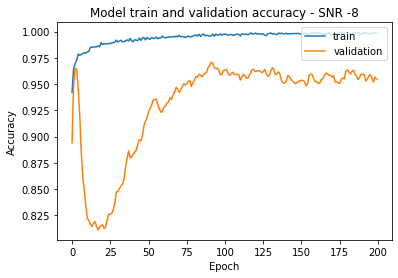

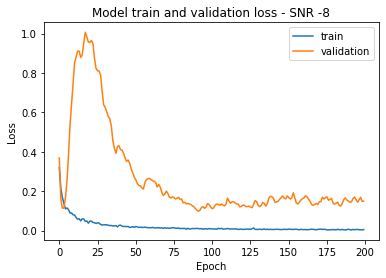


Training SNR = -8 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 4s 234ms/step - loss: 0.0842 - accuracy: 0.9719 - val_loss: 0.2738 - val_accuracy: 0.9133
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0577 - accuracy: 0.9827 - val_loss: 0.4391 - val_accuracy: 0.8620
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0427 - accuracy: 0.9851 - val_loss: 0.6401 - val_accuracy: 0.8233
Epoch 4/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0416 - accuracy: 0.9875 - val_loss: 0.8132 - val_accuracy: 0.8042
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0372 - accuracy: 0.9894 - val_loss: 0.9318 - val_accuracy: 0.7944
Epoch 6/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0364 - accuracy: 0.9879 - val_loss: 1.0279 - val_accuracy: 0.7935
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0305 - accuracy: 0.9904

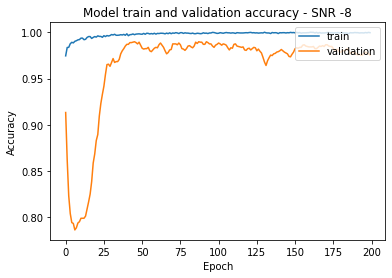

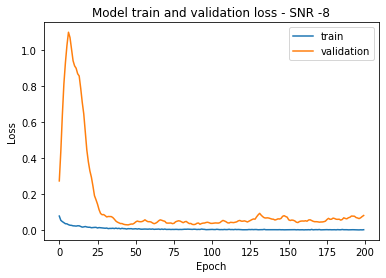


Score of SNR on All SNR model without Transfer Learning -6 = 99.1142213344574
Score of SNR on High SNR model without Transfer Learning -6 = 94.40559148788452
Score of SNR on low SNR model without Transfer Learning -6 = 93.42657327651978

Training SNR = -6 Data

Epoch 1/200
7/7 [==============================] - 4s 236ms/step - loss: 1.0798 - accuracy: 0.4994 - val_loss: 1.2532 - val_accuracy: 0.3110
Epoch 2/200
7/7 [==============================] - 1s 159ms/step - loss: 0.7763 - accuracy: 0.6712 - val_loss: 1.0470 - val_accuracy: 0.4895
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.6247 - accuracy: 0.7535 - val_loss: 0.6210 - val_accuracy: 0.7674
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.4963 - accuracy: 0.8222 - val_loss: 0.6105 - val_accuracy: 0.7343
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.3871 - accuracy: 0.8836 - val_loss: 0.8887 - val_accuracy: 0.6723
Epoch 6/200
7/7 [===============

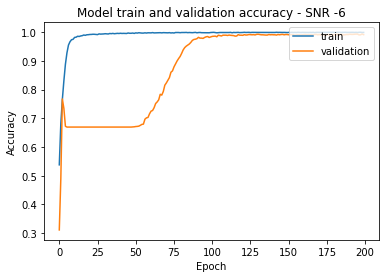

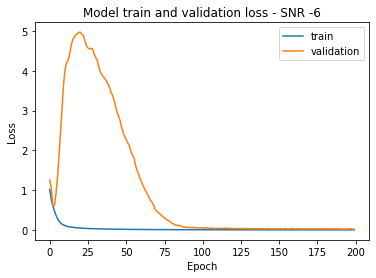


Training SNR = -6 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 239ms/step - loss: 0.0350 - accuracy: 0.9911 - val_loss: 0.0378 - val_accuracy: 0.9916
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0203 - accuracy: 0.9951 - val_loss: 0.0534 - val_accuracy: 0.9860
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0204 - accuracy: 0.9942 - val_loss: 0.0682 - val_accuracy: 0.9753
Epoch 4/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0191 - accuracy: 0.9949 - val_loss: 0.0971 - val_accuracy: 0.9590
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0163 - accuracy: 0.9950 - val_loss: 0.1288 - val_accuracy: 0.9464
Epoch 6/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0144 - accuracy: 0.9963 - val_loss: 0.1258 - val_accuracy: 0.9473
Epoch 7/200
7/7 [==============================] - 1s 162ms/step - loss: 0.0133 - accuracy: 0.9959

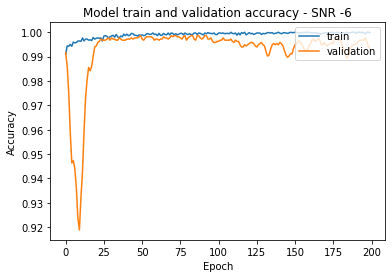

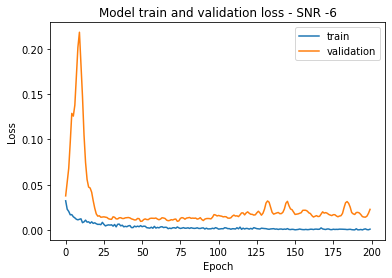


Training SNR = -6 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 234ms/step - loss: 0.0840 - accuracy: 0.9802 - val_loss: 0.0414 - val_accuracy: 0.9855
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0619 - accuracy: 0.9863 - val_loss: 0.0357 - val_accuracy: 0.9888
Epoch 3/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0565 - accuracy: 0.9873 - val_loss: 0.0618 - val_accuracy: 0.9809
Epoch 4/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0431 - accuracy: 0.9900 - val_loss: 0.1141 - val_accuracy: 0.9599
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0347 - accuracy: 0.9912 - val_loss: 0.2005 - val_accuracy: 0.9417
Epoch 6/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0278 - accuracy: 0.9925 - val_loss: 0.3635 - val_accuracy: 0.9128
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0315 - accuracy: 0.992

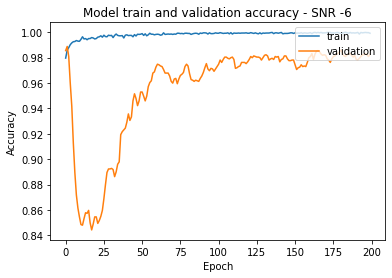

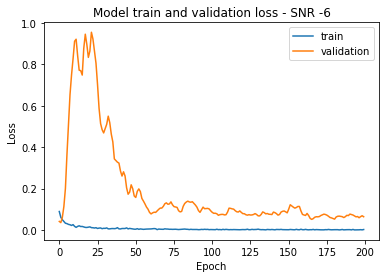


Training SNR = -6 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 239ms/step - loss: 0.0746 - accuracy: 0.9784 - val_loss: 0.2602 - val_accuracy: 0.9082
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0381 - accuracy: 0.9895 - val_loss: 0.3321 - val_accuracy: 0.8844
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0342 - accuracy: 0.9903 - val_loss: 0.4473 - val_accuracy: 0.8503
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0273 - accuracy: 0.9925 - val_loss: 0.5485 - val_accuracy: 0.8266
Epoch 5/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0230 - accuracy: 0.9937 - val_loss: 0.6088 - val_accuracy: 0.8154
Epoch 6/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0214 - accuracy: 0.9943 - val_loss: 0.6578 - val_accuracy: 0.8079
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0227 - accuracy: 0.9942

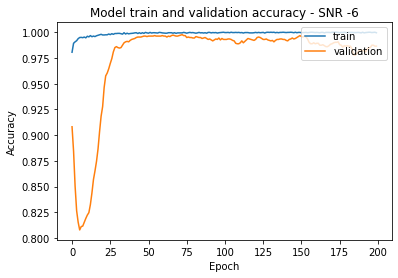

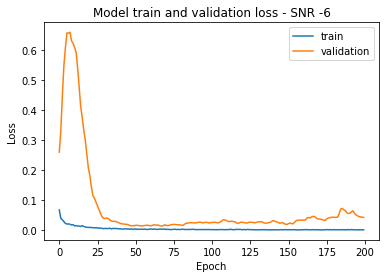


Score of SNR on All SNR model without Transfer Learning -4 = 99.02098178863525
Score of SNR on High SNR model without Transfer Learning -4 = 99.30070042610168
Score of SNR on low SNR model without Transfer Learning -4 = 90.81584811210632

Training SNR = -4 Data

Epoch 1/200
7/7 [==============================] - 4s 229ms/step - loss: 1.0626 - accuracy: 0.5050 - val_loss: 1.7532 - val_accuracy: 0.3329
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.7006 - accuracy: 0.7205 - val_loss: 1.1356 - val_accuracy: 0.4727
Epoch 3/200
7/7 [==============================] - 1s 163ms/step - loss: 0.5305 - accuracy: 0.8187 - val_loss: 0.5228 - val_accuracy: 0.7744
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 0.3950 - accuracy: 0.8850 - val_loss: 0.9588 - val_accuracy: 0.6746
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.2881 - accuracy: 0.9352 - val_loss: 1.6771 - val_accuracy: 0.6559
Epoch 6/200
7/7 [==============

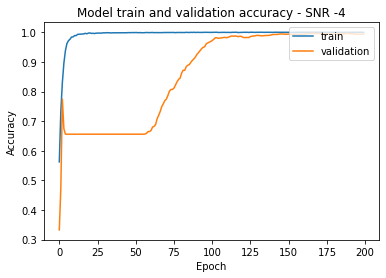

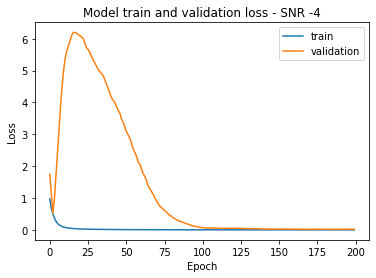


Training SNR = -4 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 243ms/step - loss: 0.0249 - accuracy: 0.9932 - val_loss: 0.0450 - val_accuracy: 0.9841
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0175 - accuracy: 0.9948 - val_loss: 0.0637 - val_accuracy: 0.9776
Epoch 3/200
7/7 [==============================] - 1s 156ms/step - loss: 0.0121 - accuracy: 0.9965 - val_loss: 0.1060 - val_accuracy: 0.9562
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0094 - accuracy: 0.9978 - val_loss: 0.1637 - val_accuracy: 0.9277
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0071 - accuracy: 0.9982 - val_loss: 0.2035 - val_accuracy: 0.9105
Epoch 6/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0073 - accuracy: 0.9981 - val_loss: 0.2137 - val_accuracy: 0.9110
Epoch 7/200
7/7 [==============================] - 1s 158ms/step - loss: 0.0068 - accuracy: 0.9977

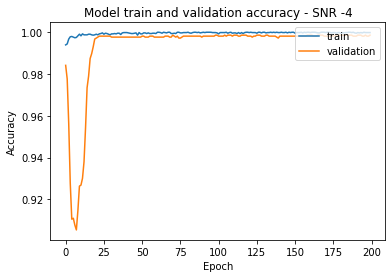

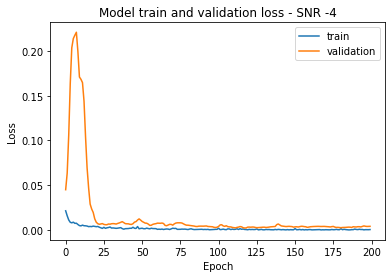


Training SNR = -4 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 235ms/step - loss: 0.0211 - accuracy: 0.9943 - val_loss: 0.0096 - val_accuracy: 0.9963
Epoch 2/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0127 - accuracy: 0.9970 - val_loss: 0.0087 - val_accuracy: 0.9972
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 0.0090 - accuracy: 0.9974 - val_loss: 0.0125 - val_accuracy: 0.9967
Epoch 4/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0074 - accuracy: 0.9974 - val_loss: 0.0140 - val_accuracy: 0.9958
Epoch 5/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0137 - accuracy: 0.9970 - val_loss: 0.0133 - val_accuracy: 0.9949
Epoch 6/200
7/7 [==============================] - 1s 163ms/step - loss: 0.0075 - accuracy: 0.9979 - val_loss: 0.0241 - val_accuracy: 0.9911
Epoch 7/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0068 - accuracy: 0.998

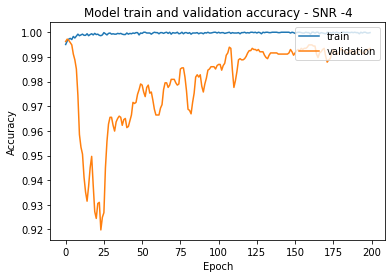

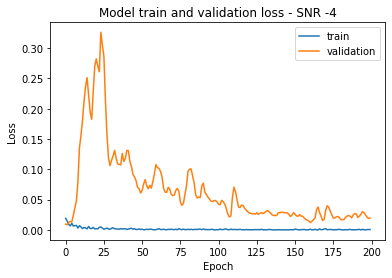


Training SNR = -4 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 245ms/step - loss: 0.0587 - accuracy: 0.9818 - val_loss: 0.3467 - val_accuracy: 0.8895
Epoch 2/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0295 - accuracy: 0.9922 - val_loss: 0.4153 - val_accuracy: 0.8727
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0175 - accuracy: 0.9959 - val_loss: 0.4745 - val_accuracy: 0.8550
Epoch 4/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0170 - accuracy: 0.9953 - val_loss: 0.4948 - val_accuracy: 0.8462
Epoch 5/200
7/7 [==============================] - 1s 157ms/step - loss: 0.0157 - accuracy: 0.9959 - val_loss: 0.5016 - val_accuracy: 0.8420
Epoch 6/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0109 - accuracy: 0.9978 - val_loss: 0.4872 - val_accuracy: 0.8443
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0155 - accuracy: 0.9954

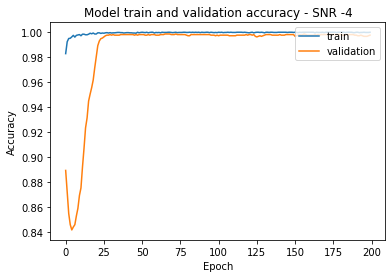

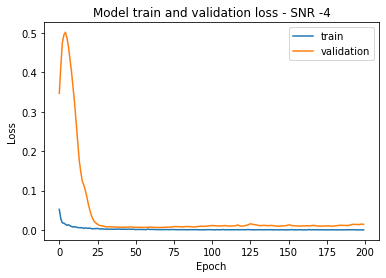


Score of SNR on All SNR model without Transfer Learning -2 = 99.02098178863525
Score of SNR on High SNR model without Transfer Learning -2 = 100.0
Score of SNR on low SNR model without Transfer Learning -2 = 90.25641083717346

Training SNR = -2 Data

Epoch 1/200
7/7 [==============================] - 4s 232ms/step - loss: 1.1295 - accuracy: 0.4823 - val_loss: 2.1790 - val_accuracy: 0.3184
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 0.6901 - accuracy: 0.7382 - val_loss: 1.2681 - val_accuracy: 0.4695
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.5107 - accuracy: 0.8301 - val_loss: 0.5096 - val_accuracy: 0.7967
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.3583 - accuracy: 0.9073 - val_loss: 1.0686 - val_accuracy: 0.6834
Epoch 5/200
7/7 [==============================] - 1s 147ms/step - loss: 0.2576 - accuracy: 0.9499 - val_loss: 1.8340 - val_accuracy: 0.6737
Epoch 6/200
7/7 [==========================

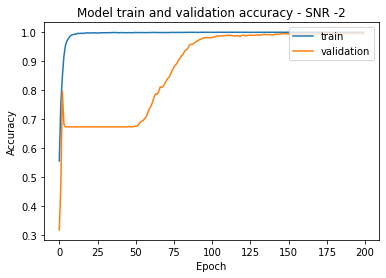

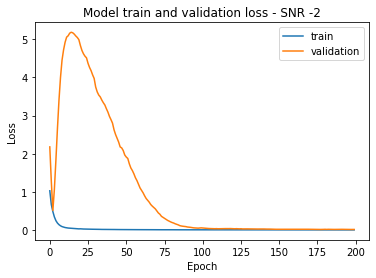


Training SNR = -2 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 3s 237ms/step - loss: 0.0141 - accuracy: 0.9964 - val_loss: 0.0287 - val_accuracy: 0.9911
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0112 - accuracy: 0.9963 - val_loss: 0.0276 - val_accuracy: 0.9907
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0100 - accuracy: 0.9980 - val_loss: 0.0314 - val_accuracy: 0.9869
Epoch 4/200
7/7 [==============================] - 1s 156ms/step - loss: 0.0053 - accuracy: 0.9986 - val_loss: 0.0405 - val_accuracy: 0.9837
Epoch 5/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0052 - accuracy: 0.9987 - val_loss: 0.0632 - val_accuracy: 0.9753
Epoch 6/200
7/7 [==============================] - 1s 158ms/step - loss: 0.0061 - accuracy: 0.9983 - val_loss: 0.0880 - val_accuracy: 0.9641
Epoch 7/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0033 - accuracy: 0.9992

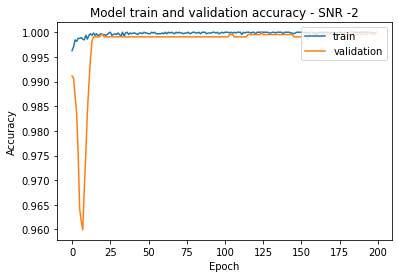

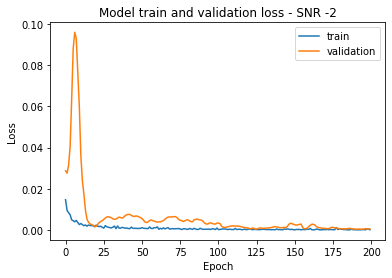


Training SNR = -2 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 3s 242ms/step - loss: 0.0063 - accuracy: 0.9991 - val_loss: 2.0846e-04 - val_accuracy: 1.0000
Epoch 2/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0014 - accuracy: 0.9994 - val_loss: 2.5821e-04 - val_accuracy: 1.0000
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0015 - accuracy: 0.9997 - val_loss: 3.0811e-04 - val_accuracy: 1.0000
Epoch 4/200
7/7 [==============================] - 1s 152ms/step - loss: 5.8448e-04 - accuracy: 0.9999 - val_loss: 2.8226e-04 - val_accuracy: 1.0000
Epoch 5/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0011 - accuracy: 0.9995 - val_loss: 2.9290e-04 - val_accuracy: 1.0000
Epoch 6/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0050 - accuracy: 0.9989 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 7/200
7/7 [==============================] - 1s 151ms/step - loss: 

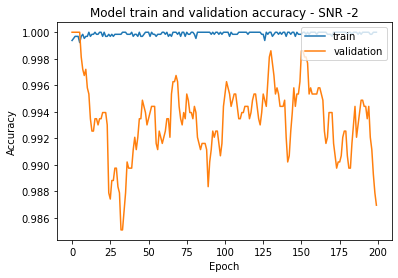

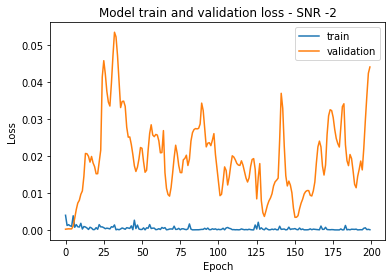


Training SNR = -2 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 3s 234ms/step - loss: 0.0436 - accuracy: 0.9873 - val_loss: 0.3354 - val_accuracy: 0.9054
Epoch 2/200
7/7 [==============================] - 1s 154ms/step - loss: 0.0236 - accuracy: 0.9929 - val_loss: 0.3140 - val_accuracy: 0.8979
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.0141 - accuracy: 0.9971 - val_loss: 0.3251 - val_accuracy: 0.8858
Epoch 4/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0137 - accuracy: 0.9962 - val_loss: 0.3137 - val_accuracy: 0.8839
Epoch 5/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0115 - accuracy: 0.9975 - val_loss: 0.2960 - val_accuracy: 0.8914
Epoch 6/200
7/7 [==============================] - 1s 151ms/step - loss: 0.0099 - accuracy: 0.9982 - val_loss: 0.2604 - val_accuracy: 0.9002
Epoch 7/200
7/7 [==============================] - 1s 153ms/step - loss: 0.0103 - accuracy: 0.9977

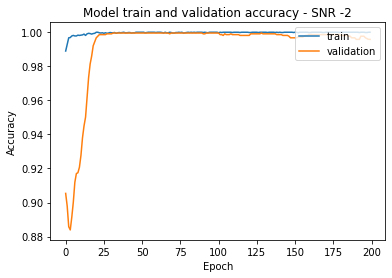

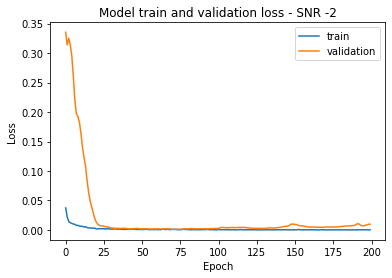

In [ ]:
for i in range(5, 10):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_labels_fft_curr = y_labels_data[:,i].flatten()
  y_data_fft_curr = np.zeros(shape=(y_labels_fft_curr.shape[0], 3))
  
  for j in range(y_labels_fft_curr.shape[0]):
    if(0<=y_labels_fft_curr[j] and y_labels_fft_curr[j]<=9):
      y_data_fft_curr[j][0] = 1
    elif(10<=y_labels_fft_curr[j] and y_labels_fft_curr[j]<=12):
      y_data_fft_curr[j][1] = 1
    else:
      y_data_fft_curr[j][2] = 1

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)


Score of SNR on All SNR model without Transfer Learning 0 = 98.78787994384766
Score of SNR on High SNR model without Transfer Learning 0 = 100.0
Score of SNR on low SNR model without Transfer Learning 0 = 88.90442848205566

Training SNR = 0 Data

Epoch 1/200
7/7 [==============================] - 4s 238ms/step - loss: 1.1449 - accuracy: 0.5029 - val_loss: 2.6832 - val_accuracy: 0.2592
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.6340 - accuracy: 0.7803 - val_loss: 0.9931 - val_accuracy: 0.6904
Epoch 3/200
7/7 [==============================] - 1s 158ms/step - loss: 0.4350 - accuracy: 0.8718 - val_loss: 0.5743 - val_accuracy: 0.7949
Epoch 4/200
7/7 [==============================] - 1s 159ms/step - loss: 0.3014 - accuracy: 0.9318 - val_loss: 1.5436 - val_accuracy: 0.6634
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2081 - accuracy: 0.9598 - val_loss: 2.6027 - val_accuracy: 0.6634
Epoch 6/200
7/7 [==============================

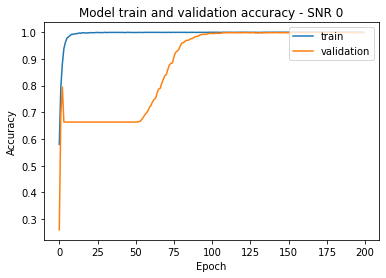

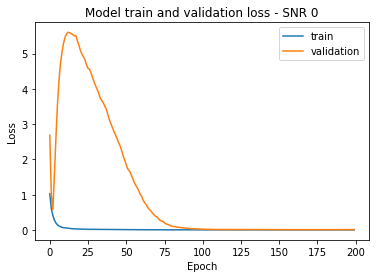


Score of SNR on All SNR model without Transfer Learning 2 = 98.08858036994934
Score of SNR on High SNR model without Transfer Learning 2 = 99.90676045417786
Score of SNR on low SNR model without Transfer Learning 2 = 89.04429078102112

Training SNR = 2 Data

Epoch 1/200
7/7 [==============================] - 3s 229ms/step - loss: 1.0071 - accuracy: 0.5708 - val_loss: 2.4597 - val_accuracy: 0.2373
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 0.4812 - accuracy: 0.8392 - val_loss: 0.5988 - val_accuracy: 0.8499
Epoch 3/200
7/7 [==============================] - 1s 149ms/step - loss: 0.2997 - accuracy: 0.9193 - val_loss: 0.6381 - val_accuracy: 0.7995
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1863 - accuracy: 0.9641 - val_loss: 1.8221 - val_accuracy: 0.6513
Epoch 5/200
7/7 [==============================] - 1s 158ms/step - loss: 0.1241 - accuracy: 0.9825 - val_loss: 2.9316 - val_accuracy: 0.6513
Epoch 6/200
7/7 [==================

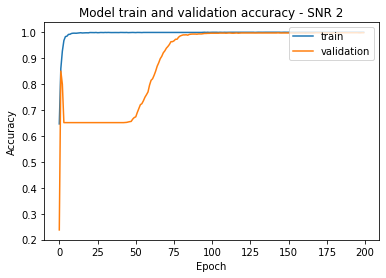

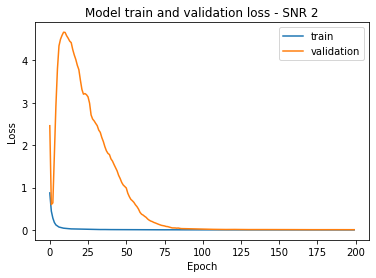


Score of SNR on All SNR model without Transfer Learning 4 = 98.32167625427246
Score of SNR on High SNR model without Transfer Learning 4 = 100.0
Score of SNR on low SNR model without Transfer Learning 4 = 89.37063217163086

Training SNR = 4 Data

Epoch 1/200
7/7 [==============================] - 3s 244ms/step - loss: 0.8997 - accuracy: 0.6075 - val_loss: 1.9681 - val_accuracy: 0.2695
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.3687 - accuracy: 0.8820 - val_loss: 0.5774 - val_accuracy: 0.8308
Epoch 3/200
7/7 [==============================] - 1s 159ms/step - loss: 0.2169 - accuracy: 0.9480 - val_loss: 0.5193 - val_accuracy: 0.8233
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.1310 - accuracy: 0.9801 - val_loss: 1.6528 - val_accuracy: 0.6667
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.0922 - accuracy: 0.9893 - val_loss: 2.7337 - val_accuracy: 0.6667
Epoch 6/200
7/7 [==============================

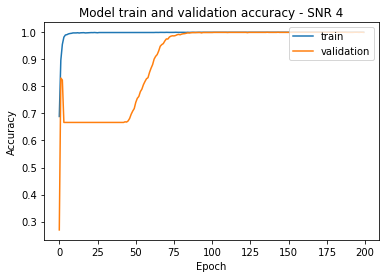

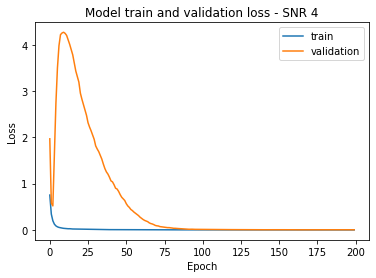


Score of SNR on All SNR model without Transfer Learning 6 = 97.90209531784058
Score of SNR on High SNR model without Transfer Learning 6 = 100.0
Score of SNR on low SNR model without Transfer Learning 6 = 89.37063217163086

Training SNR = 6 Data

Epoch 1/200
7/7 [==============================] - 4s 229ms/step - loss: 1.1089 - accuracy: 0.5315 - val_loss: 3.5013 - val_accuracy: 0.2252
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.4727 - accuracy: 0.8458 - val_loss: 0.7315 - val_accuracy: 0.7702
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 0.2748 - accuracy: 0.9324 - val_loss: 0.6106 - val_accuracy: 0.8131
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1723 - accuracy: 0.9709 - val_loss: 1.8444 - val_accuracy: 0.6685
Epoch 5/200
7/7 [==============================] - 1s 150ms/step - loss: 0.1206 - accuracy: 0.9828 - val_loss: 2.9064 - val_accuracy: 0.6681
Epoch 6/200
7/7 [==============================

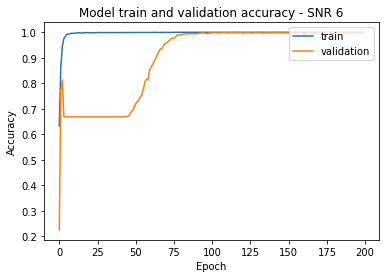

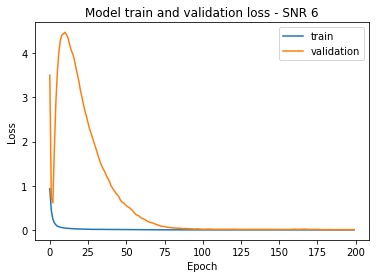


Score of SNR on All SNR model without Transfer Learning 8 = 97.48252034187317
Score of SNR on High SNR model without Transfer Learning 8 = 100.0
Score of SNR on low SNR model without Transfer Learning 8 = 87.22610473632812

Training SNR = 8 Data

Epoch 1/200
7/7 [==============================] - 4s 240ms/step - loss: 0.6969 - accuracy: 0.7097 - val_loss: 1.9717 - val_accuracy: 0.2079
Epoch 2/200
7/7 [==============================] - 1s 150ms/step - loss: 0.2411 - accuracy: 0.9341 - val_loss: 0.5160 - val_accuracy: 0.8392
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 0.1337 - accuracy: 0.9760 - val_loss: 0.2606 - val_accuracy: 0.9119
Epoch 4/200
7/7 [==============================] - 1s 149ms/step - loss: 0.0888 - accuracy: 0.9863 - val_loss: 0.9936 - val_accuracy: 0.7068
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0624 - accuracy: 0.9920 - val_loss: 1.8240 - val_accuracy: 0.6704
Epoch 6/200
7/7 [==============================

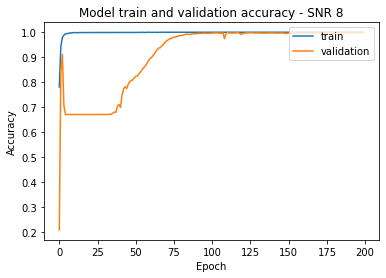

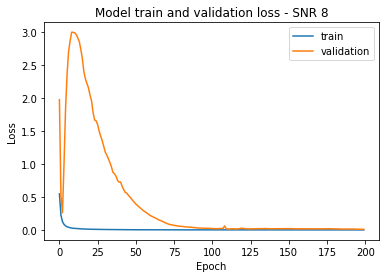

In [ ]:
for i in range(10, 15):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_labels_fft_curr = y_labels_data[:,i].flatten()
  y_data_fft_curr = np.zeros(shape=(y_labels_fft_curr.shape[0], 3))
  
  for j in range(y_labels_fft_curr.shape[0]):
    if(0<=y_labels_fft_curr[j] and y_labels_fft_curr[j]<=9):
      y_data_fft_curr[j][0] = 1
    elif(10<=y_labels_fft_curr[j] and y_labels_fft_curr[j]<=12):
      y_data_fft_curr[j][1] = 1
    else:
      y_data_fft_curr[j][2] = 1

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)


Score of SNR on All SNR model without Transfer Learning 10 = 97.85547852516174
Score of SNR on High SNR model without Transfer Learning 10 = 100.0
Score of SNR on low SNR model without Transfer Learning 10 = 88.39160799980164

Training SNR = 10 Data

Epoch 1/200
7/7 [==============================] - 3s 221ms/step - loss: 0.8997 - accuracy: 0.6068 - val_loss: 3.6097 - val_accuracy: 0.2033
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 0.2998 - accuracy: 0.9169 - val_loss: 1.6648 - val_accuracy: 0.4252
Epoch 3/200
7/7 [==============================] - 1s 207ms/step - loss: 0.1740 - accuracy: 0.9649 - val_loss: 0.2329 - val_accuracy: 0.9506
Epoch 4/200
7/7 [==============================] - 1s 148ms/step - loss: 0.1126 - accuracy: 0.9874 - val_loss: 0.3091 - val_accuracy: 0.8862
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0837 - accuracy: 0.9897 - val_loss: 0.7091 - val_accuracy: 0.7217
Epoch 6/200
7/7 [==========================

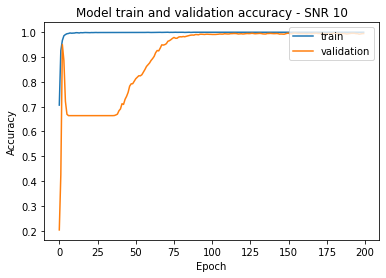

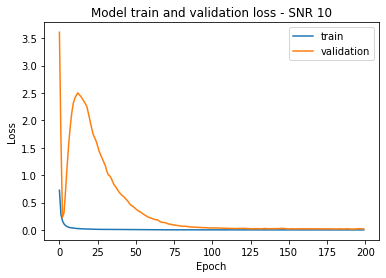


Score of SNR on All SNR model without Transfer Learning 12 = 98.04195761680603
Score of SNR on High SNR model without Transfer Learning 12 = 100.0
Score of SNR on low SNR model without Transfer Learning 12 = 89.2307698726654

Training SNR = 12 Data

Epoch 1/200
7/7 [==============================] - 3s 236ms/step - loss: 0.7871 - accuracy: 0.6501 - val_loss: 2.2987 - val_accuracy: 0.2298
Epoch 2/200
7/7 [==============================] - 1s 147ms/step - loss: 0.2758 - accuracy: 0.9330 - val_loss: 0.9445 - val_accuracy: 0.6438
Epoch 3/200
7/7 [==============================] - 1s 147ms/step - loss: 0.1525 - accuracy: 0.9740 - val_loss: 0.1791 - val_accuracy: 0.9711
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.1040 - accuracy: 0.9902 - val_loss: 0.3369 - val_accuracy: 0.8858
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0741 - accuracy: 0.9932 - val_loss: 0.7813 - val_accuracy: 0.7082
Epoch 6/200
7/7 [===========================

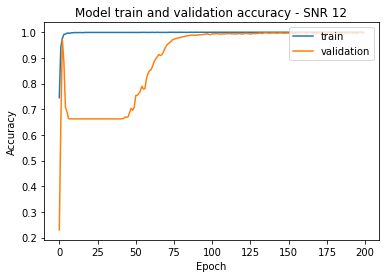

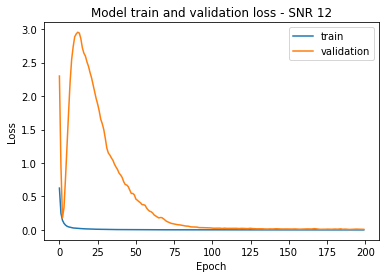


Score of SNR on All SNR model without Transfer Learning 14 = 97.90209531784058
Score of SNR on High SNR model without Transfer Learning 14 = 100.0
Score of SNR on low SNR model without Transfer Learning 14 = 88.0652666091919

Training SNR = 14 Data

Epoch 1/200
7/7 [==============================] - 3s 237ms/step - loss: 0.9675 - accuracy: 0.5780 - val_loss: 2.8396 - val_accuracy: 0.2107
Epoch 2/200
7/7 [==============================] - 1s 146ms/step - loss: 0.3285 - accuracy: 0.9107 - val_loss: 1.1387 - val_accuracy: 0.6238
Epoch 3/200
7/7 [==============================] - 1s 146ms/step - loss: 0.1814 - accuracy: 0.9652 - val_loss: 0.1630 - val_accuracy: 0.9823
Epoch 4/200
7/7 [==============================] - 1s 147ms/step - loss: 0.1227 - accuracy: 0.9849 - val_loss: 0.2497 - val_accuracy: 0.9198
Epoch 5/200
7/7 [==============================] - 1s 148ms/step - loss: 0.0883 - accuracy: 0.9913 - val_loss: 0.6372 - val_accuracy: 0.7263
Epoch 6/200
7/7 [===========================

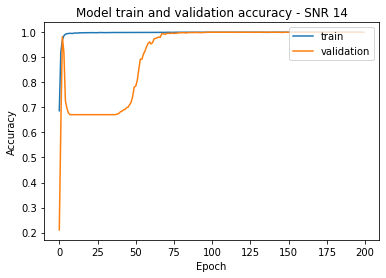

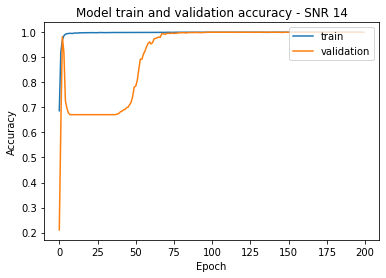

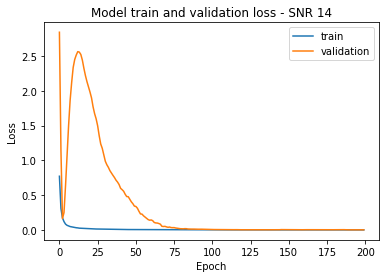

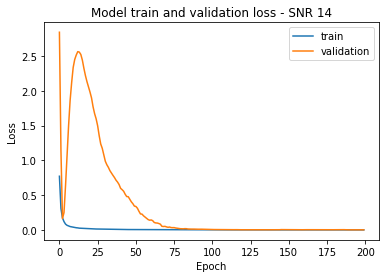


Score of SNR on All SNR model without Transfer Learning 16 = 97.90209531784058

Score of SNR on All SNR model without Transfer Learning 16 = 97.90209531784058
Score of SNR on High SNR model without Transfer Learning 16 = 100.0
Score of SNR on High SNR model without Transfer Learning 16 = 100.0
Score of SNR on low SNR model without Transfer Learning 16 = 87.73892521858215

Training SNR = 16 Data

Epoch 1/200
Score of SNR on low SNR model without Transfer Learning 16 = 87.73892521858215

Training SNR = 16 Data

Epoch 1/200
7/7 [==============================] - 3s 242ms/step - loss: 0.8721 - accuracy: 0.6206 - val_loss: 2.6006 - val_accuracy: 0.2112
Epoch 2/200
7/7 [==============================] - 1s 148ms/step - loss: 0.2848 - accuracy: 0.9203 - val_loss: 1.1566 - val_accuracy: 0.5716
Epoch 3/200
Epoch 3/200
7/7 [==============================] - 1s 151ms/step - loss: 0.1483 - accuracy: 0.9751 - val_loss: 0.1844 - val_accuracy: 0.9748
Epoch 4/200
Epoch 4/200
7/7 [====================

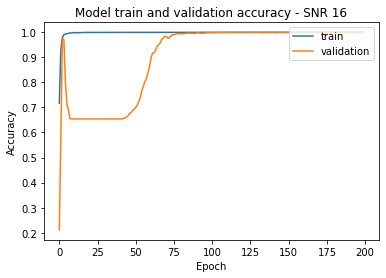

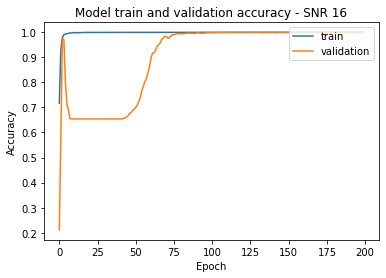

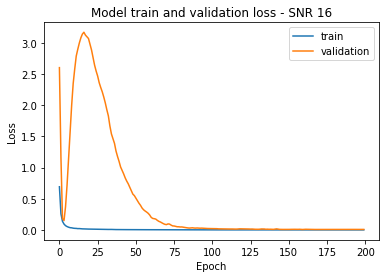

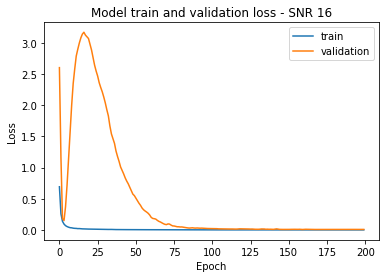


Score of SNR on All SNR model without Transfer Learning 18 = 97.48252034187317

Score of SNR on All SNR model without Transfer Learning 18 = 97.48252034187317
Score of SNR on High SNR model without Transfer Learning 18 = 100.0
Score of SNR on High SNR model without Transfer Learning 18 = 100.0
Score of SNR on low SNR model without Transfer Learning 18 = 88.53147029876709

Training SNR = 18 Data

Epoch 1/200
Score of SNR on low SNR model without Transfer Learning 18 = 88.53147029876709

Training SNR = 18 Data

Epoch 1/200
7/7 [==============================] - 3s 236ms/step - loss: 1.1787 - accuracy: 0.5441 - val_loss: 5.0424 - val_accuracy: 0.2084
Epoch 2/200
7/7 [==============================] - 1s 154ms/step - loss: 0.3739 - accuracy: 0.8839 - val_loss: 4.9429 - val_accuracy: 0.2541
Epoch 3/200
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.2059 - accuracy: 0.9529 - val_loss: 2.6319 - val_accuracy: 0.3772
Epoch 4/200
Epoch 4/200
7/7 [====================

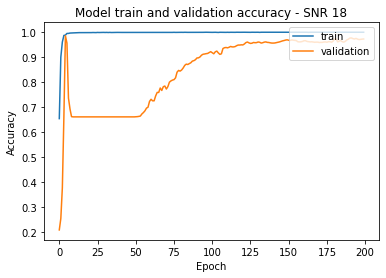

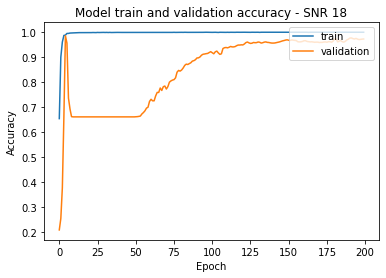

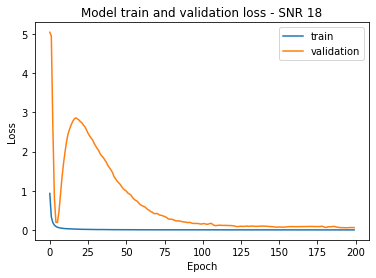

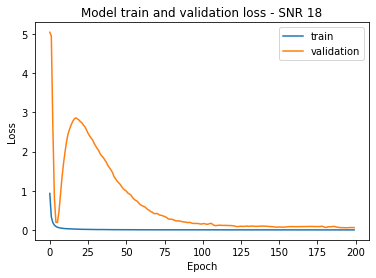


Score of SNR on All SNR model without Transfer Learning 20 = 97.57575988769531

Score of SNR on All SNR model without Transfer Learning 20 = 97.57575988769531
Score of SNR on High SNR model without Transfer Learning 20 = 100.0
Score of SNR on High SNR model without Transfer Learning 20 = 100.0
Score of SNR on low SNR model without Transfer Learning 20 = 88.25174570083618

Training SNR = 20 Data

Epoch 1/200
Score of SNR on low SNR model without Transfer Learning 20 = 88.25174570083618

Training SNR = 20 Data

Epoch 1/200
7/7 [==============================] - 3s 239ms/step - loss: 0.7508 - accuracy: 0.6668 - val_loss: 2.2039 - val_accuracy: 0.2084
Epoch 2/200
7/7 [==============================] - 1s 159ms/step - loss: 0.2477 - accuracy: 0.9382 - val_loss: 1.2316 - val_accuracy: 0.4974
Epoch 3/200
Epoch 3/200
7/7 [==============================] - 1s 152ms/step - loss: 0.1321 - accuracy: 0.9788 - val_loss: 0.2284 - val_accuracy: 0.9520
Epoch 4/200
Epoch 4/200
7/7 [====================

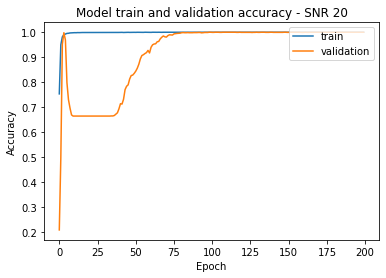

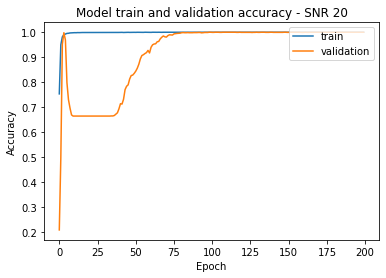

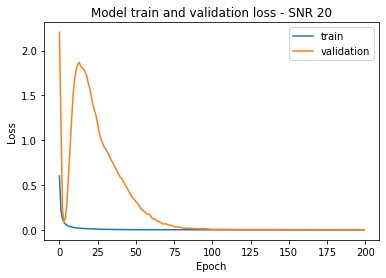

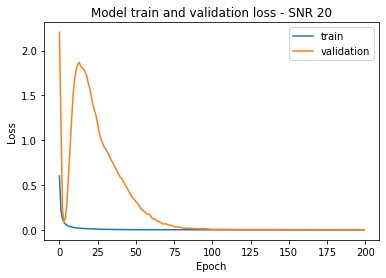

In [ ]:
for i in range(15, 21):

  x_data_fft_curr = np.reshape(x_data_fft_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft_curr, (x_dim[0]*x_dim[2], num_samples*2)))
  fft_data_2d = np.reshape(fft_data_flat, (x_dim[0]*x_dim[2], num_samples, 2))
  x_data_fft_curr = fft_data_2d.reshape(-1, num_samples, 2, 1)

  y_labels_fft_curr = y_labels_data[:,i].flatten()
  y_data_fft_curr = np.zeros(shape=(y_labels_fft_curr.shape[0], 3))
  
  for j in range(y_labels_fft_curr.shape[0]):
    if(0<=y_labels_fft_curr[j] and y_labels_fft_curr[j]<=9):
      y_data_fft_curr[j][0] = 1
    elif(10<=y_labels_fft_curr[j] and y_labels_fft_curr[j]<=12):
      y_data_fft_curr[j][1] = 1
    else:
      y_data_fft_curr[j][2] = 1

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_fft_curr, y_data_fft_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  Testing(X_test_curr, Y_test_curr, i)
  train_data(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)

# Confusion Martix

##Channel Classification

In [ ]:
x_dim = x_data_fft_data.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]
print(num_snapshots_per_tech)

15015


In [ ]:
y_labels = y_labels_data.flatten()
x_data_fft = np.reshape(x_data_fft_data, (total_num_snapshots, x_dim[3], x_dim[4]))

from sklearn.preprocessing import StandardScaler
scaler_std = StandardScaler()

fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft, (total_num_snapshots, num_samples*2)))
fft_data_2d = np.reshape(fft_data_flat, (total_num_snapshots, num_samples, 2))
fft_data_iq = fft_data_2d.reshape(-1, num_samples, 2, 1)

In [ ]:
from keras import models

x_models = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/cnnFFTdata_allSNR.tf"))
pred = x_models.predict(fft_data_iq)

In [ ]:
Y_pred = np.zeros(shape=(fft_data_iq.shape[0],15))
for i in range(pred.shape[0]):
  temp_max = max(pred[i])
  for j in range(15):
    if(temp_max == pred[i][j]):
      Y_pred[i][j] = 1

y_act = y_labels
y_pred = np.argmax(Y_pred, axis = 1)

In [ ]:
import matplotlib.pyplot as plt
import itertools

def plot_confusion_matrix(cm, size, title='Confusion matrix', target_names=None, cmap=None, normalize=True, labels=True, grid=True, colorbar=True):

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        
    plt.figure(figsize=size)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    if colorbar:
      plt.colorbar()

    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    
    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)
    
    if labels:
        for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            if normalize:
                plt.text(j, i, "{:0.2f}".format(cm[i, j]),
                         horizontalalignment="center",
                         color="white" if cm[i, j] > thresh else "black")
            else:
                plt.text(j, i, "{:,}".format(cm[i, j]),
                         horizontalalignment="center",
                         color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    if grid:
      plt.grid()
    plt.ylabel('True label ->')
    plt.xlabel('Predicted label ->')
    #\nB: Bluetooth    W: Wi-Fi    Z: Zigbee\n(The number followed by the signal name represents the channel number)
    plt.show()

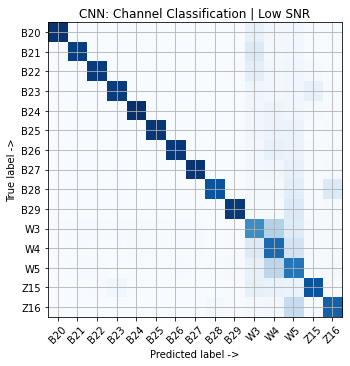

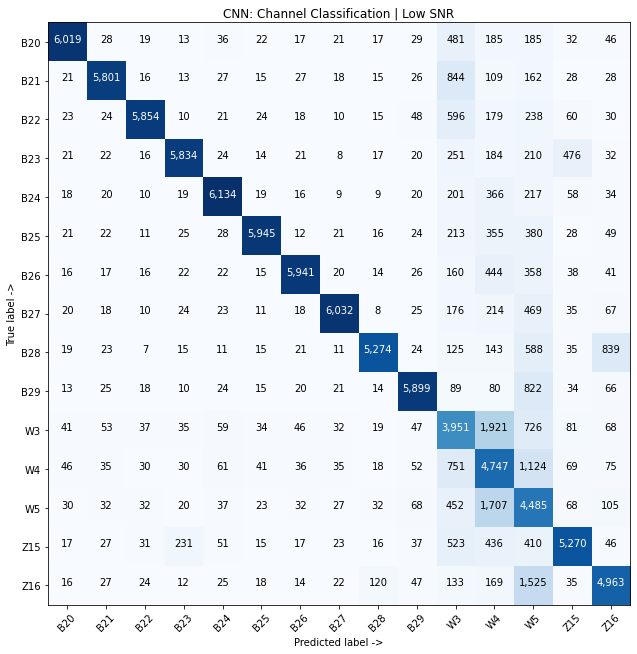

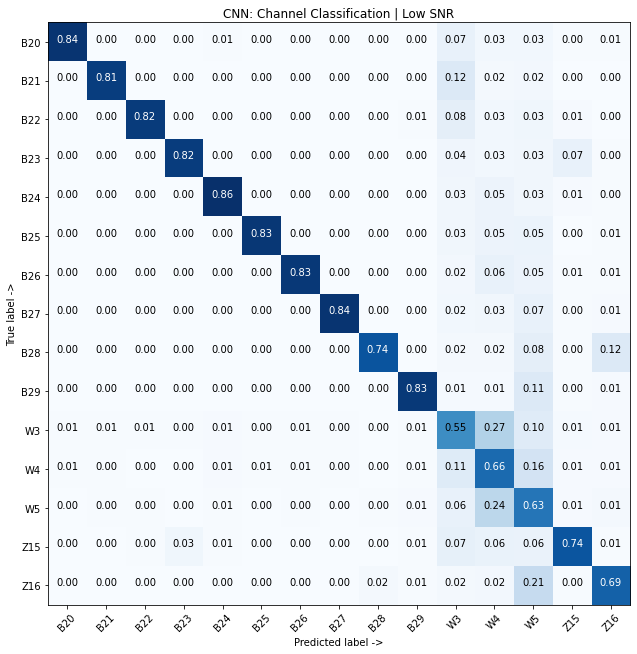


Classfication Report:
               precision    recall  f1-score   support

         B20       0.95      0.84      0.89      7150
         B21       0.94      0.81      0.87      7150
         B22       0.95      0.82      0.88      7150
         B23       0.92      0.82      0.87      7150
         B24       0.93      0.86      0.89      7150
         B25       0.95      0.83      0.89      7150
         B26       0.95      0.83      0.89      7150
         B27       0.96      0.84      0.90      7150
         B28       0.94      0.74      0.83      7150
         B29       0.92      0.83      0.87      7150
          W3       0.44      0.55      0.49      7150
          W4       0.42      0.66      0.52      7150
          W5       0.38      0.63      0.47      7150
         Z15       0.83      0.74      0.78      7150
         Z16       0.76      0.69      0.73      7150

    accuracy                           0.77    107250
   macro avg       0.82      0.77      0.78    107250
we

In [ ]:
#low snr 

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

conf_mat = confusion_matrix(y_act, y_pred)
class_names = ['B20', 'B21', 'B22', 'B23', 'B24', 'B25', 'B26', 'B27', 'B28', 'B29', 'W3', 'W4', 'W5', 'Z15', 'Z16']
title = 'CNN: Channel Classification | Low SNR'

size = (7,5)
plot_confusion_matrix(conf_mat, size, title, class_names, normalize=False, colorbar=False, labels=False)
size = (12,9)
plot_confusion_matrix(conf_mat, size, title, class_names, grid=False, colorbar=False, normalize=False)
plot_confusion_matrix(conf_mat, size, title, class_names, grid=False, colorbar=False, normalize=True)

print("\nClassfication Report:\n", classification_report(y_act, y_pred, target_names=class_names))

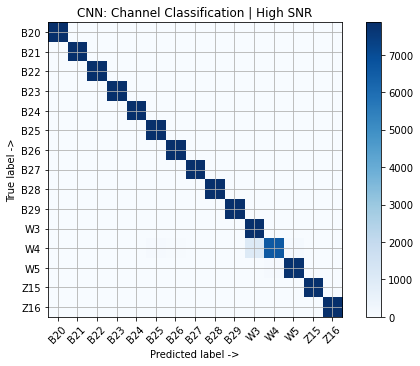

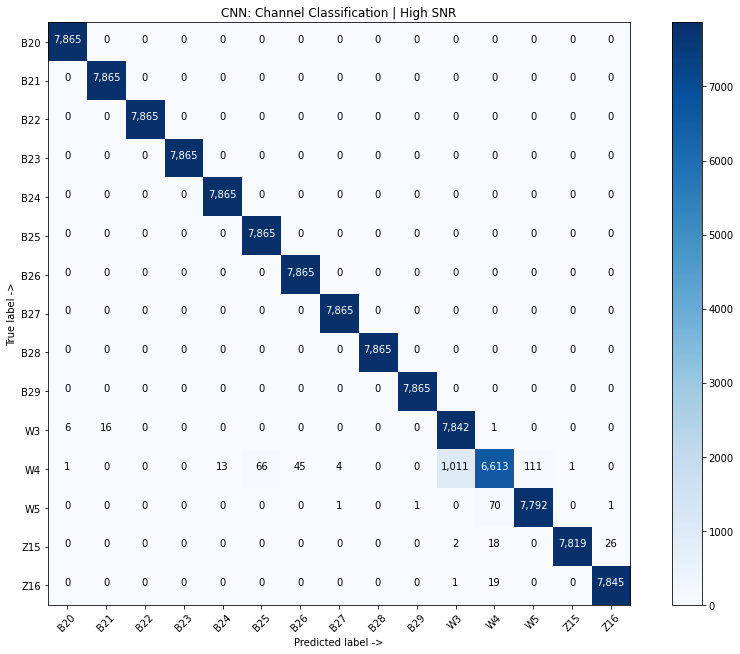

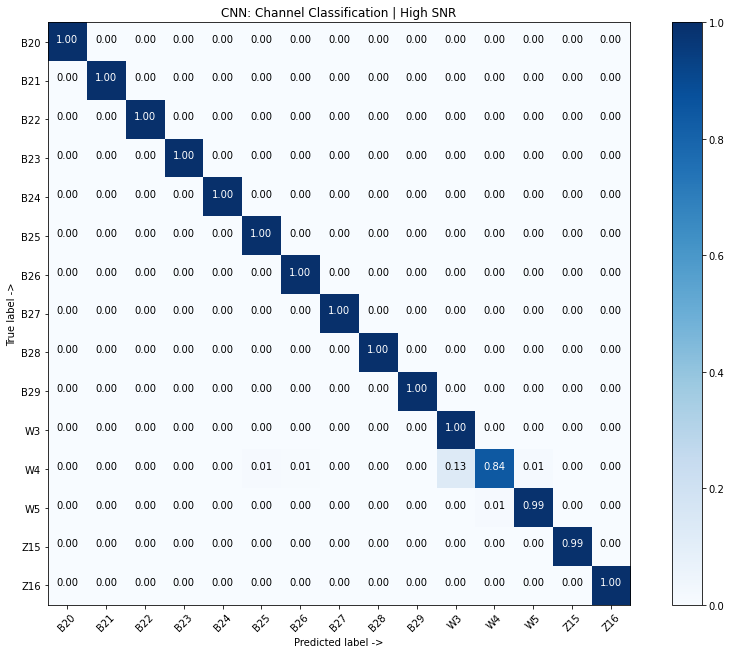


Classfication Report:
               precision    recall  f1-score   support

         B20       1.00      1.00      1.00      7865
         B21       1.00      1.00      1.00      7865
         B22       1.00      1.00      1.00      7865
         B23       1.00      1.00      1.00      7865
         B24       1.00      1.00      1.00      7865
         B25       0.99      1.00      1.00      7865
         B26       0.99      1.00      1.00      7865
         B27       1.00      1.00      1.00      7865
         B28       1.00      1.00      1.00      7865
         B29       1.00      1.00      1.00      7865
          W3       0.89      1.00      0.94      7865
          W4       0.98      0.84      0.91      7865
          W5       0.99      0.99      0.99      7865
         Z15       1.00      0.99      1.00      7865
         Z16       1.00      1.00      1.00      7865

    accuracy                           0.99    117975
   macro avg       0.99      0.99      0.99    117975
we

In [ ]:
#high snr 

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

conf_mat = confusion_matrix(y_act, y_pred)
class_names = ['B20', 'B21', 'B22', 'B23', 'B24', 'B25', 'B26', 'B27', 'B28', 'B29', 'W3', 'W4', 'W5', 'Z15', 'Z16']
title = 'CNN: Channel Classification | High SNR'

size = (7,5)
plot_confusion_matrix(conf_mat, size, title, class_names, normalize=False, labels=False)
size = (12,9)
plot_confusion_matrix(conf_mat, size, title, class_names, grid=False, normalize=False)
plot_confusion_matrix(conf_mat, size, title, class_names, grid=False, normalize=True)

print("\nClassfication Report:\n", classification_report(y_act, y_pred, target_names=class_names))

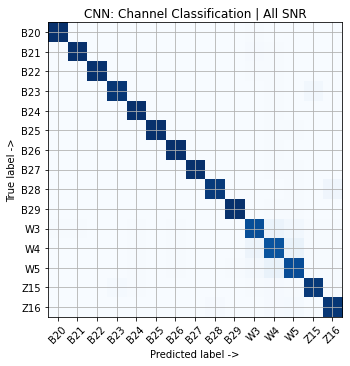

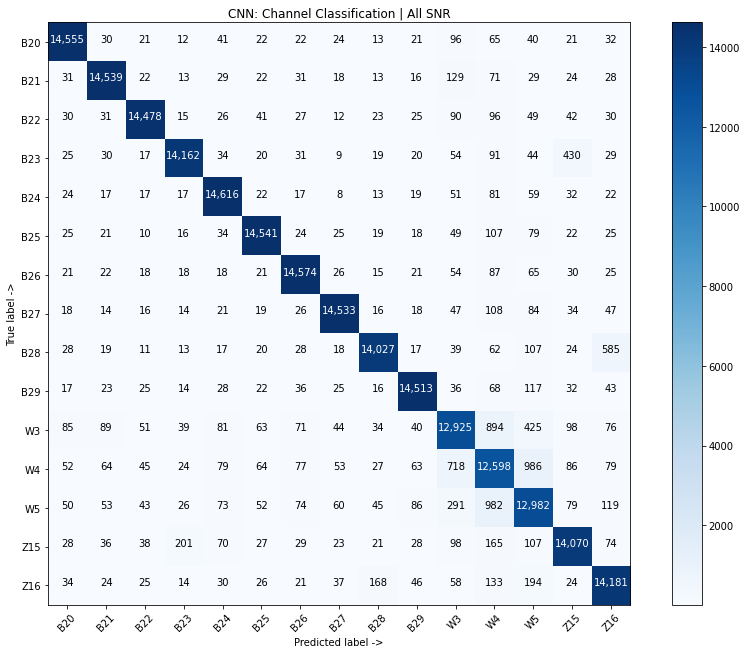

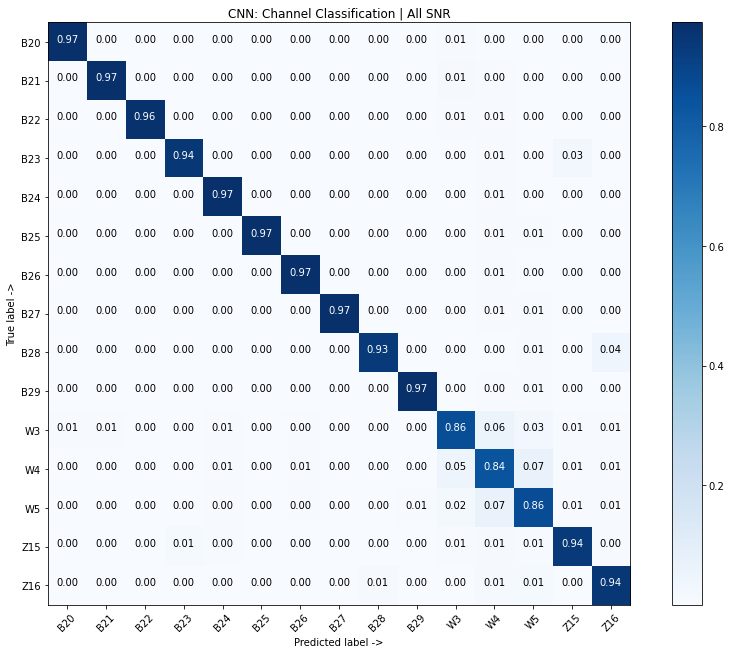


Classfication Report:
               precision    recall  f1-score   support

         B20       0.97      0.97      0.97     15015
         B21       0.97      0.97      0.97     15015
         B22       0.98      0.96      0.97     15015
         B23       0.97      0.94      0.96     15015
         B24       0.96      0.97      0.97     15015
         B25       0.97      0.97      0.97     15015
         B26       0.97      0.97      0.97     15015
         B27       0.97      0.97      0.97     15015
         B28       0.97      0.93      0.95     15015
         B29       0.97      0.97      0.97     15015
          W3       0.88      0.86      0.87     15015
          W4       0.81      0.84      0.82     15015
          W5       0.84      0.86      0.85     15015
         Z15       0.94      0.94      0.94     15015
         Z16       0.92      0.94      0.93     15015

    accuracy                           0.94    225225
   macro avg       0.94      0.94      0.94    225225
we

In [ ]:
#all snr

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

conf_mat = confusion_matrix(y_act, y_pred)
class_names = ['B20', 'B21', 'B22', 'B23', 'B24', 'B25', 'B26', 'B27', 'B28', 'B29', 'W3', 'W4', 'W5', 'Z15', 'Z16']
title = 'CNN: Channel Classification | All SNR'

size = (7,5)
plot_confusion_matrix(conf_mat, size, title, class_names, normalize=False, labels=False, colorbar=False)
size = (12,9)
plot_confusion_matrix(conf_mat, size, title, class_names, grid=False, normalize=False)
plot_confusion_matrix(conf_mat, size, title, class_names, grid=False, normalize=True)

print("\nClassfication Report:\n", classification_report(y_act, y_pred, target_names=class_names))

##Signal Classification

In [ ]:
x_dim = x_data_fft_data.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]
print(num_snapshots_per_tech)

15015


In [ ]:
x_data_fft = np.reshape(x_data_fft_data, (total_num_snapshots, x_dim[3], x_dim[4]))

from sklearn.preprocessing import StandardScaler
scaler_std = StandardScaler()

fft_data_flat = scaler_std.fit_transform(np.reshape(x_data_fft, (total_num_snapshots, num_samples*2)))
fft_data_2d = np.reshape(fft_data_flat, (total_num_snapshots, num_samples, 2))
fft_data_iq = fft_data_2d.reshape(-1, num_samples, 2, 1)

In [ ]:
y_labels_all = y_labels_data.flatten()

y_labels_one_hot_all = np.zeros(shape=(y_labels_all.shape[0],3))
for i in range(y_labels_all.shape[0]):
  if(0<=y_labels_all[i] and y_labels_all[i]<=9):
    y_labels_one_hot_all[i][0] = 1
  elif(10<=y_labels_all[i] and y_labels_all[i]<=12):
    y_labels_one_hot_all[i][1] = 1
  else:
    y_labels_one_hot_all[i][2] = 1

In [ ]:
from keras import models

x_models = models.load_model(("/gdrive/My Drive/Signal Identification Model CNN/Signal Type/cnnFFTdata_allSNR_signalType.tf"))
pred = x_models.predict(fft_data_iq)

In [ ]:
Y_pred = np.zeros(shape=(fft_data_iq.shape[0],3))
for i in range(pred.shape[0]):
  temp_max = max(pred[i])
  for j in range(3):
    if(temp_max == pred[i][j]):
      Y_pred[i][j] = 1

y_act = np.argmax(y_labels_one_hot_all, axis = 1)
y_pred = np.argmax(Y_pred, axis = 1)

In [ ]:
import itertools

def plot_confusion_matrix(cm, size, title='Confusion matrix', target_names=None, cmap=None, normalize=True, labels=True, grid=True, colorbar=True):

    if cmap is None:
        cmap = plt.get_cmap('Reds')

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        
    plt.figure(figsize=size)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    if colorbar:
      plt.colorbar()

    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    
    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names)
        plt.yticks(tick_marks, target_names)
    
    if labels:
        for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            if normalize:
                plt.text(j, i, "{:0.2f}".format(cm[i, j]),
                         horizontalalignment="center",
                         color="white" if cm[i, j] > thresh else "black")
            else:
                plt.text(j, i, "{:,}".format(cm[i, j]),
                         horizontalalignment="center",
                         color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    if grid:
      plt.grid()
    plt.ylabel('True label ->')
    plt.xlabel('Predicted label ->')
    plt.show()

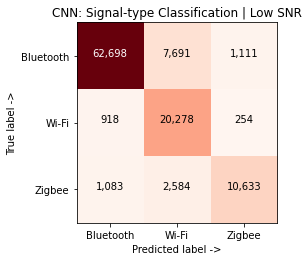

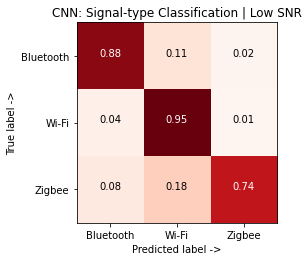


Classfication Report:
               precision    recall  f1-score   support

   Bluetooth       0.97      0.88      0.92     71500
       Wi-Fi       0.66      0.95      0.78     21450
      Zigbee       0.89      0.74      0.81     14300

    accuracy                           0.87    107250
   macro avg       0.84      0.86      0.84    107250
weighted avg       0.90      0.87      0.88    107250



In [ ]:
#low snr

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

conf_mat = confusion_matrix(y_act, y_pred)
class_names = ['Bluetooth', 'Wi-Fi', 'Zigbee']
title = 'CNN: Signal-type Classification | Low SNR'

size = (4,4)
plot_confusion_matrix(conf_mat, size, title, class_names, normalize=False, grid=False, colorbar=False)
plot_confusion_matrix(conf_mat, size, title, class_names, normalize=True, grid=False, colorbar=False)

print("\nClassfication Report:\n", classification_report(y_act, y_pred, target_names=class_names))

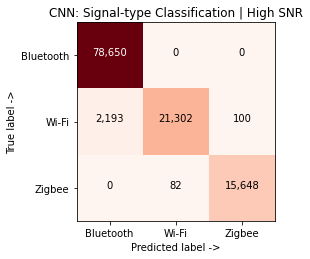

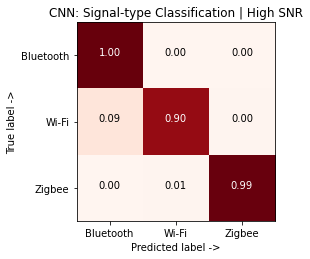


Classfication Report:
               precision    recall  f1-score   support

   Bluetooth       0.97      1.00      0.99     78650
       Wi-Fi       1.00      0.90      0.95     23595
      Zigbee       0.99      0.99      0.99     15730

    accuracy                           0.98    117975
   macro avg       0.99      0.97      0.98    117975
weighted avg       0.98      0.98      0.98    117975



In [ ]:
#high snr

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

conf_mat = confusion_matrix(y_act, y_pred)
class_names = ['Bluetooth', 'Wi-Fi', 'Zigbee']
title = 'CNN: Signal-type Classification | High SNR'


size = (4,4)
plot_confusion_matrix(conf_mat, size, title, class_names, grid=False, normalize=False, colorbar=False)
plot_confusion_matrix(conf_mat, size, title, class_names, grid=False, normalize=True, colorbar=False)

print("\nClassfication Report:\n", classification_report(y_act, y_pred, target_names=class_names))

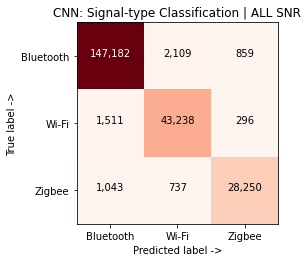

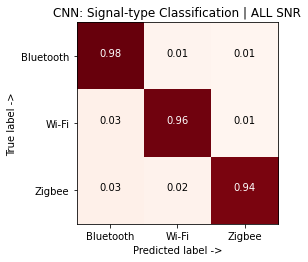


Classfication Report:
               precision    recall  f1-score   support

   Bluetooth       0.98      0.98      0.98    150150
       Wi-Fi       0.94      0.96      0.95     45045
      Zigbee       0.96      0.94      0.95     30030

    accuracy                           0.97    225225
   macro avg       0.96      0.96      0.96    225225
weighted avg       0.97      0.97      0.97    225225



In [ ]:
#all snr

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

conf_mat = confusion_matrix(y_act, y_pred)
class_names = ['Bluetooth', 'Wi-Fi', 'Zigbee']
title = 'CNN: Signal-type Classification | ALL SNR'

size = (4,4)
plot_confusion_matrix(conf_mat, size, title, class_names, grid=False, normalize=False, colorbar=False)
plot_confusion_matrix(conf_mat, size, title, class_names, grid=False, normalize=True, colorbar=False)

print("\nClassfication Report:\n", classification_report(y_act, y_pred, target_names=class_names))